<h1 style='text-align:center;border:10px double;border-color:gray;'>
    <br/>
     PROJET 3<br/>
    <br/>
    <font color = 'Navy'>"Concevez une application au service de la santé publique"</font>
    <br/>
    <br/>
    
</h1>
<h4 style='text-align:left;border-color:gray;'>
    <br/>
    <font color = 'Navy'>* notebook d’exploration</font>
    <br/>
</h4>

 Dirigé par :   [Pouria Forouzesh](https://www.linkedin.com/in/pouria-forouzesh/)

<a id='sommaire'></a>

### Table de matière

**[`Importation des bibliothèques et chargement des données`](#p1)**
    
**[`Analyse univariée des variables`](#p2)**
* [Distribution des variables](#1)  
* [Répartition des nutritions grades](#2)
* [Répartition des catégories](#3)
  

**[`Analyse bivariée des variables`](#p3)**
* [Matrice de corrélation](#9)
* [Standardisation des variables](#10)
* [Test de khi2 indépendance des variables](#11)
* [Test de normalité](#12)
* [Test ANOVA (Analyse de la variance) - Indépendance des variables](#13)


**[`Analyse multivariée`](#p4)**

**[`Idée d'application`](#p5)**
* [Linéaire régression](#4)
* [Régularisation Lasso](#5)
* [Régularisation Ridge](#6)
* [Elastic Net](#7)
* [Random Forest Regressor](#8)

**[`Sauvegarde le Model`](#p6)**




## <div style='background-color: #aac1cb ; padding: 5px; border: 2px solid black;'> 0. Importation des bibliothèques et chargement des données </div>  

In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns 
import datetime
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn import decomposition
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from scipy.stats import normaltest
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import f_oneway
from scipy.stats import chi2
from scipy import stats
from scipy.stats import chi2_contingency 
from scipy import stats
import plotly.graph_objs as go
import plotly.express as px
import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline
    
#Modification des affichages de colonnes, lignes et largeurs de colonnes pour avoir un maximum d'information
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', -1)

In [2]:
df= pd.read_csv('data_clean_principal.csv')


In [3]:
df.shape

(52257, 33)

In [4]:
df.dtypes

energy_100g                                float64
fat_100g                                   float64
saturated-fat_100g                         float64
trans-fat_100g                             float64
cholesterol_100g                           float64
carbohydrates_100g                         float64
sugars_100g                                float64
fiber_100g                                 float64
proteins_100g                              float64
salt_100g                                  float64
sodium_100g                                float64
vitamin-a_100g                             float64
vitamin-c_100g                             float64
calcium_100g                               float64
iron_100g                                  float64
nutrition-score-fr_100g                    float64
code                                       int64  
creator                                    object 
created_t                                  object 
last_modified_t                

**Correction des types de données**

In [5]:
types = pd.read_csv('dtypes.csv')
types.sample(5)

,index,dtypes
26,additives_n,category
5,carbohydrates_100g,float64
32,nutrition_grade_fr,object
17,creator,object
2,saturated-fat_100g,float64


In [6]:
for column in df.columns:
    column_type = types[types['index'].str.match(column)]['dtypes'].values[0]
    df[column] = df[column].astype(column_type)

<a id='p2'></a>

## <div style='background-color: #aac1cb ; padding: 5px; border: 2px solid black;'> 1. Analyse univariée des variables </div>  

[Haut de page](#sommaire)

In [7]:
df.select_dtypes(['int64', 'float64']).describe()

,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
count,52257.000000,52257.000000,52257.000000,52084.000000,52164.000000,52257.000000,52257.000000,52257.000000,52257.000000,52257.000000,52257.000000,52164.000000,52240.000000,52164.000000,52184.000000,52257.000000
mean,1099.414925,12.542185,4.997877,0.210535,0.015867,28.399171,12.149225,1.990206,7.969213,0.903961,0.355890,0.000284,0.033699,0.291947,0.019620,8.173891
std,730.791129,12.626203,6.383577,0.291604,0.026868,25.622661,16.596080,2.569371,6.887814,1.160080,0.456725,0.000210,0.142915,0.239434,0.139763,9.085240
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-14.000000
25%,460.000000,2.100000,0.400000,0.003266,0.000000,5.100000,1.000000,0.000000,2.800000,0.100000,0.039370,0.000124,0.012803,0.121585,0.003293,1.000000
50%,1021.000000,7.900000,2.100000,0.074170,0.002430,18.500000,3.700000,1.136667,6.300000,0.640000,0.251969,0.000236,0.023824,0.186704,0.005512,7.000000
75%,1632.000000,21.000000,7.400000,0.301361,0.017855,52.000000,17.000000,2.900000,11.000000,1.280000,0.503937,0.000414,0.041853,0.378289,0.007521,15.000000
max,9983.000000,63.900000,30.800000,1.000000,0.175000,100.000000,70.200000,16.100000,31.400000,13.600000,5.354331,0.001381,7.500000,1.534000,2.400000,35.000000


<a id='1'></a>

### Distribution des variables

In [8]:
numeric_columns= df.select_dtypes(['int64','float64']).columns
numeric_dataframe= df.select_dtypes(['int64','float64'])

In [9]:
numeric_columns

Index(['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g',
       'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g'],
      dtype='object')

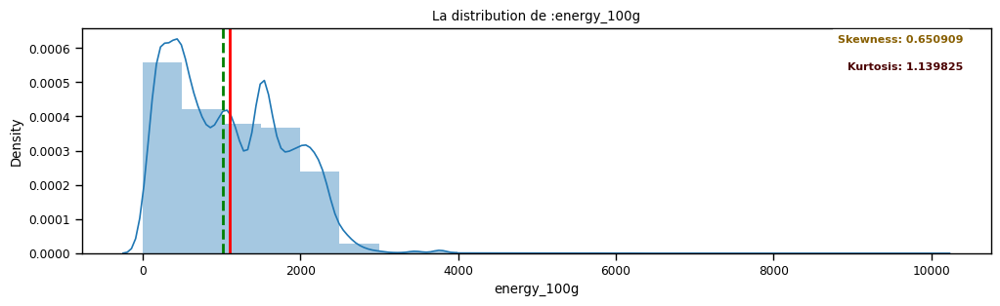

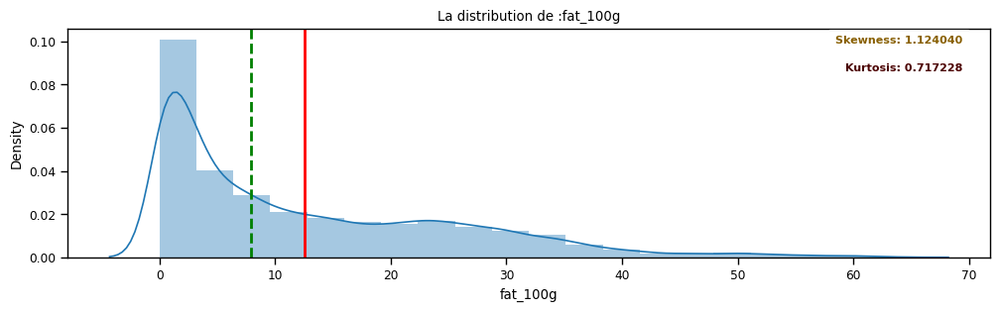

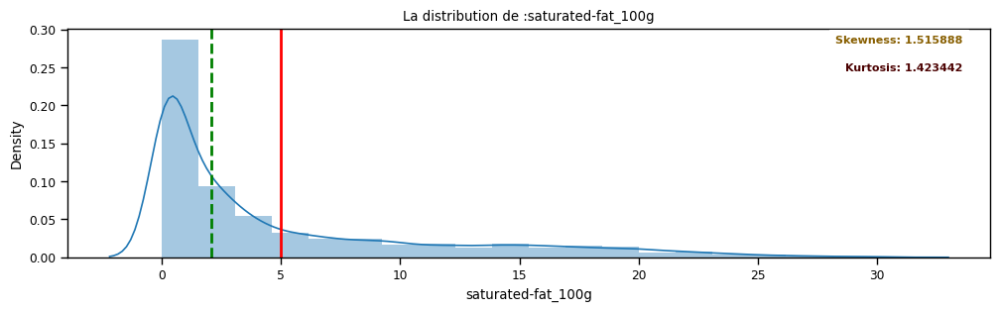

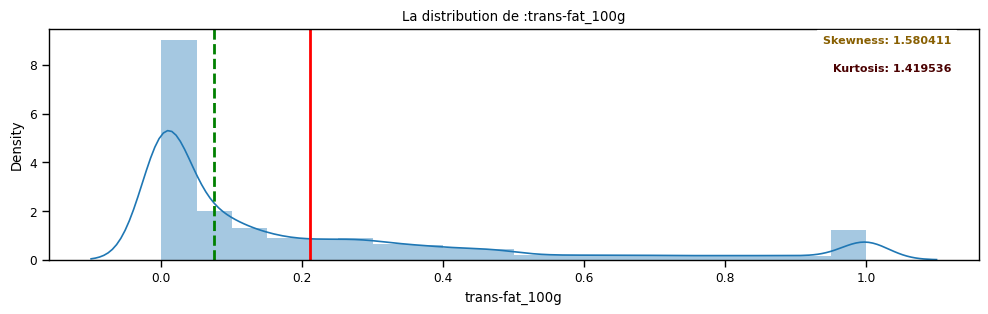

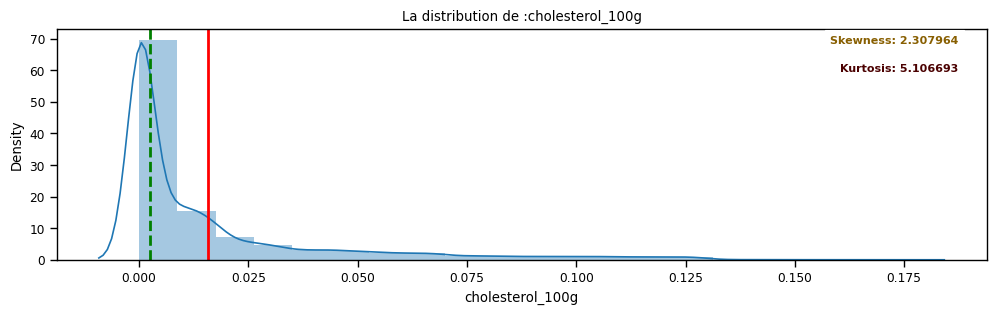

...

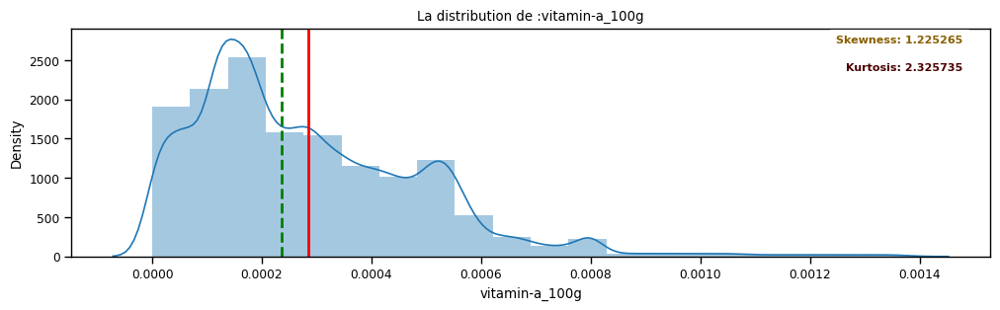

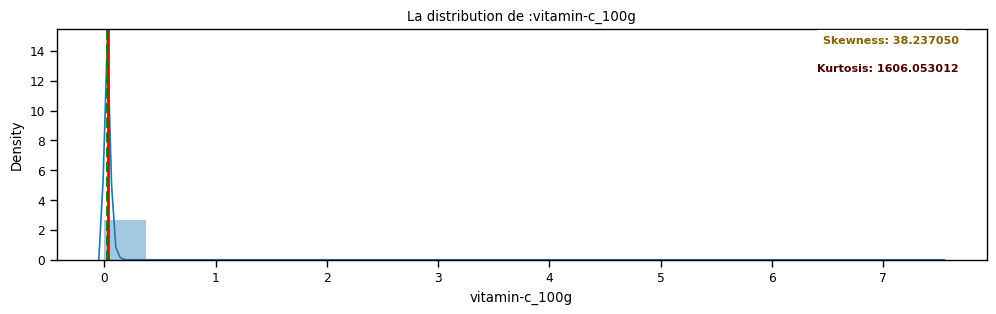

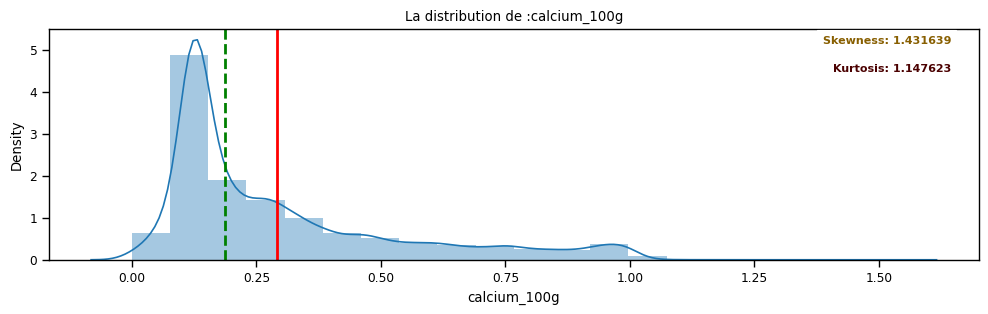

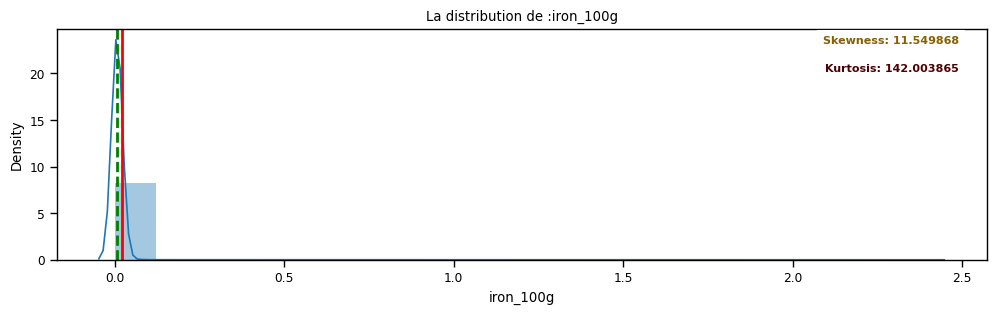

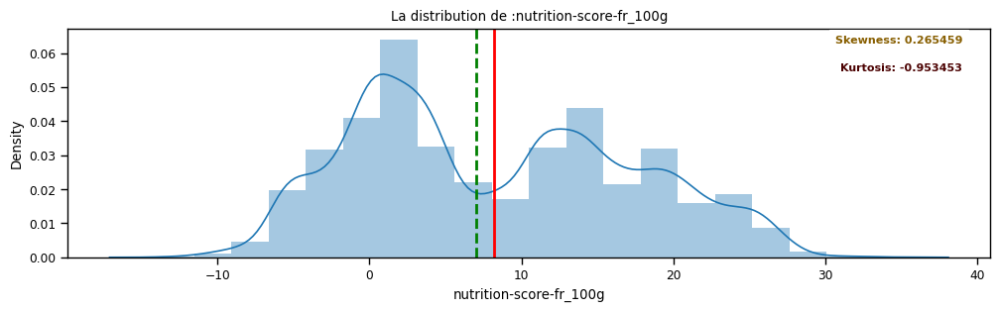

In [10]:
for col in numeric_columns: 
    plt.figure(figsize = (12,3))
    #sns.set(font_scale=1)
    sns.set_context("paper")
    ax = sns.distplot(df[col], bins=20)
    ax.axvline(df[col].mean(), color='red', lw=2 ,label ="Mean")
    ax.axvline(df[col].median(), color='green', lw=2 , ls='--' , label= "Median")
    ax.text(x=0.97, y=0.97, transform=ax.transAxes, s="Skewness: %f" % df[col].skew(),\
        fontweight='demibold', fontsize=8, verticalalignment='top', horizontalalignment='right',\
        backgroundcolor='white', color='xkcd:poo brown')
    ax.text(x=0.97, y=0.85, transform=ax.transAxes, s="Kurtosis: %f" % df[col].kurt(),\
        fontweight='demibold', fontsize=8, verticalalignment='top', horizontalalignment='right',\
        backgroundcolor='white', color='xkcd:dried blood')
    title= 'La distribution de :' +col
    plt.title(title)
    plt.show();

**Boîte à moustaches des variables**

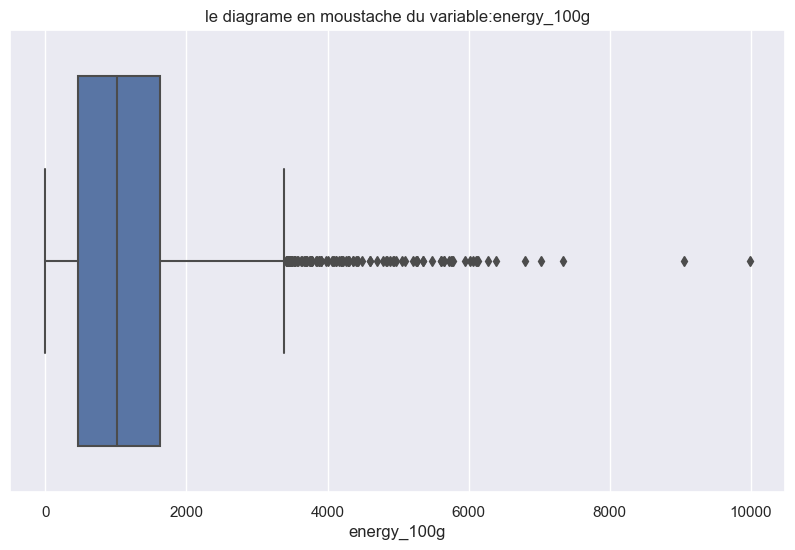

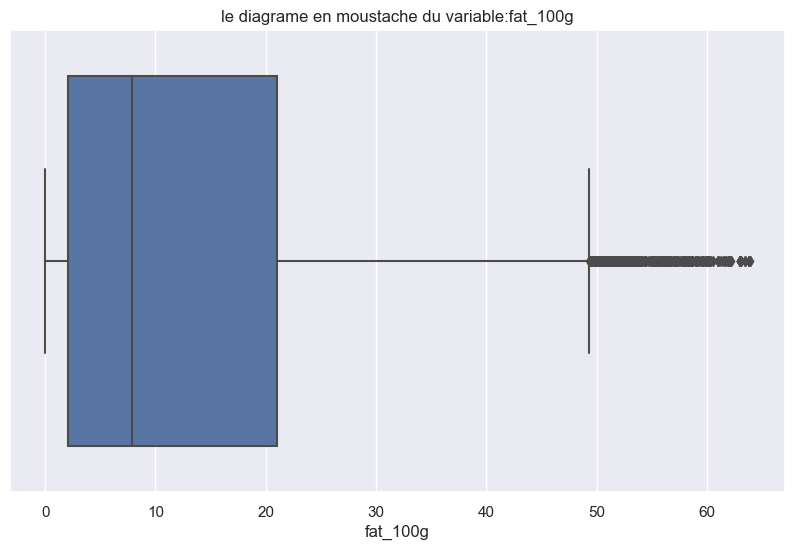

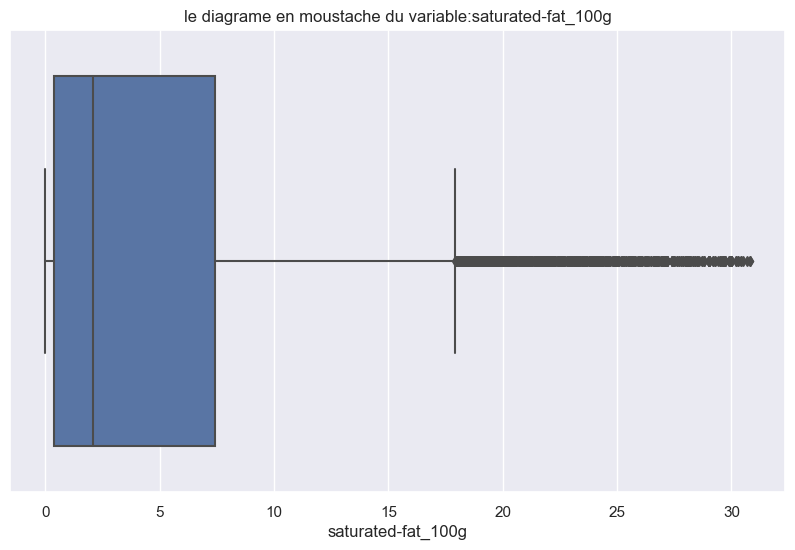

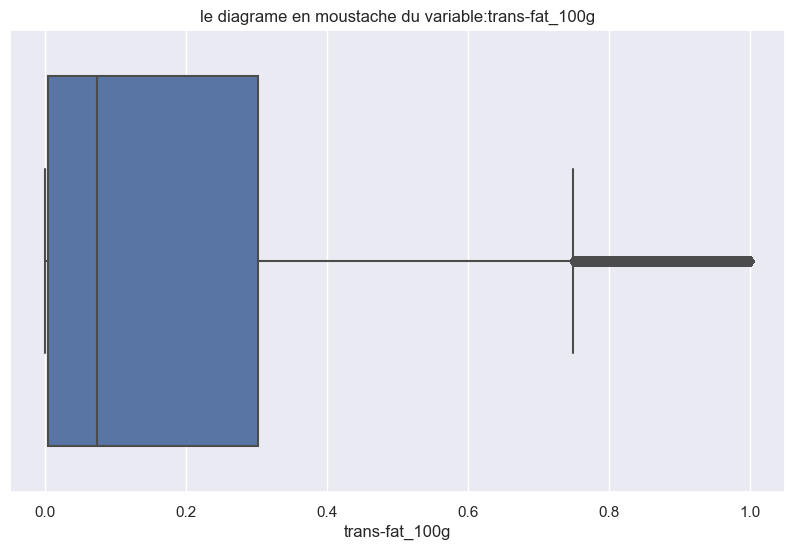

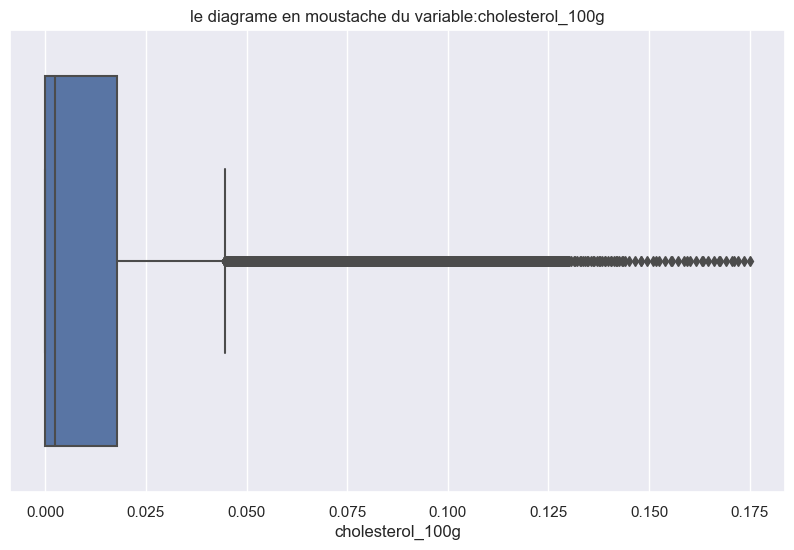

...

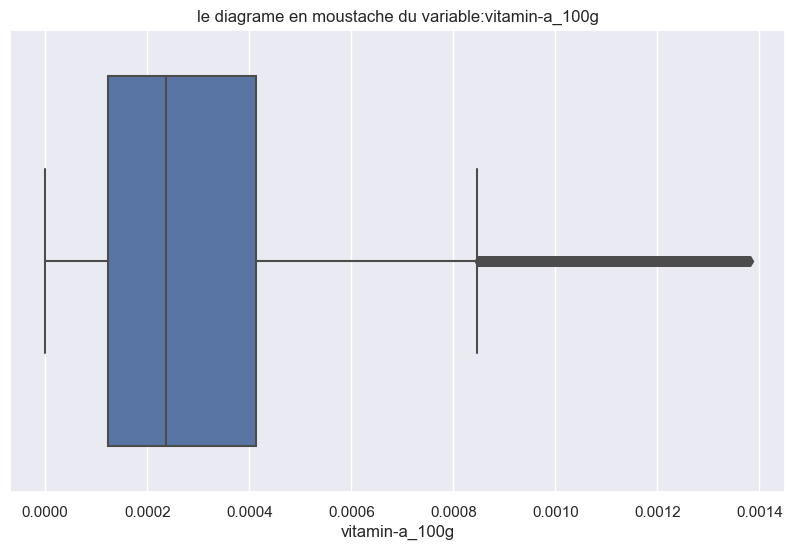

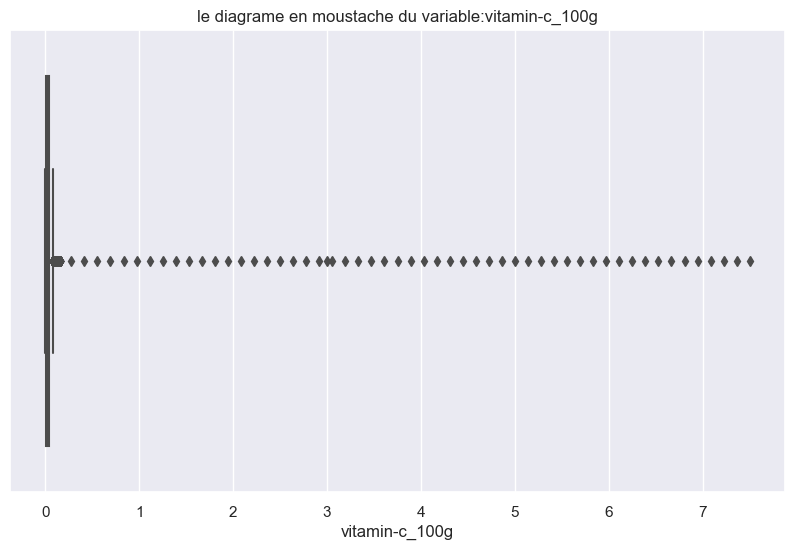

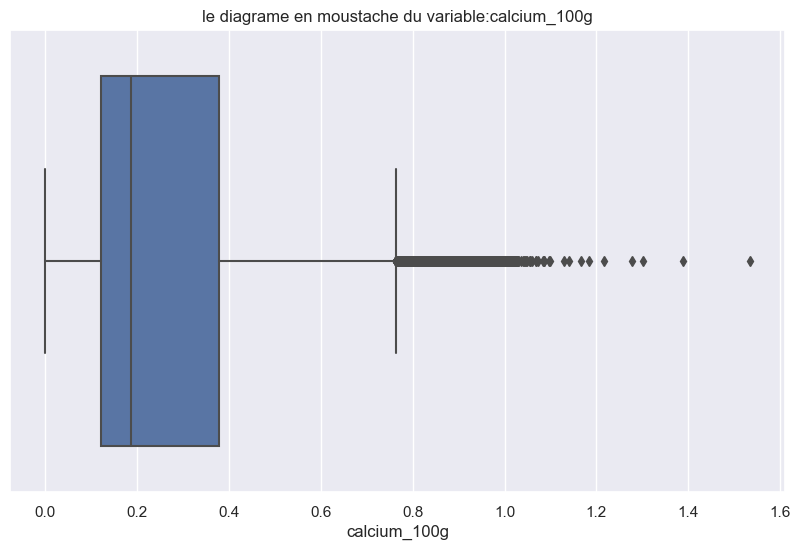

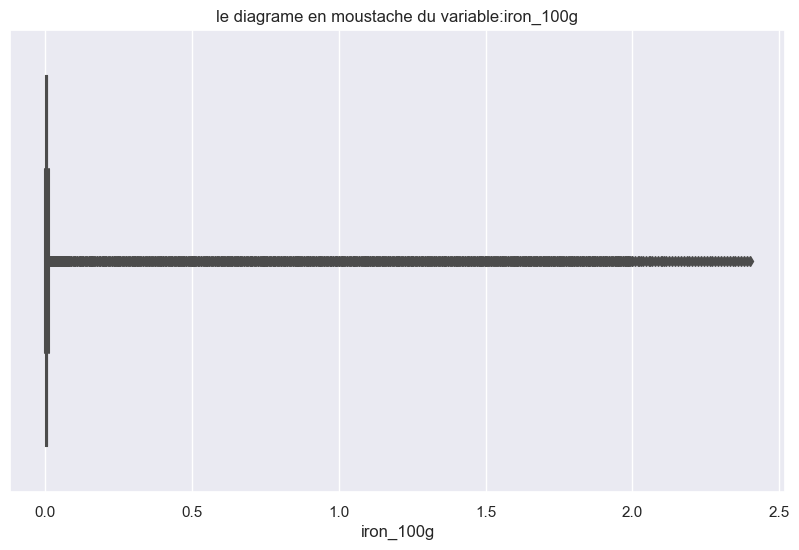

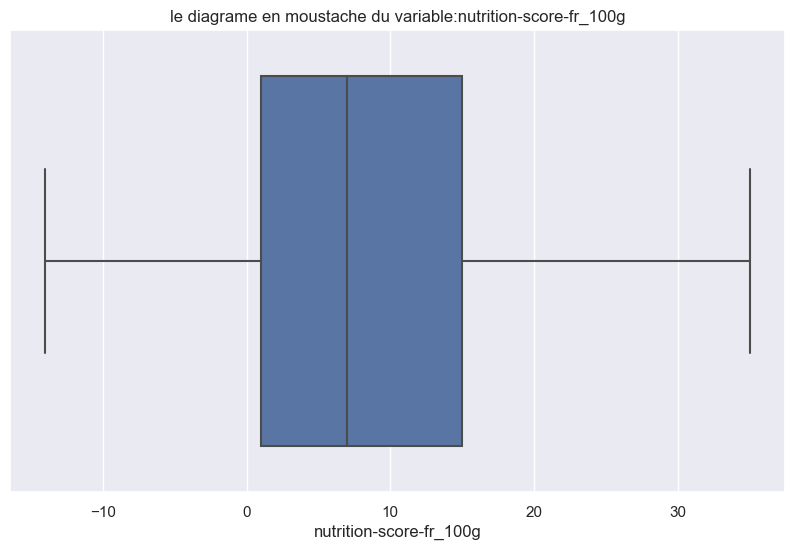

In [11]:
numeric_columns = df.select_dtypes(['int64', 'float64'])
for col in numeric_columns: 
    plt.figure(figsize=(10,6))
    sns.set(font_scale=1)
    sns.boxplot(df[col])
    title='le diagrame en moustache du variable:' +col
    plt.title(title)
    plt.show()

In [12]:
import missingno as msno
import warnings
warnings.filterwarnings('ignore')


%matplotlib inline

from ipywidgets import interact, interact_manual
from P3_DS_Toolbox import *


--------------------------------------------------------------------------------------------------------------------------

Le groupe nutriscore_grade A

ENERGY_100G
Test Shapiro
stat=0.841, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=6758.145, p=0.000
Probablement pas  Gaussien 


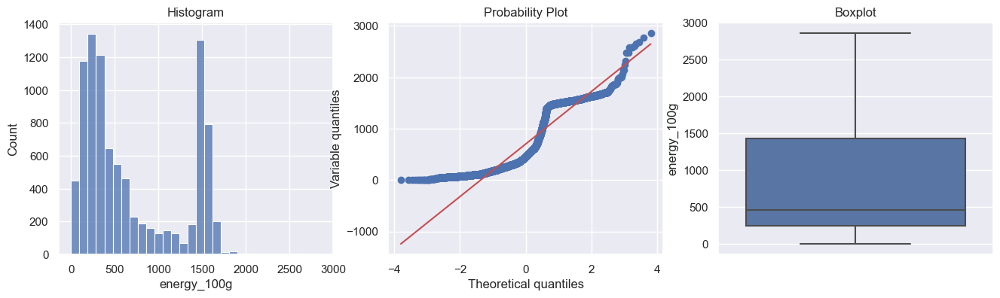

FAT_100G
Test Shapiro
stat=0.634, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=9698.533, p=0.000
Probablement pas  Gaussien 


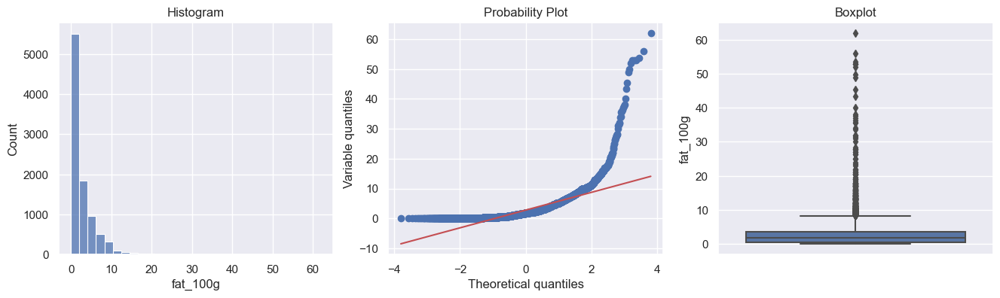

SATURATED-FAT_100G
Test Shapiro
stat=0.748, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=4542.498, p=0.000
Probablement pas  Gaussien 


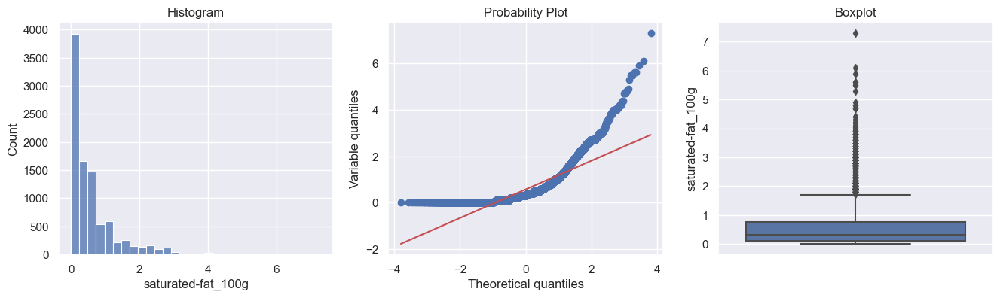

TRANS-FAT_100G
Test Shapiro
stat=nan, p=1.000
Probablement Gaussien 
Test normaltest
stat=nan, p=nan
Probablement pas  Gaussien 


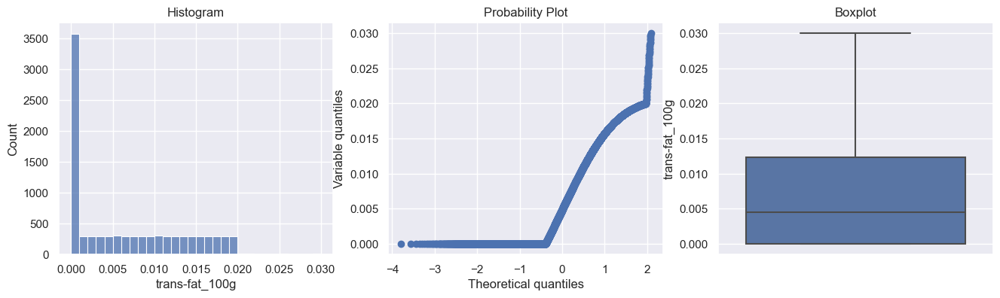

CHOLESTEROL_100G
Test Shapiro
stat=nan, p=1.000
Probablement Gaussien 
Test normaltest
stat=nan, p=nan
Probablement pas  Gaussien 


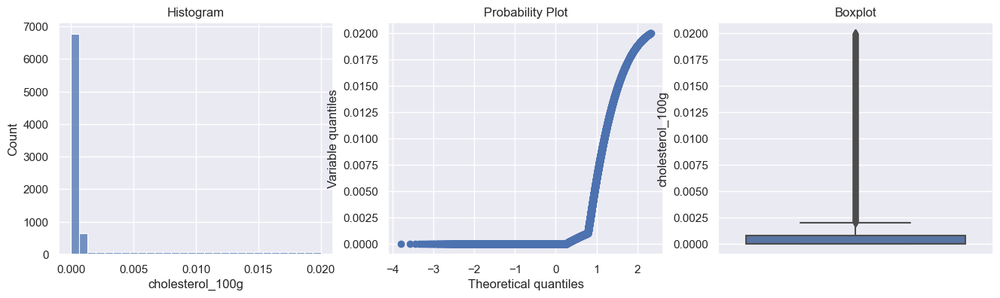

CARBOHYDRATES_100G
Test Shapiro
stat=0.811, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2617.019, p=0.000
Probablement pas  Gaussien 


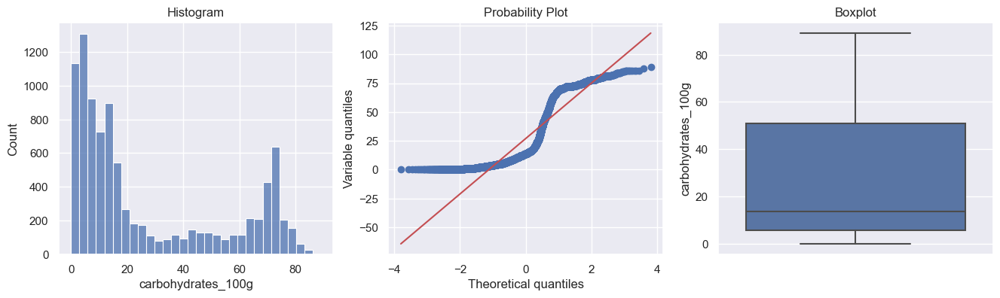

SUGARS_100G
Test Shapiro
stat=0.728, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=4955.971, p=0.000
Probablement pas  Gaussien 


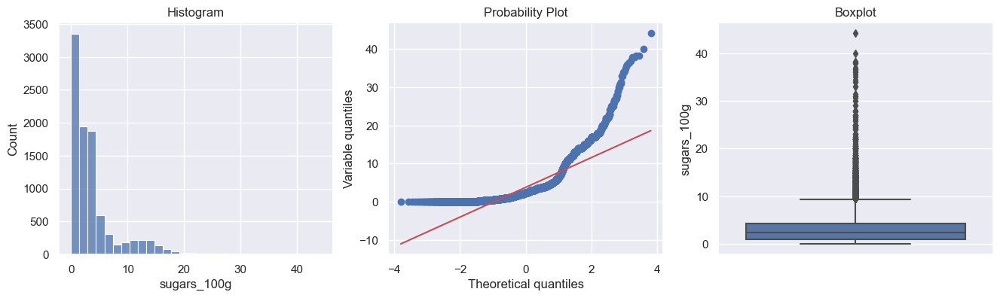

FIBER_100G
Test Shapiro
stat=0.862, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2894.275, p=0.000
Probablement pas  Gaussien 


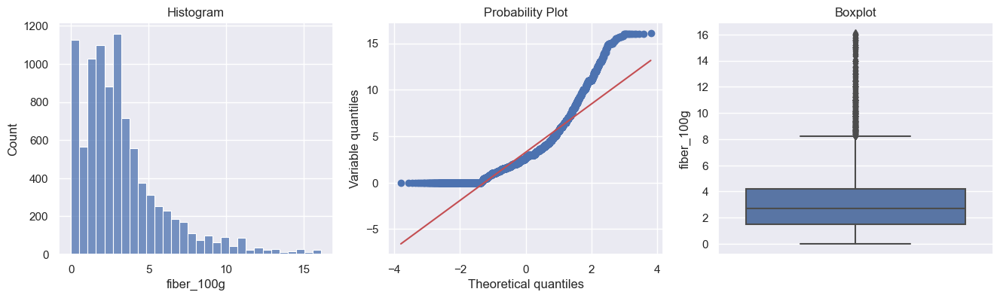

PROTEINS_100G
Test Shapiro
stat=0.922, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=973.542, p=0.000
Probablement pas  Gaussien 


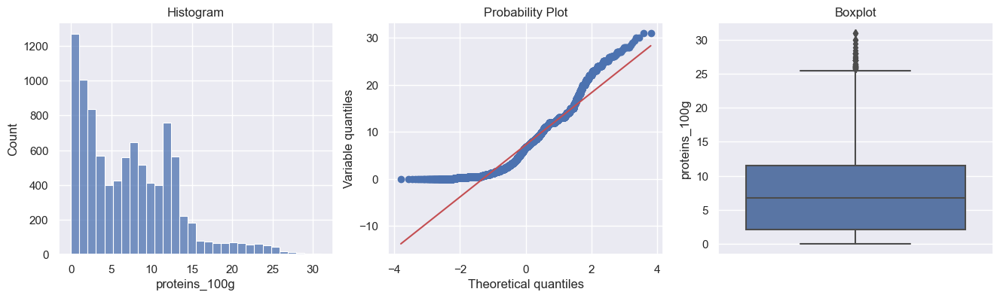

SALT_100G
Test Shapiro
stat=0.831, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=1103.496, p=0.000
Probablement pas  Gaussien 


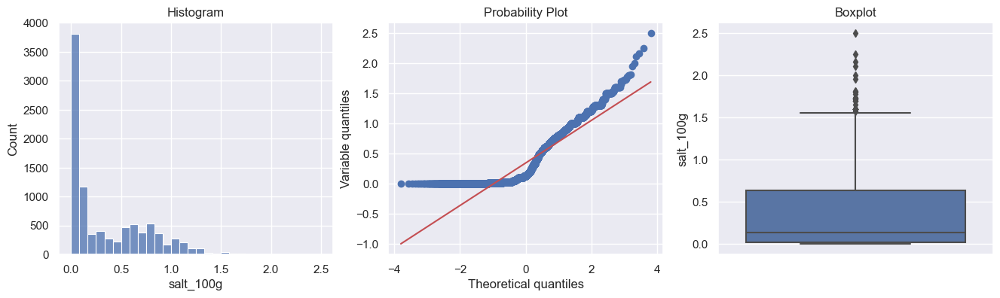

SODIUM_100G
Test Shapiro
stat=0.831, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=1103.476, p=0.000
Probablement pas  Gaussien 


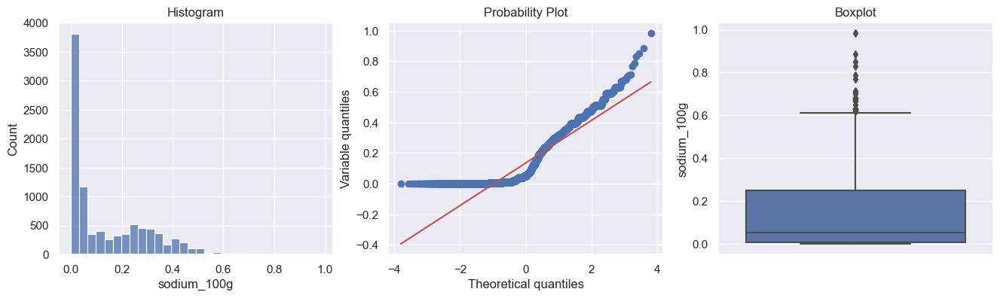

VITAMIN-A_100G
Test Shapiro
stat=nan, p=1.000
Probablement Gaussien 
Test normaltest
stat=nan, p=nan
Probablement pas  Gaussien 


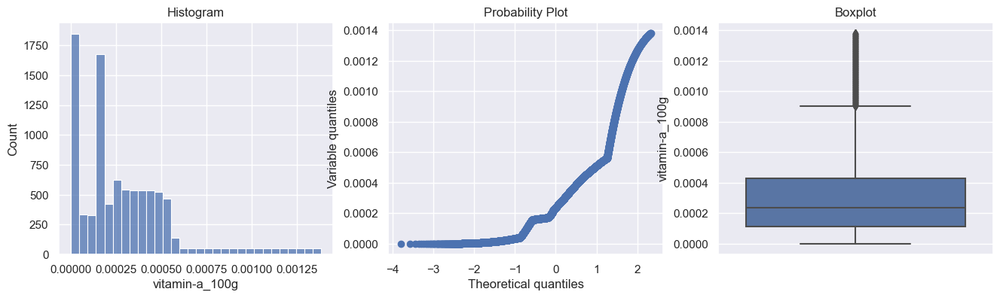

VITAMIN-C_100G
Test Shapiro
stat=nan, p=1.000
Probablement Gaussien 
Test normaltest
stat=nan, p=nan
Probablement pas  Gaussien 


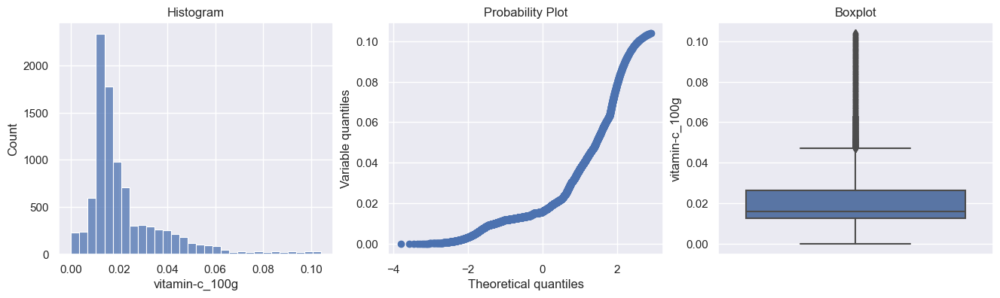

CALCIUM_100G
Test Shapiro
stat=nan, p=1.000
Probablement Gaussien 
Test normaltest
stat=nan, p=nan
Probablement pas  Gaussien 


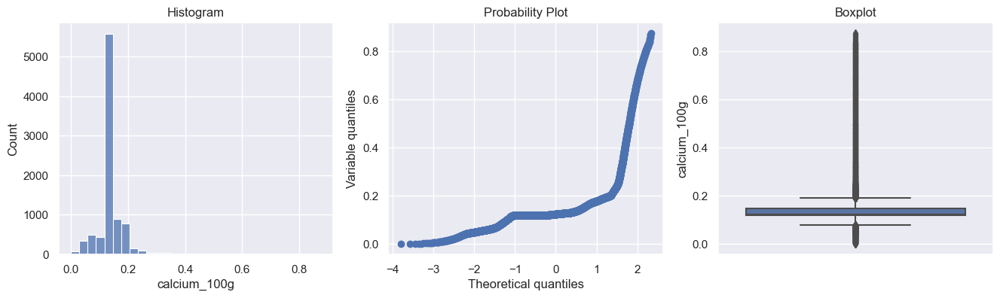

IRON_100G
Test Shapiro
stat=nan, p=1.000
Probablement Gaussien 
Test normaltest
stat=nan, p=nan
Probablement pas  Gaussien 


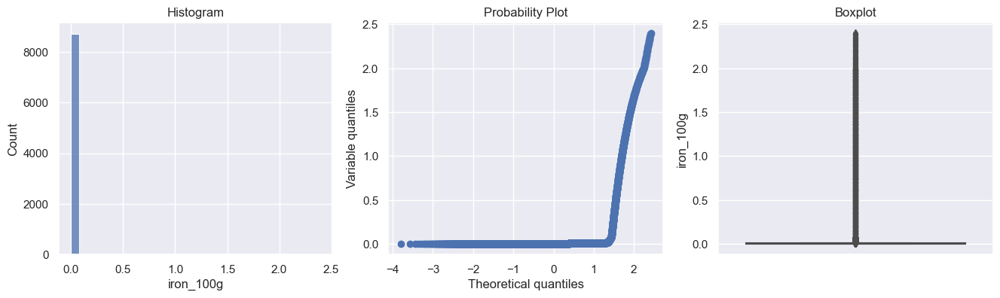

NUTRITION-SCORE-FR_100G
Test Shapiro
stat=0.908, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=939.006, p=0.000
Probablement pas  Gaussien 


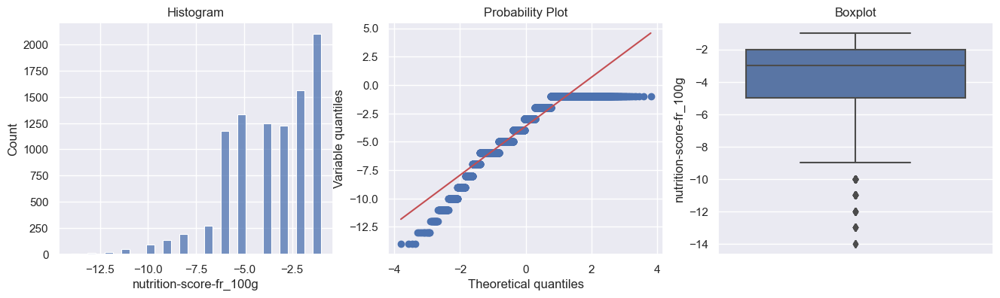


--------------------------------------------------------------------------------------------------------------------------

Le groupe nutriscore_grade B

ENERGY_100G
Test Shapiro
stat=0.866, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=3414.183, p=0.000
Probablement pas  Gaussien 


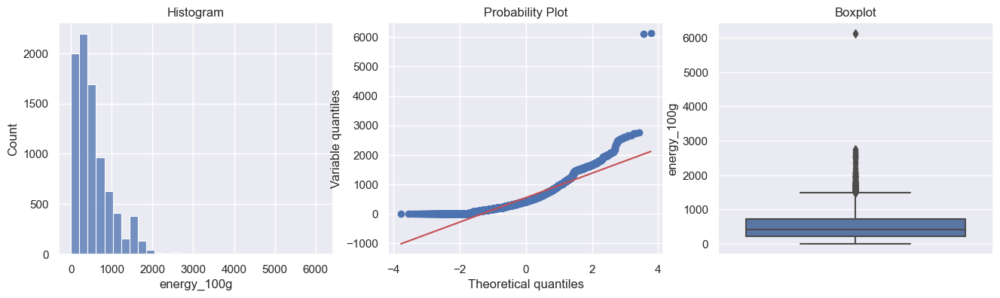

FAT_100G
Test Shapiro
stat=0.712, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=7107.132, p=0.000
Probablement pas  Gaussien 


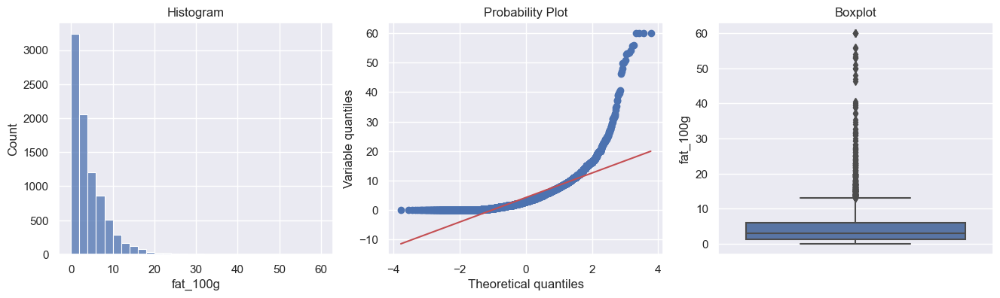

SATURATED-FAT_100G
Test Shapiro
stat=0.843, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2557.329, p=0.000
Probablement pas  Gaussien 


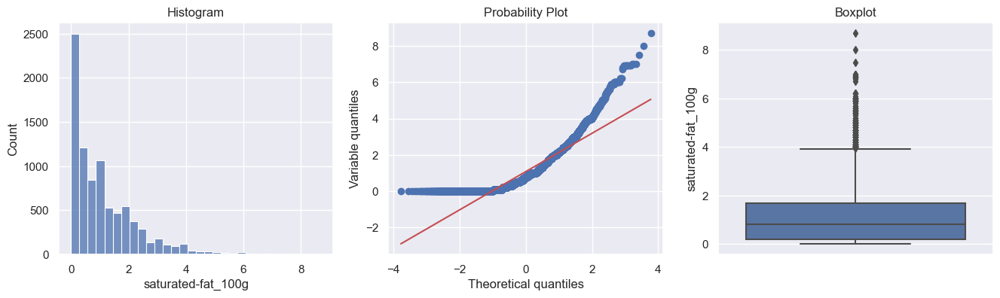

TRANS-FAT_100G
Test Shapiro
stat=0.716, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=1340.686, p=0.000
Probablement pas  Gaussien 


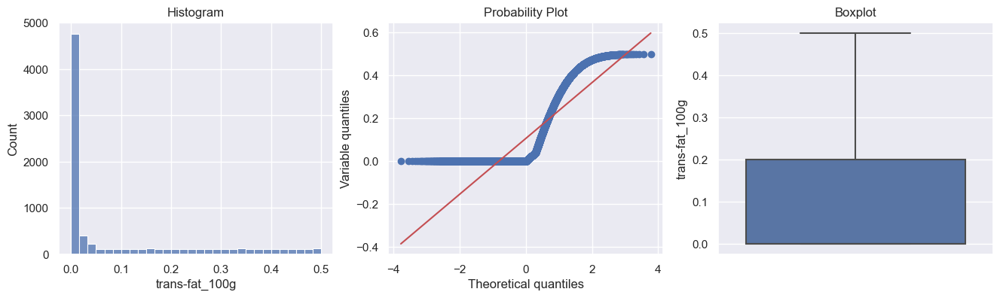

CHOLESTEROL_100G
Test Shapiro
stat=0.591, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=4803.929, p=0.000
Probablement pas  Gaussien 


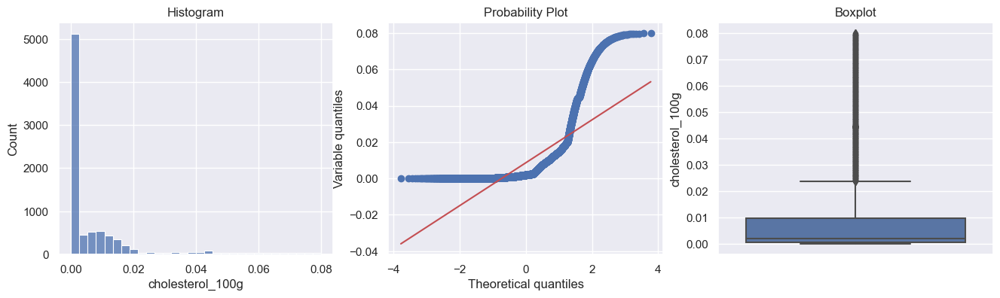

CARBOHYDRATES_100G
Test Shapiro
stat=0.766, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2560.612, p=0.000
Probablement pas  Gaussien 


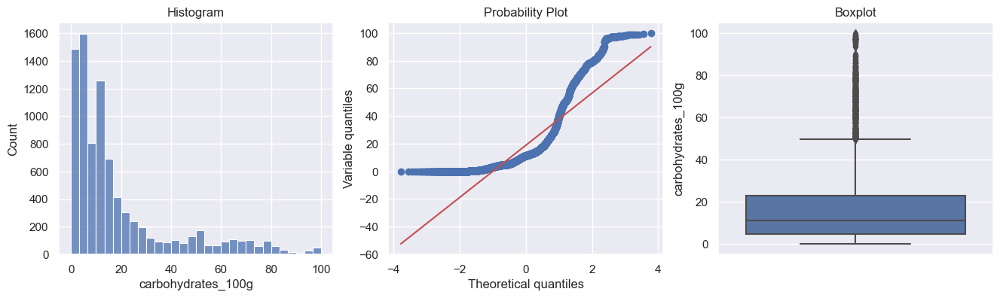

SUGARS_100G
Test Shapiro
stat=0.636, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=7444.178, p=0.000
Probablement pas  Gaussien 


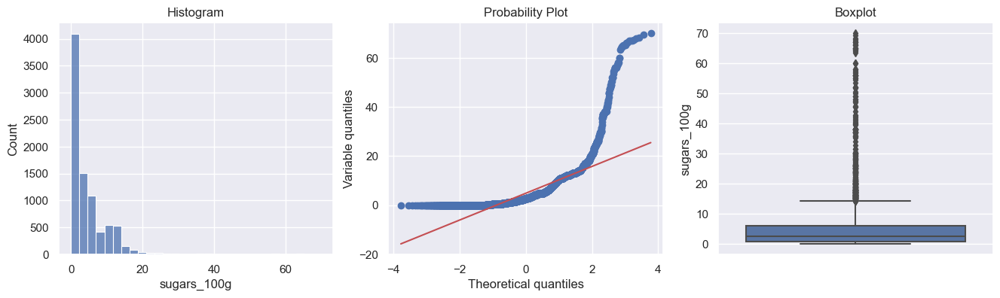

FIBER_100G
Test Shapiro
stat=0.683, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=5358.219, p=0.000
Probablement pas  Gaussien 


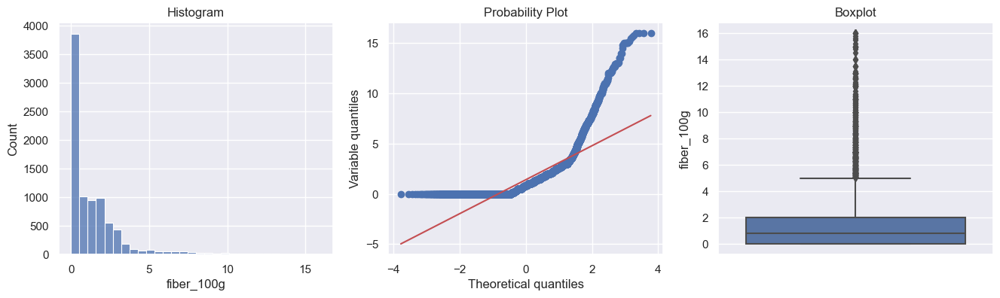

PROTEINS_100G
Test Shapiro
stat=0.830, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2359.537, p=0.000
Probablement pas  Gaussien 


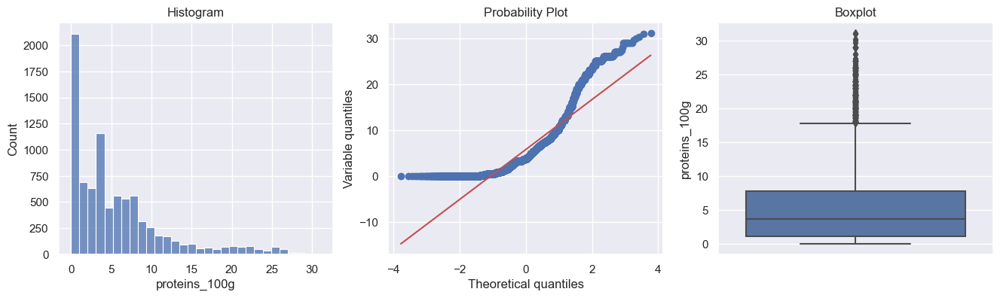

SALT_100G
Test Shapiro
stat=0.817, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=6724.385, p=0.000
Probablement pas  Gaussien 


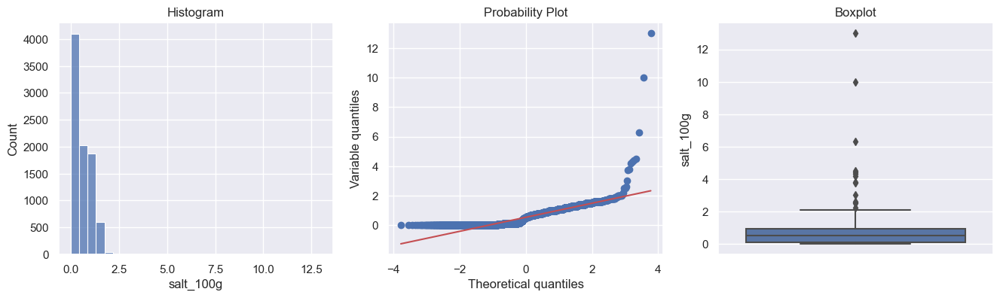

SODIUM_100G
Test Shapiro
stat=0.817, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=6724.408, p=0.000
Probablement pas  Gaussien 


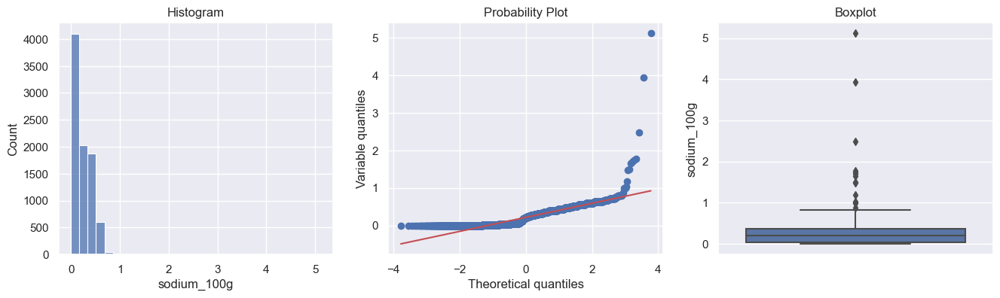

VITAMIN-A_100G
Test Shapiro
stat=0.715, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=4549.492, p=0.000
Probablement pas  Gaussien 


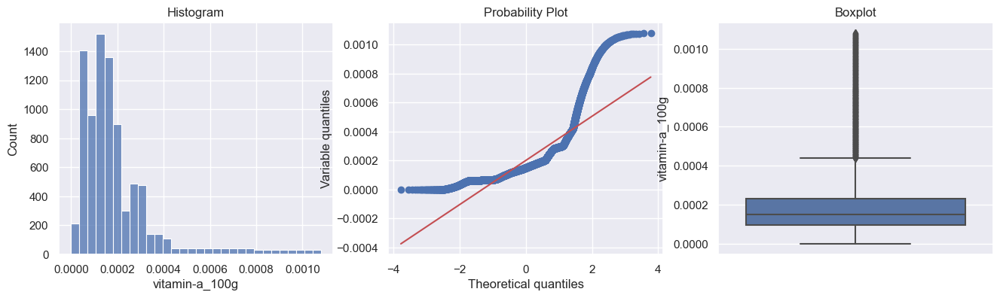

VITAMIN-C_100G
Test Shapiro
stat=0.058, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=17075.131, p=0.000
Probablement pas  Gaussien 


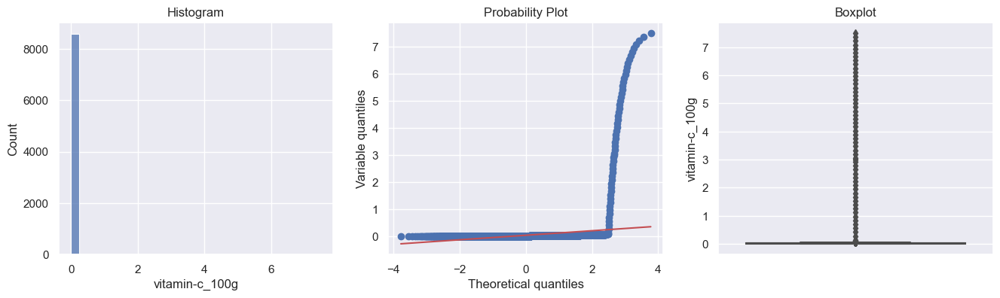

CALCIUM_100G
Test Shapiro
stat=0.725, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=5543.525, p=0.000
Probablement pas  Gaussien 


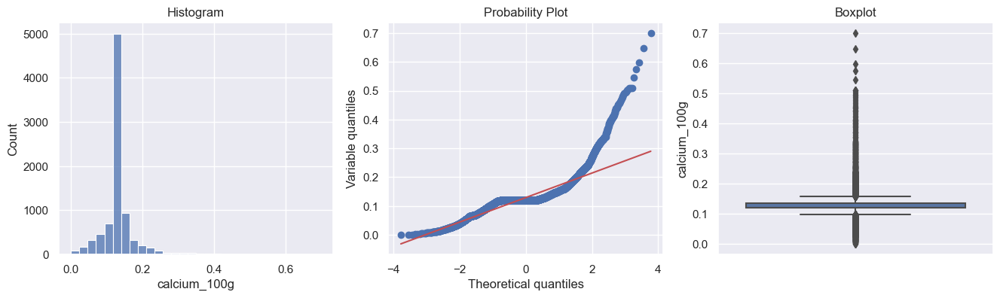

IRON_100G
Test Shapiro
stat=0.293, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=21461.461, p=0.000
Probablement pas  Gaussien 


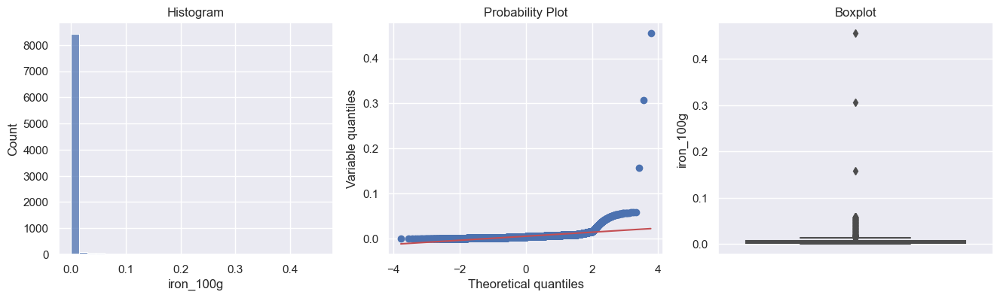

NUTRITION-SCORE-FR_100G
Test Shapiro
stat=0.791, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=53230.861, p=0.000
Probablement pas  Gaussien 


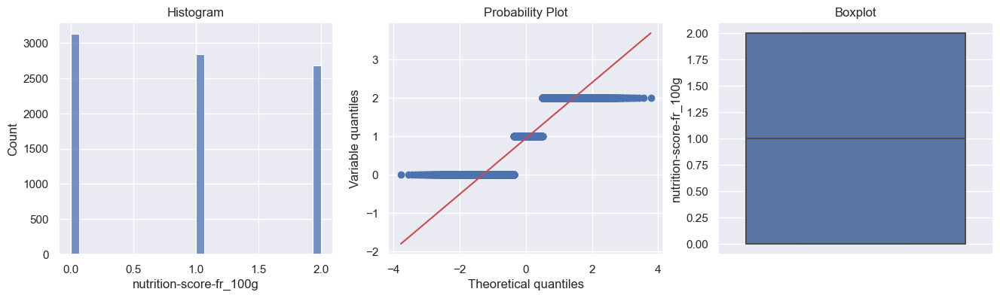


--------------------------------------------------------------------------------------------------------------------------

Le groupe nutriscore_grade C

ENERGY_100G
Test Shapiro
stat=0.895, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2194.739, p=0.000
Probablement pas  Gaussien 


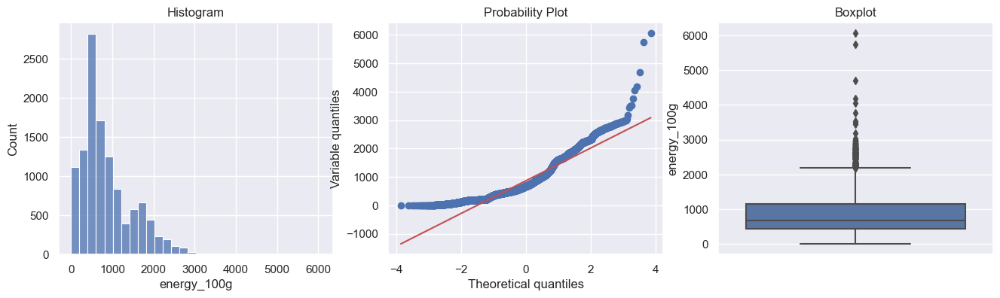

FAT_100G
Test Shapiro
stat=0.741, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=6389.483, p=0.000
Probablement pas  Gaussien 


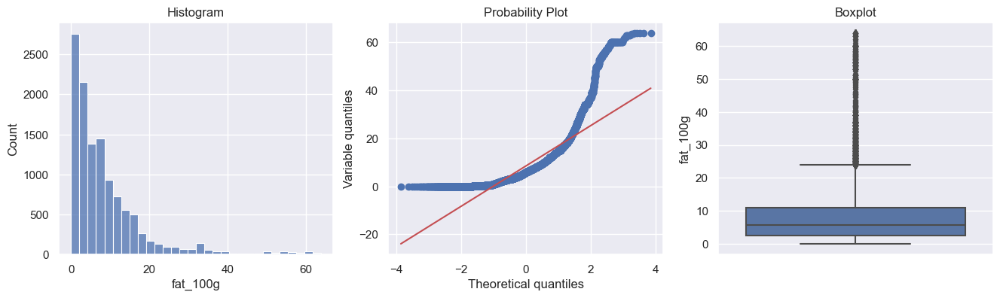

SATURATED-FAT_100G
Test Shapiro
stat=0.792, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=6568.327, p=0.000
Probablement pas  Gaussien 


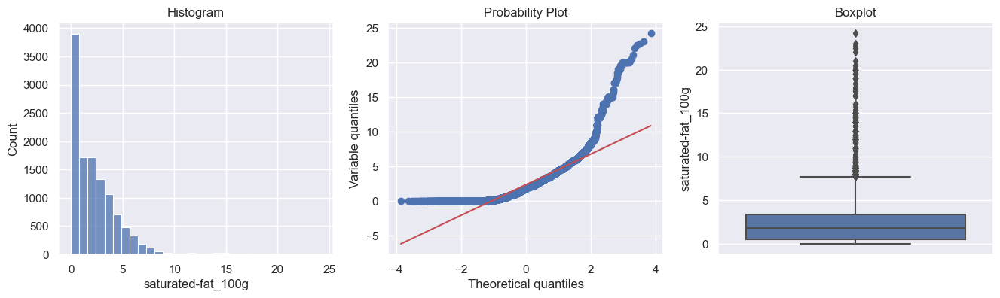

TRANS-FAT_100G
Test Shapiro
stat=0.879, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=68069.754, p=0.000
Probablement pas  Gaussien 


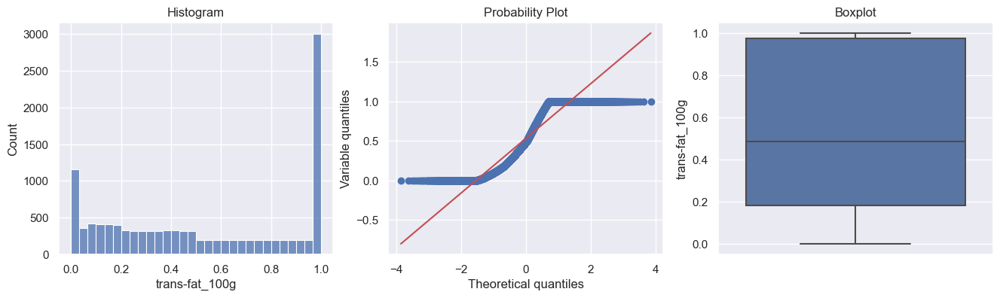

CHOLESTEROL_100G
Test Shapiro
stat=0.731, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=3081.954, p=0.000
Probablement pas  Gaussien 


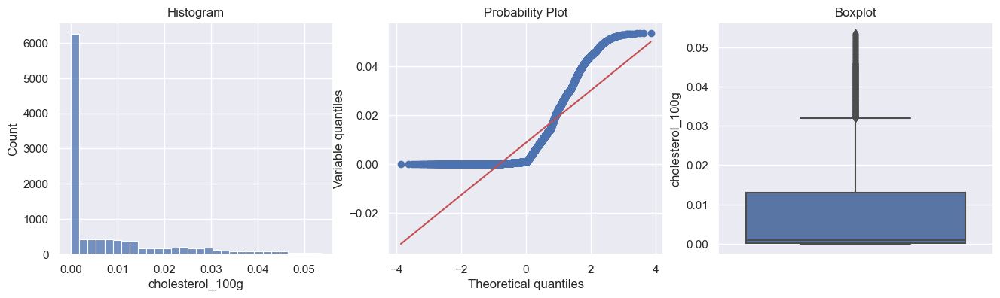

CARBOHYDRATES_100G
Test Shapiro
stat=0.857, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=1576.740, p=0.000
Probablement pas  Gaussien 


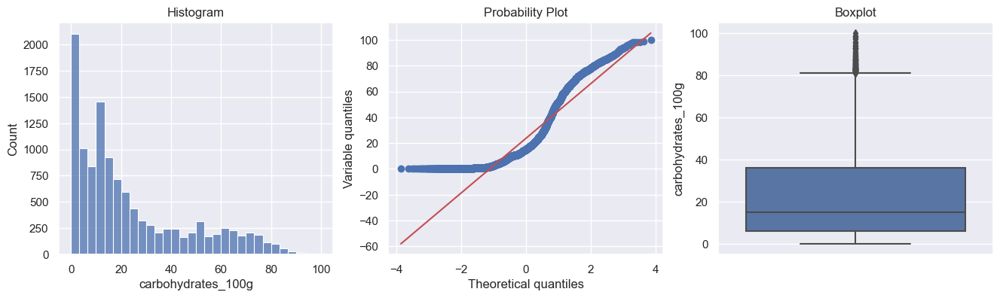

SUGARS_100G
Test Shapiro
stat=0.733, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=5129.408, p=0.000
Probablement pas  Gaussien 


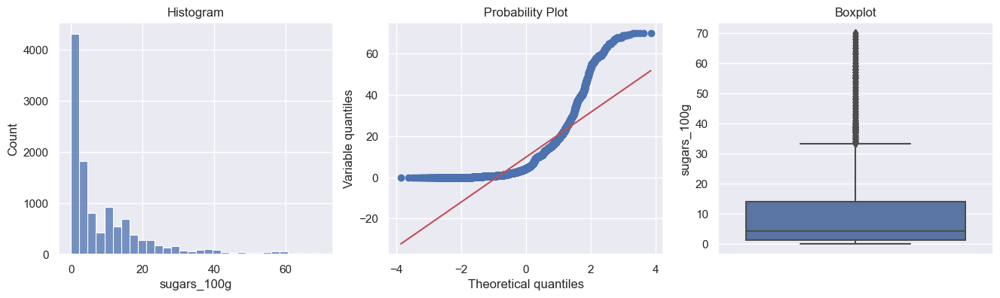

FIBER_100G
Test Shapiro
stat=0.759, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=4323.254, p=0.000
Probablement pas  Gaussien 


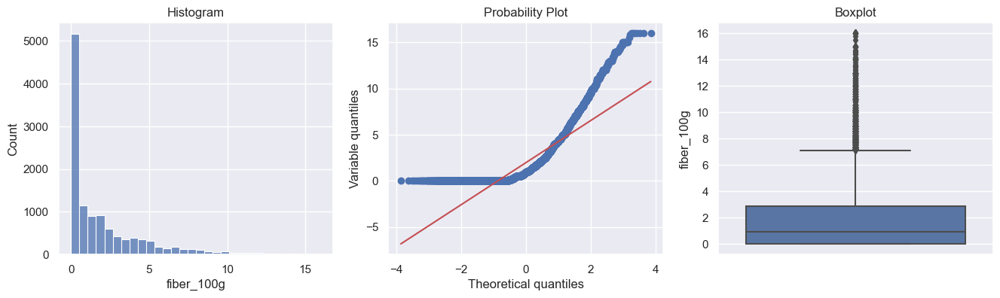

PROTEINS_100G
Test Shapiro
stat=0.860, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=1762.326, p=0.000
Probablement pas  Gaussien 


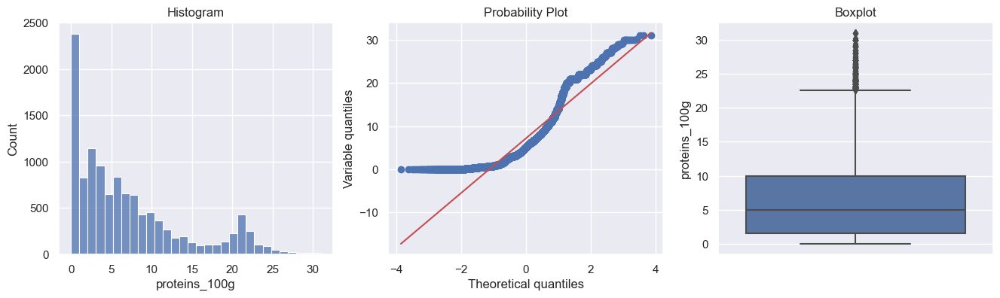

SALT_100G
Test Shapiro
stat=0.691, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=10238.189, p=0.000
Probablement pas  Gaussien 


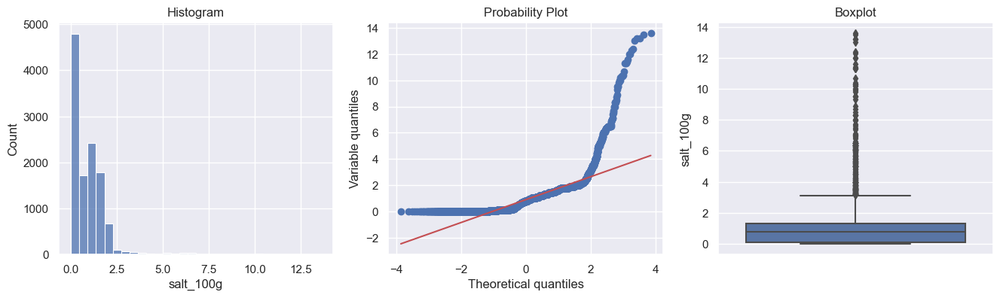

SODIUM_100G
Test Shapiro
stat=0.691, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=10238.143, p=0.000
Probablement pas  Gaussien 


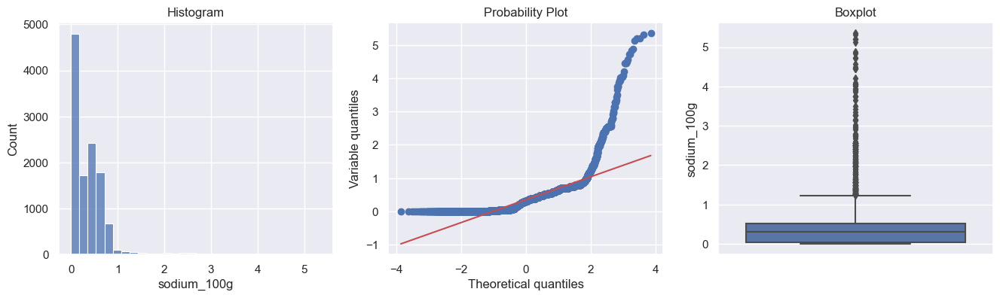

VITAMIN-A_100G
Test Shapiro
stat=0.850, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=3334.668, p=0.000
Probablement pas  Gaussien 


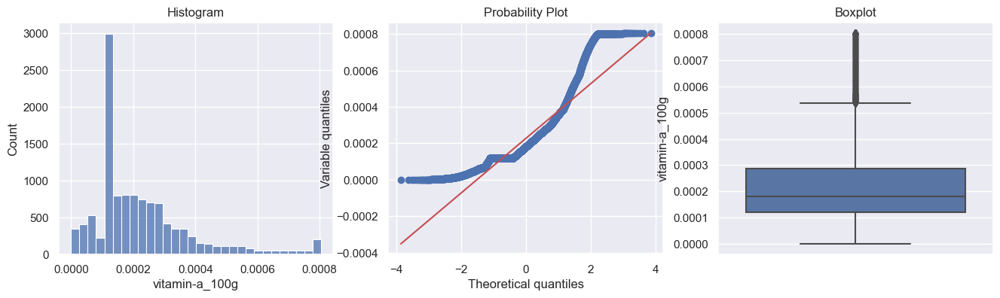

VITAMIN-C_100G
Test Shapiro
stat=0.783, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=5537.600, p=0.000
Probablement pas  Gaussien 


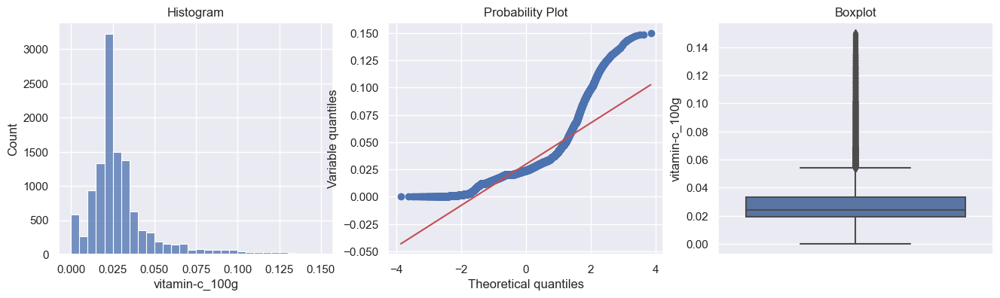

CALCIUM_100G
Test Shapiro
stat=0.810, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2968.384, p=0.000
Probablement pas  Gaussien 


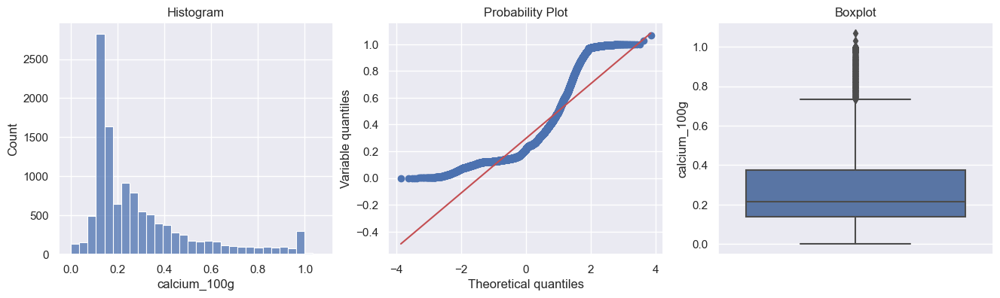

IRON_100G
Test Shapiro
stat=0.912, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=3003.648, p=0.000
Probablement pas  Gaussien 


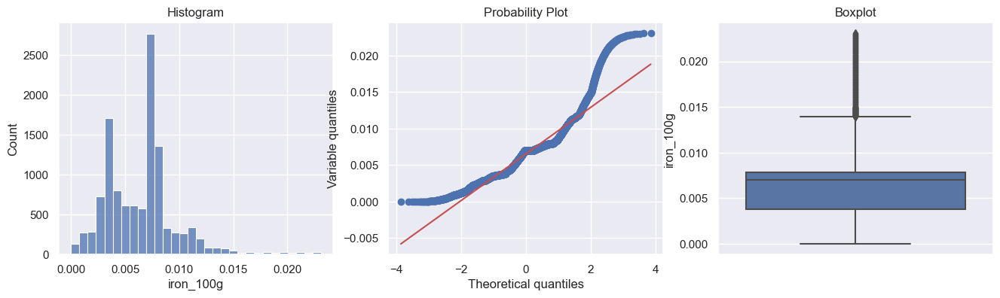

NUTRITION-SCORE-FR_100G
Test Shapiro
stat=0.875, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=5093.117, p=0.000
Probablement pas  Gaussien 


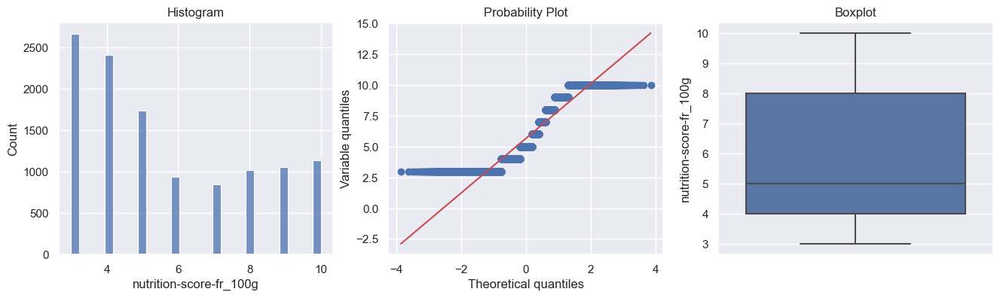


--------------------------------------------------------------------------------------------------------------------------

Le groupe nutriscore_grade D

ENERGY_100G
Test Shapiro
stat=0.967, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2226.222, p=0.000
Probablement pas  Gaussien 


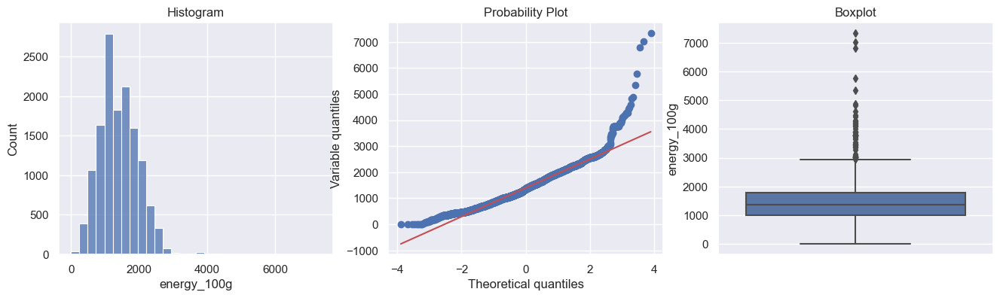

FAT_100G
Test Shapiro
stat=0.965, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=991.985, p=0.000
Probablement pas  Gaussien 


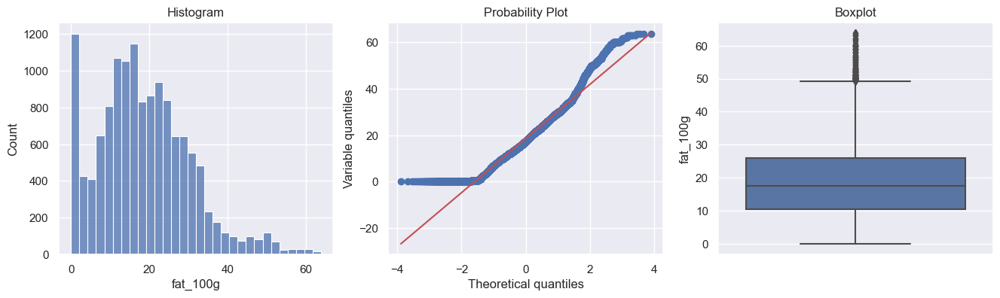

SATURATED-FAT_100G
Test Shapiro
stat=0.878, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=1964.546, p=0.000
Probablement pas  Gaussien 


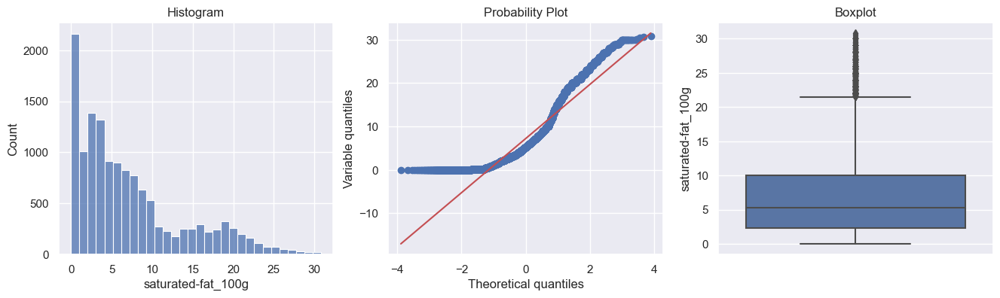

TRANS-FAT_100G
Test Shapiro
stat=0.675, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=6630.931, p=0.000
Probablement pas  Gaussien 


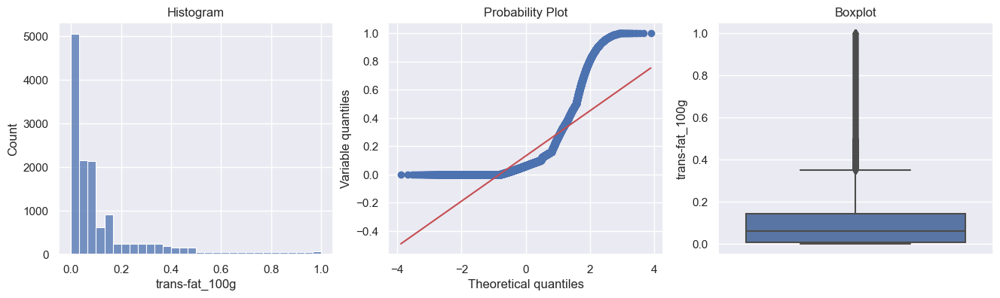

CHOLESTEROL_100G
Test Shapiro
stat=0.712, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=6270.097, p=0.000
Probablement pas  Gaussien 


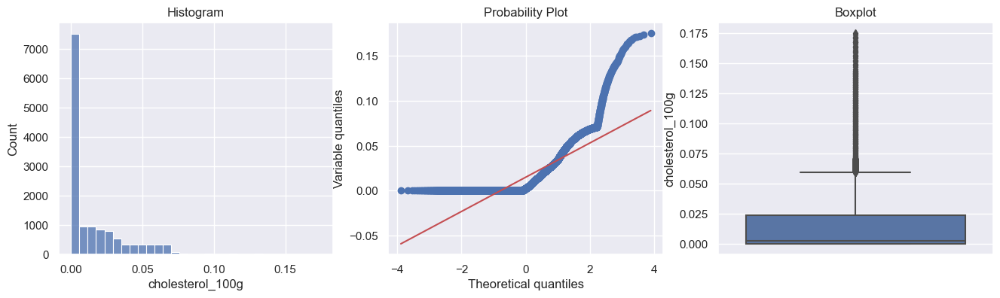

CARBOHYDRATES_100G
Test Shapiro
stat=0.899, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=17571.666, p=0.000
Probablement pas  Gaussien 


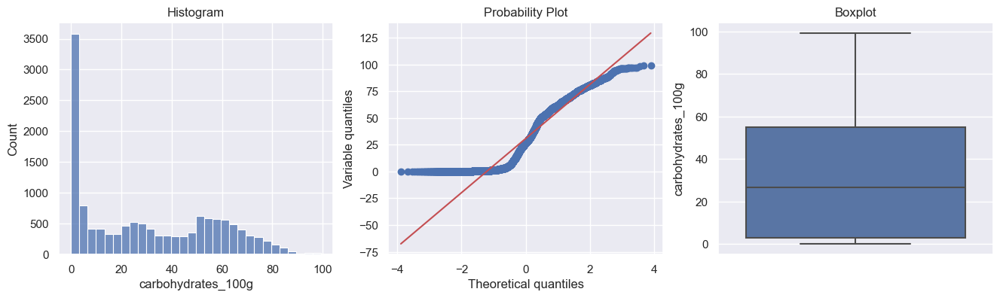

SUGARS_100G
Test Shapiro
stat=0.780, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2291.473, p=0.000
Probablement pas  Gaussien 


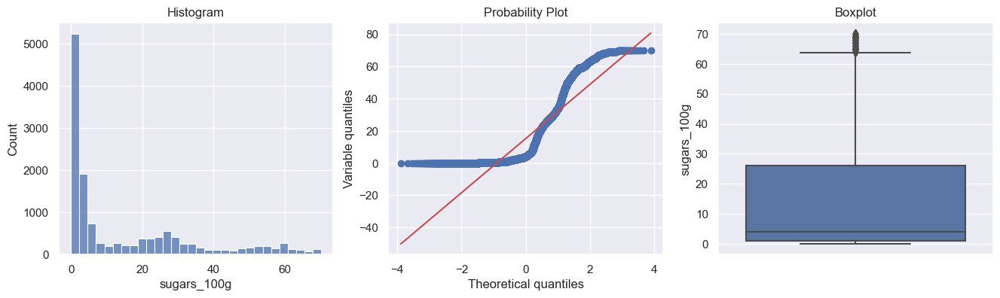

FIBER_100G
Test Shapiro
stat=0.726, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=5614.250, p=0.000
Probablement pas  Gaussien 


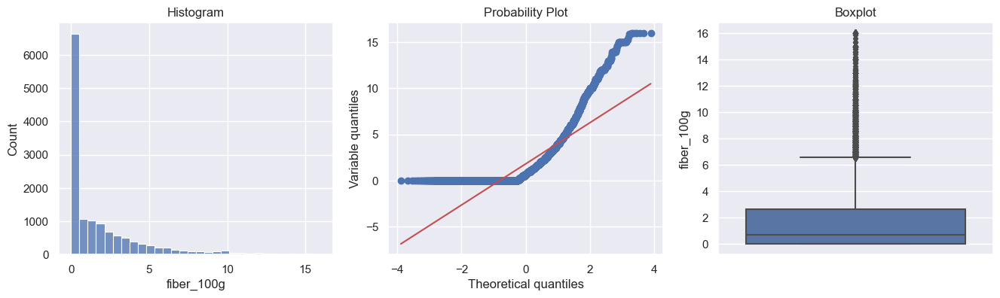

PROTEINS_100G
Test Shapiro
stat=0.913, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=1280.986, p=0.000
Probablement pas  Gaussien 


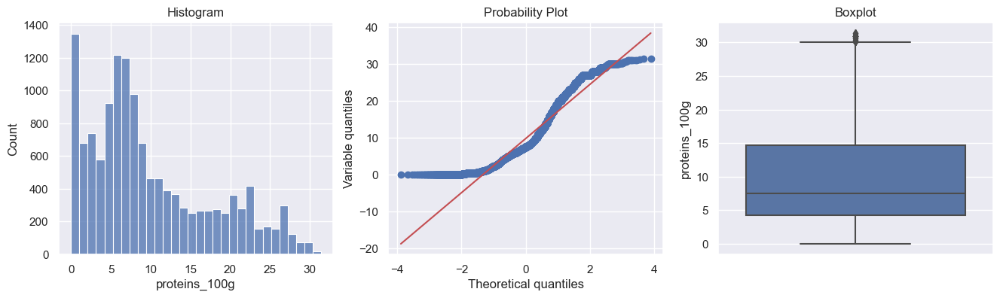

SALT_100G
Test Shapiro
stat=0.758, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=8806.913, p=0.000
Probablement pas  Gaussien 


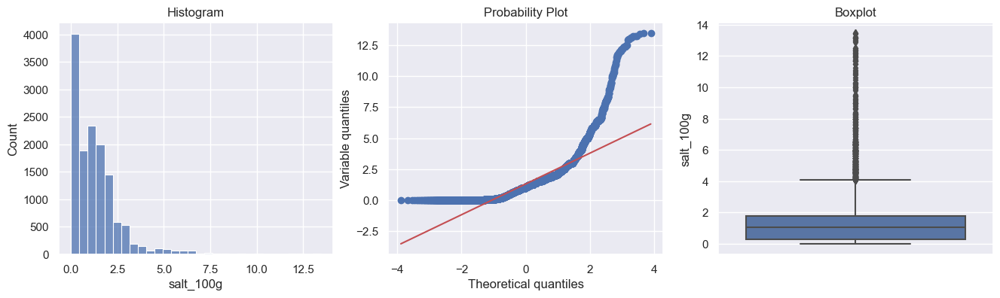

SODIUM_100G
Test Shapiro
stat=0.758, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=8806.898, p=0.000
Probablement pas  Gaussien 


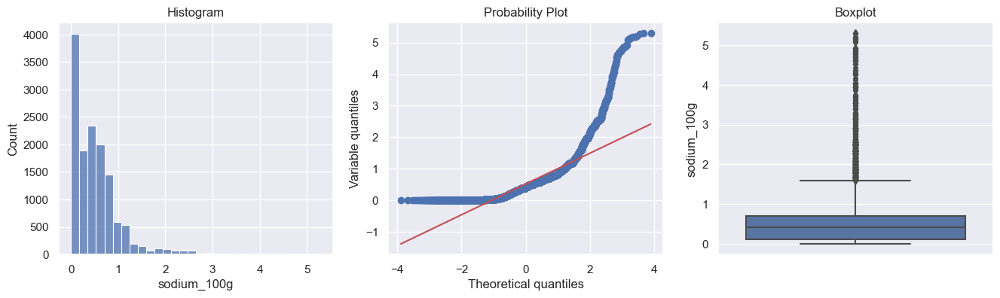

VITAMIN-A_100G
Test Shapiro
stat=0.981, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=288.859, p=0.000
Probablement pas  Gaussien 


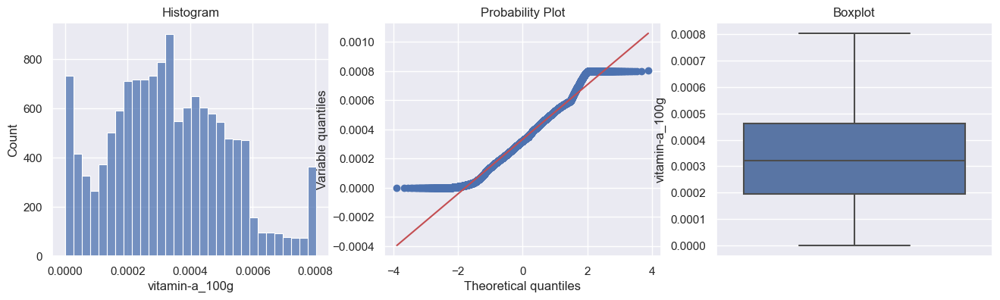

VITAMIN-C_100G
Test Shapiro
stat=0.914, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=1588.034, p=0.000
Probablement pas  Gaussien 


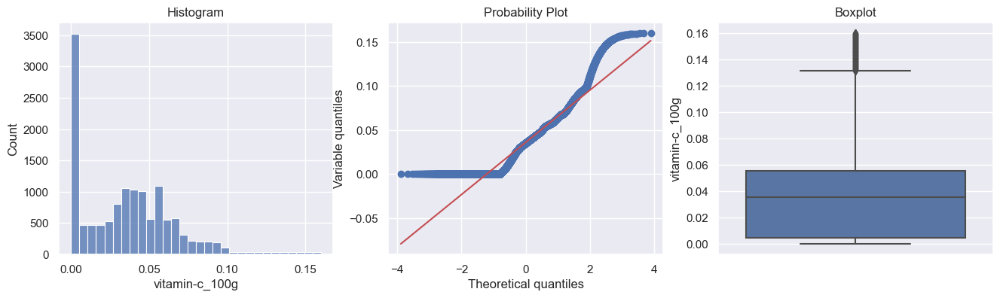

CALCIUM_100G
Test Shapiro
stat=0.958, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=3389.506, p=0.000
Probablement pas  Gaussien 


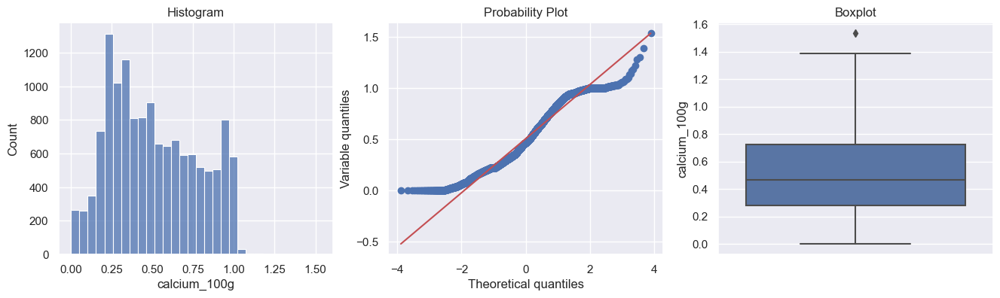

IRON_100G
Test Shapiro
stat=0.959, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=960.948, p=0.000
Probablement pas  Gaussien 


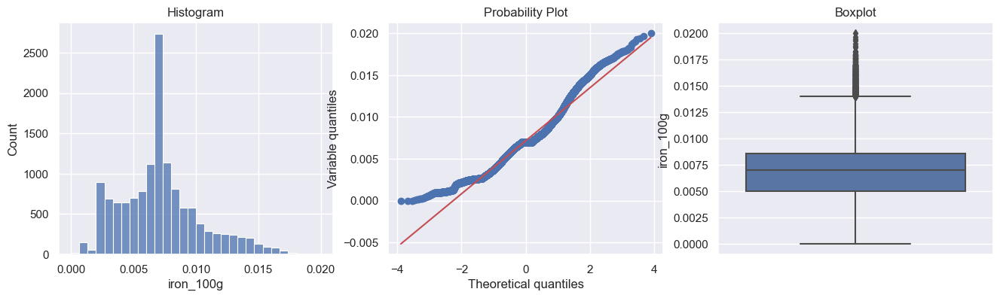

NUTRITION-SCORE-FR_100G
Test Shapiro
stat=0.926, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=5917.925, p=0.000
Probablement pas  Gaussien 


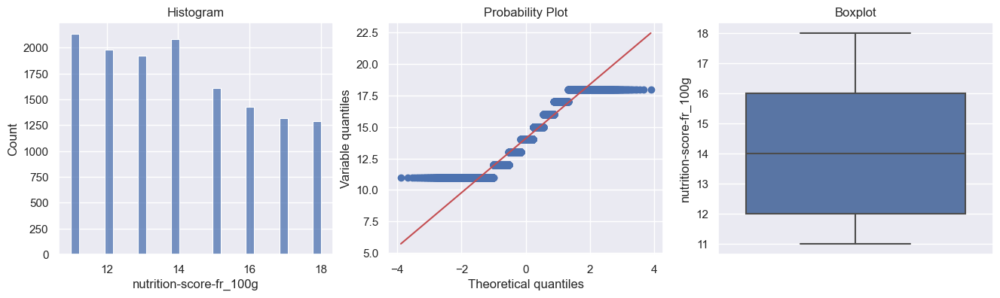


--------------------------------------------------------------------------------------------------------------------------

Le groupe nutriscore_grade E

ENERGY_100G
Test Shapiro
stat=0.874, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=3781.219, p=0.000
Probablement pas  Gaussien 


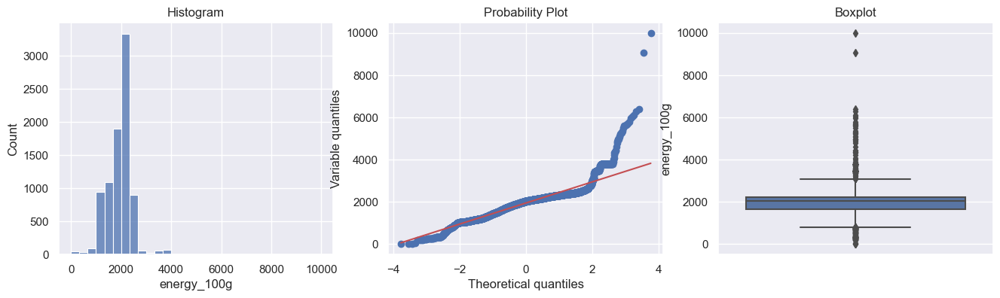

FAT_100G
Test Shapiro
stat=0.984, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=237.037, p=0.000
Probablement pas  Gaussien 


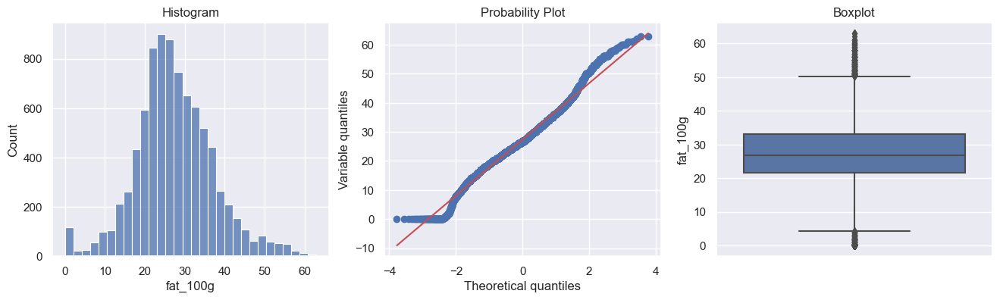

SATURATED-FAT_100G
Test Shapiro
stat=0.995, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=28.839, p=0.000
Probablement pas  Gaussien 


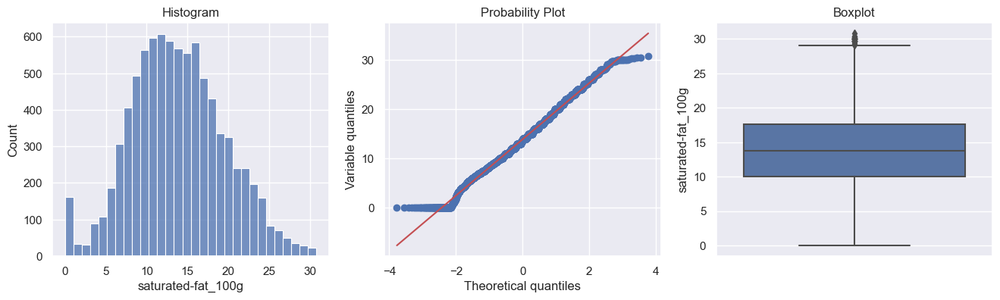

TRANS-FAT_100G
Test Shapiro
stat=0.872, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2034.789, p=0.000
Probablement pas  Gaussien 


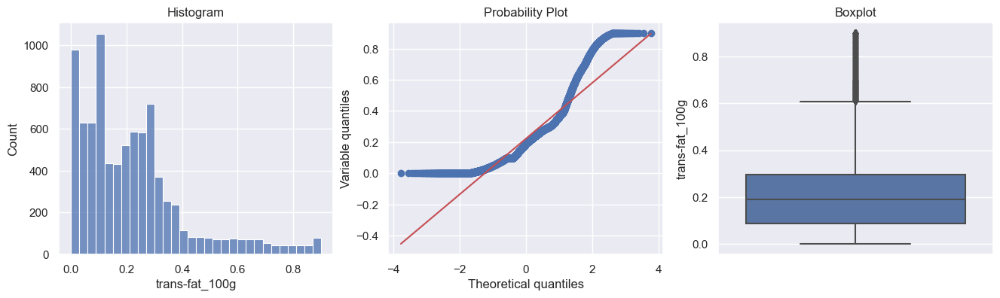

CHOLESTEROL_100G
Test Shapiro
stat=0.881, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=12274.089, p=0.000
Probablement pas  Gaussien 


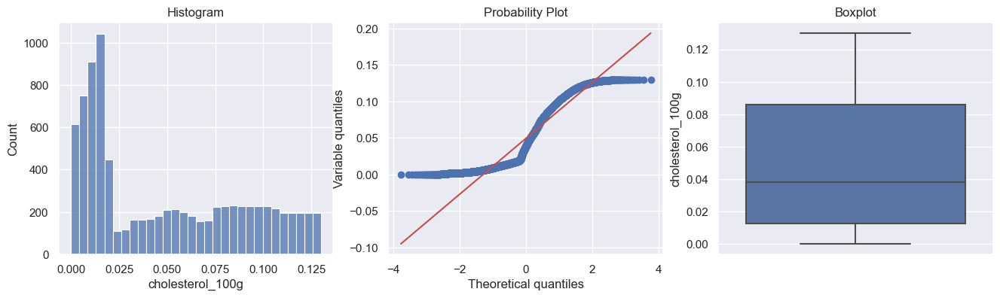

CARBOHYDRATES_100G
Test Shapiro
stat=0.868, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=1777.995, p=0.000
Probablement pas  Gaussien 


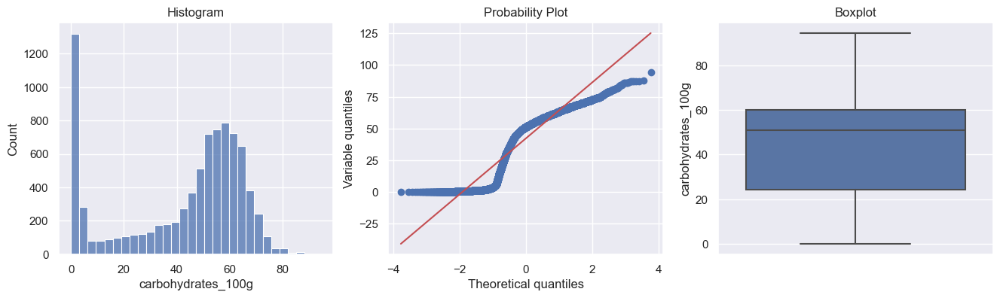

SUGARS_100G
Test Shapiro
stat=0.907, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=67345.538, p=0.000
Probablement pas  Gaussien 


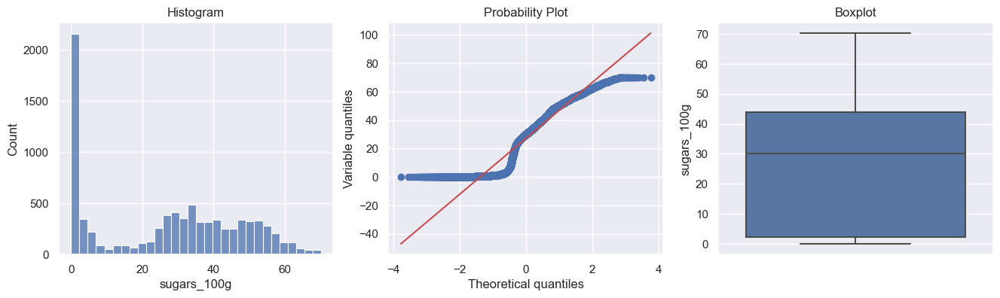

FIBER_100G
Test Shapiro
stat=0.736, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=3647.621, p=0.000
Probablement pas  Gaussien 


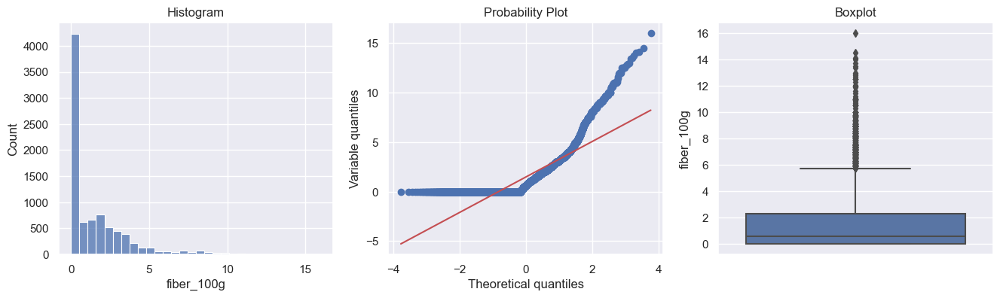

PROTEINS_100G
Test Shapiro
stat=0.832, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2021.337, p=0.000
Probablement pas  Gaussien 


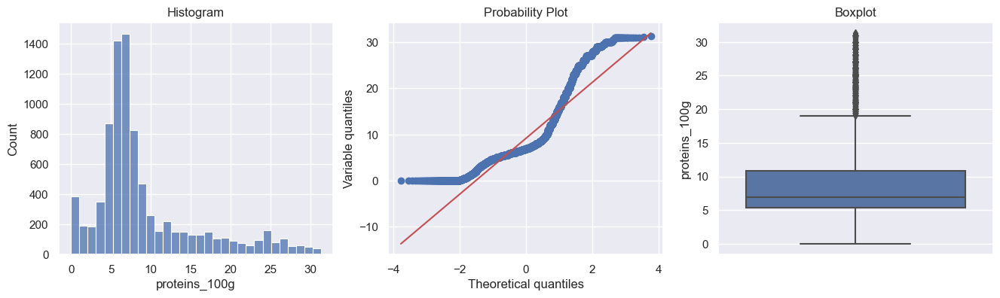

SALT_100G
Test Shapiro
stat=0.758, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=4418.066, p=0.000
Probablement pas  Gaussien 


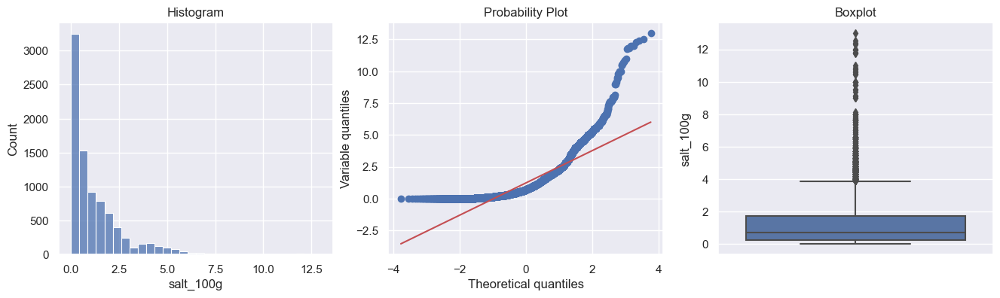

SODIUM_100G
Test Shapiro
stat=0.758, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=4418.059, p=0.000
Probablement pas  Gaussien 


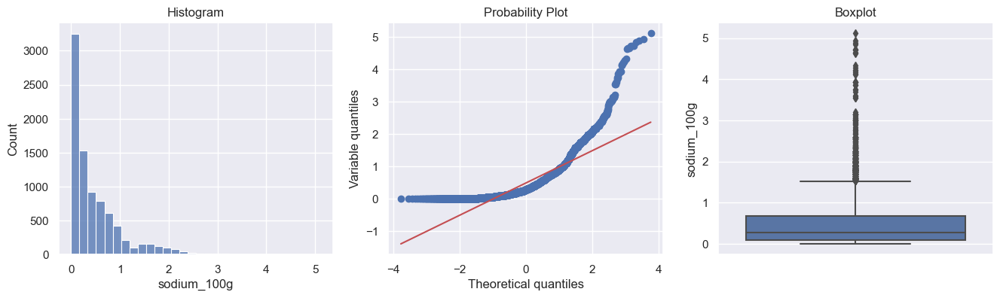

VITAMIN-A_100G
Test Shapiro
stat=0.938, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=5277.196, p=0.000
Probablement pas  Gaussien 


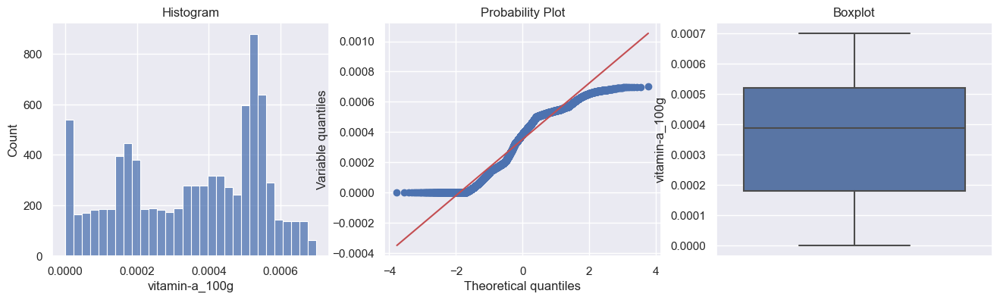

VITAMIN-C_100G
Test Shapiro
stat=0.943, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=4199.145, p=0.000
Probablement pas  Gaussien 


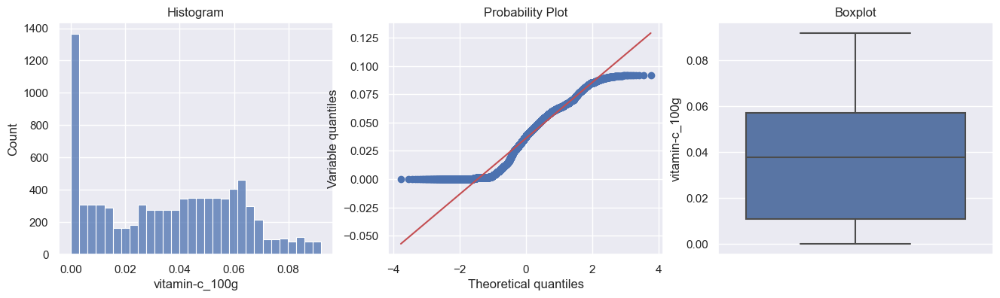

CALCIUM_100G
Test Shapiro
stat=0.903, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=2036.630, p=0.000
Probablement pas  Gaussien 


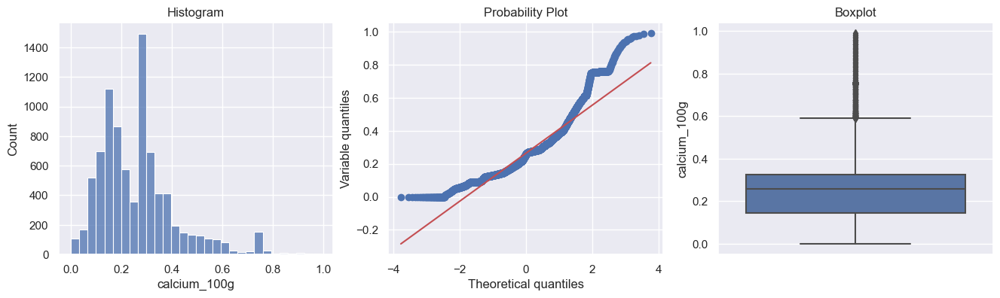

IRON_100G
Test Shapiro
stat=0.674, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=6463.048, p=0.000
Probablement pas  Gaussien 


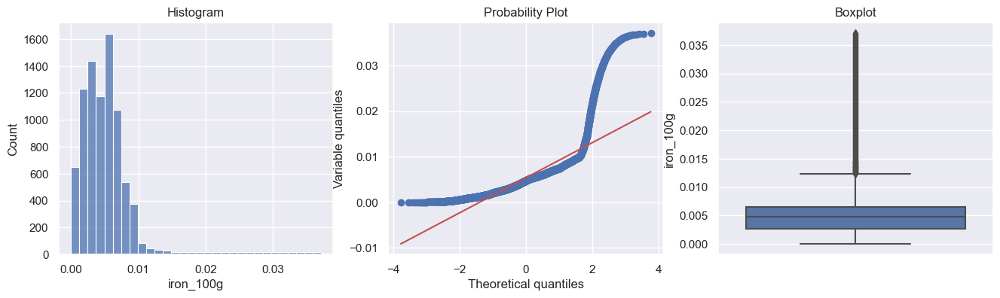

NUTRITION-SCORE-FR_100G
Test Shapiro
stat=0.923, p=0.000
Probablement pas  Gaussien 
Test normaltest
stat=498.419, p=0.000
Probablement pas  Gaussien 


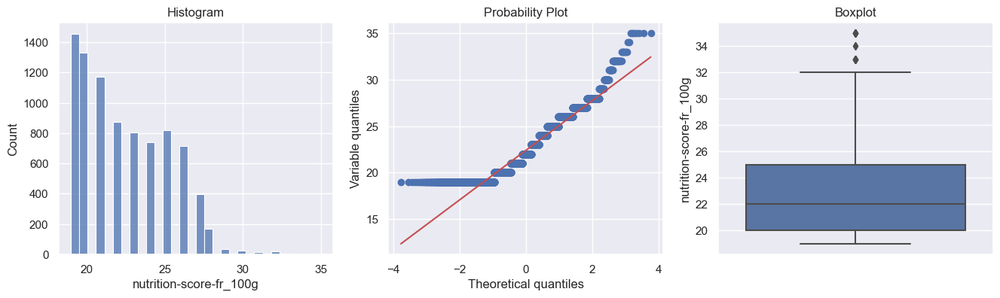

In [13]:
# afficher les distributions et voir les outliers pour chaque groupe et chaque variable 
from termcolor import colored

list_nutriscore_grade = ['a','b','c','d','e']

for score in list_nutriscore_grade:
    group_nutriscore_grade = df.groupby('nutrition_grade_fr')
    groups = group_nutriscore_grade.get_group(score)
    print('')
    print('--------------------------------------------------------------------------------------------------------------------------')
    print('')
    print(colored(f'Le groupe nutriscore_grade {score.upper()}', 'red'))
    print('')
    # Fonction diagnostic_plots pour déterminer les outliers et si la distribution est normale 
    for col in list(df.select_dtypes(include='float').columns):
        print(colored(col.upper(), 'green'))
        diagnostic_plots(groups, col)

<a id='2'></a>

### Répartition des nutritions grades

[Haut de page](#sommaire)

In [14]:
data_pie= df['nutrition_grade_fr'].value_counts().reset_index()
data_pie.rename(columns={'index':'nutri_grade', 'nutrition_grade_fr':'count'}, inplace=True)
data_pie

,nutri_grade,count
0,d,13763
1,c,11821
2,a,9432
3,b,8655
4,e,8586


In [15]:
f= plt.figure(figsize=(12,8))
fig= px.pie(data_frame=data_pie, names='nutri_grade', values='count', title='Répartition des nutritions grades')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

<Figure size 1200x800 with 0 Axes>

**D'aprés le pieChart on remarque la répartition du grade du nutriscore(a,b,c,d,e) .On voit clairement que le grade d a le pourcentage le plus élevé avec 26%.**

<a id='3'></a>

### Répartition des catégories

[Haut de page](#sommaire)

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52257 entries, 0 to 52256
Data columns (total 33 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   energy_100g                              52257 non-null  float64       
 1   fat_100g                                 52257 non-null  float64       
 2   saturated-fat_100g                       52257 non-null  float64       
 3   trans-fat_100g                           52084 non-null  float64       
 4   cholesterol_100g                         52164 non-null  float64       
 5   carbohydrates_100g                       52257 non-null  float64       
 6   sugars_100g                              52257 non-null  float64       
 7   fiber_100g                               52257 non-null  float64       
 8   proteins_100g                            52257 non-null  float64       
 9   salt_100g                              

In [17]:
for colu in df.columns:
     
    print('___________________________________________________________________________________') 
    print(end = '\n \n')
    print(colu, '-->', 'Nunique:', df[colu].nunique() ,'|unique:' , df[colu].unique(), '-->', df[colu].dtype, end='\n \n')

___________________________________________________________________________________

 
energy_100g --> Nunique: 3081 |unique: [ 586. 1665.  452. ... 3582. 2742. 2517.] --> float64
 
___________________________________________________________________________________

 
fat_100g --> Nunique: 5046 |unique: [ 3.8   2.7   1.6  ... 41.08 42.92 44.76] --> float64
 
___________________________________________________________________________________

 
saturated-fat_100g --> Nunique: 973 |unique: [1.40000000e+00 6.00000000e-01 9.00000000e-01 1.00000000e-01
 1.00000000e+00 1.10000000e-01 0.00000000e+00 4.00000000e-01
 5.00000000e-01 2.00000000e-01 2.50000000e+00 7.00000000e-01
 2.40000000e+00 1.50000000e+00 3.00000000e+00 4.70000000e-01
 1.80000000e+00 3.00000000e-01 8.00000000e-01 1.10000000e+00
 1.20000000e+00 2.80000000e+00 1.84000000e+00 6.40000000e-01
 1.60000000e+00 2.30000000e+00 3.40000000e+00 2.20000000e+00
 1.70000000e+00 2.00000000e+00 3.50000000e-01 1.30000000e+00
 1.32000000e+00 9.0

vitamin-c_100g --> Nunique: 45667 |unique: [           nan 3.20000000e-02 3.19733333e-02 ... 2.83430233e-04
 1.88953488e-04 9.44767442e-05] --> float64
 
___________________________________________________________________________________

 
calcium_100g --> Nunique: 40944 |unique: [       nan 0.0296     0.03337538 ... 0.35675    0.52825    0.614     ] --> float64
 
___________________________________________________________________________________

 
iron_100g --> Nunique: 45494 |unique: [       nan 0.0028     0.0023     ... 0.00153595 0.00154063 0.00154532] --> float64
 
___________________________________________________________________________________

 
nutrition-score-fr_100g --> Nunique: 50 |unique: [ -3.  -2.  -1.  -5.  -4.  -6.  -9.  -8.  -7. -10. -11. -12. -13. -14.
   1.   2.   0.   6.   4.   5.   8.   3.   9.  10.   7.  14.  15.  12.
  13.  11.  18.  16.  17.  22.  19.  24.  21.  20.  23.  29.  35.  27.
  26.  25.  28.  32.  30.  33.  31.  34.] --> float64
 
________________

In [18]:
df.select_dtypes(['category']).columns

Index(['additives_n', 'additives', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n'],
      dtype='object')

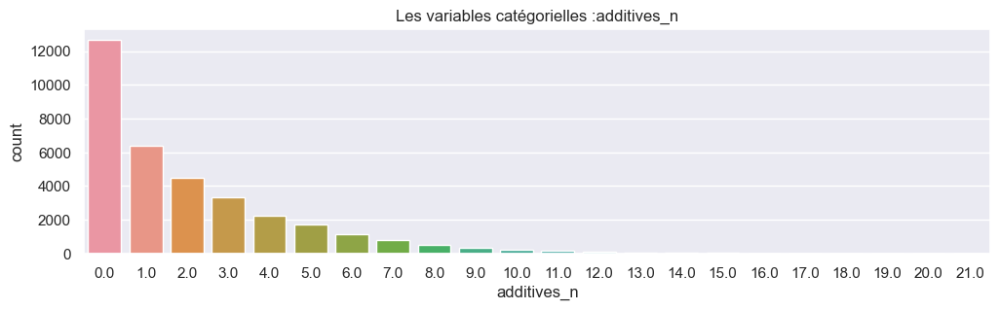

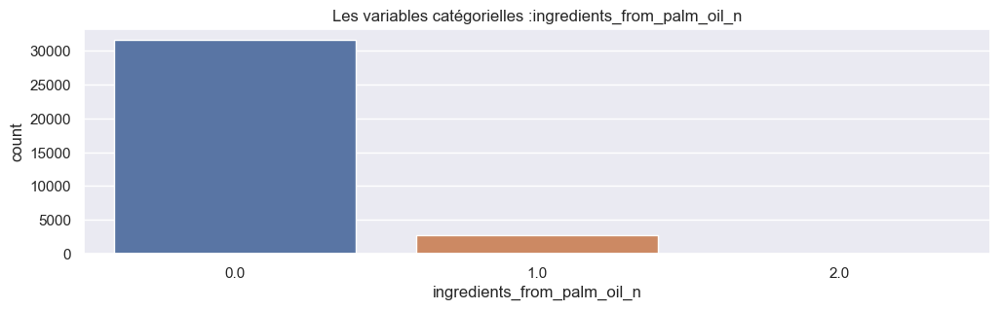

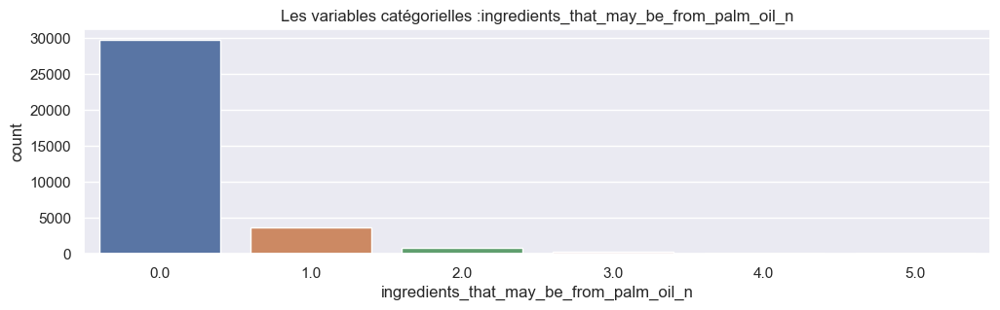

In [19]:
col_cat = ['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']
for col in col_cat:
    sns.set_theme()
    plt.figure(figsize = (12,3))
    #sns.set(font_scale=1)
    sns.countplot(df[col])
    title= 'Les variables catégorielles :' +col
    plt.title(title)
    plt.show()

In [20]:
no_numeric_column= df.select_dtypes(include=['object'])
no_numeric_column.columns

Index(['code', 'creator', 'product_name', 'brands', 'countries',
       'countries_fr', 'ingredients_text', 'serving_size', 'additives_tags',
       'additives_fr', 'nutrition_grade_fr'],
      dtype='object')

In [21]:
#df['ingredients_text']

In [22]:
#df['additives'].str.split("'").dropna()

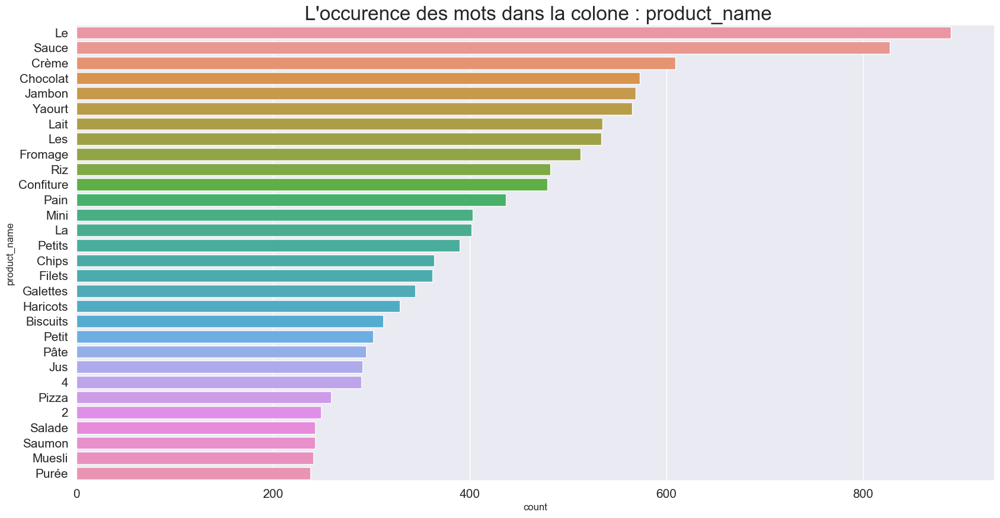

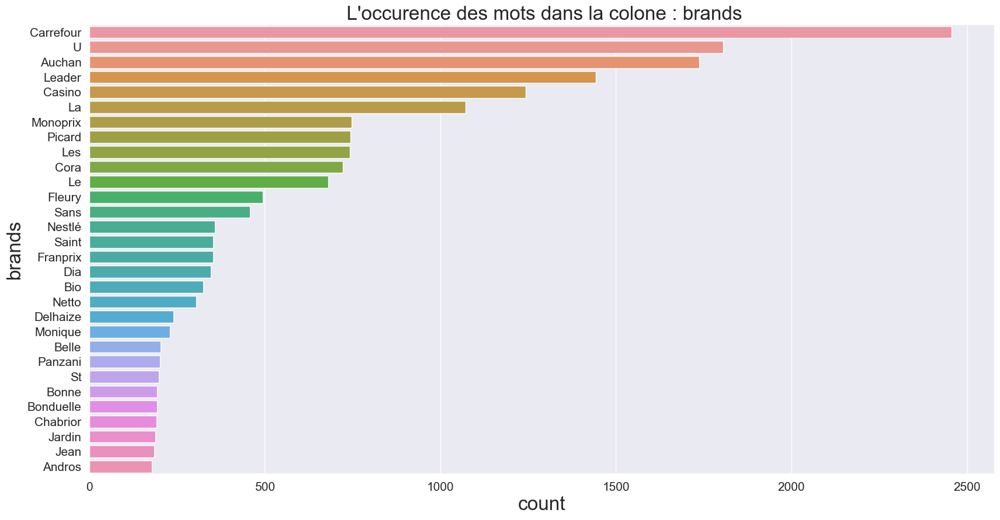

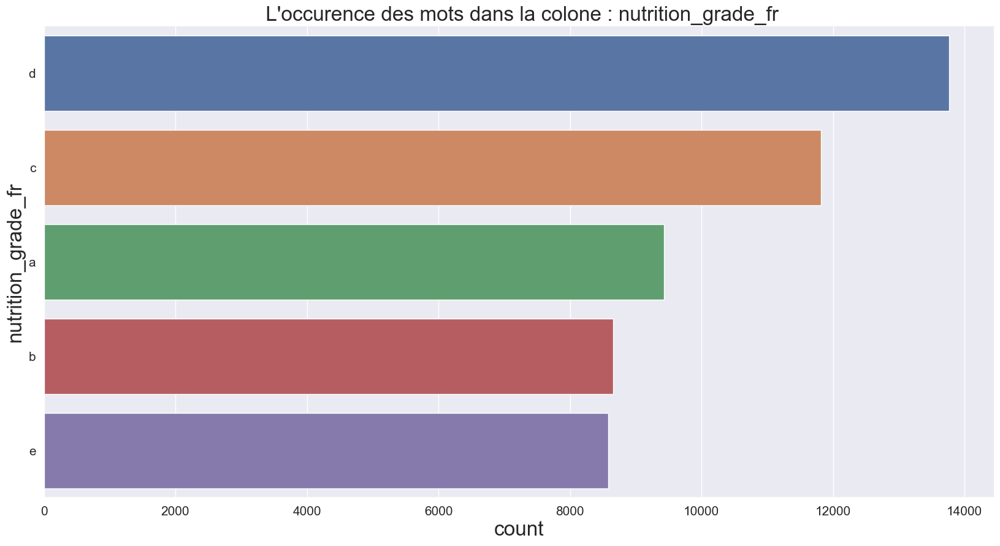

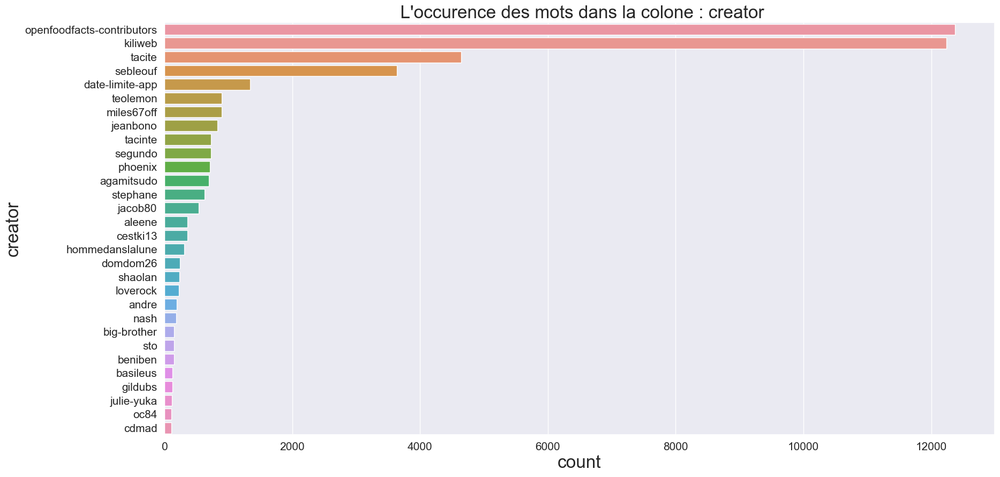

In [23]:
colone_words= ['product_name','brands',  'nutrition_grade_fr', 'creator']

for col in colone_words : 
    fig = plt.figure(figsize=(20,10))
    
    wrds1 = no_numeric_column[col].str.split(' ').str[0].value_counts()
    data_wrds1= pd.DataFrame(wrds1).reset_index().rename(columns={'index':'column', col:'count'}).head(30)
    sns.barplot(x='count', y='column', data=data_wrds1)
    sns.set(font_scale=2)
    plt.ylabel(col)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    title= " L'occurence des mots dans la colone : " +col
    plt.title(title)

In [24]:
# Récupération des labels contenant le mot clé '100g'
macro_nutriments_labels = []
for col in df :
    if "_100g" in col :
        macro_nutriments_labels.append(col)

In [25]:
macro_nutriments_labels

['energy_100g',
 'fat_100g',
 'saturated-fat_100g',
 'trans-fat_100g',
 'cholesterol_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g',
 'vitamin-a_100g',
 'vitamin-c_100g',
 'calcium_100g',
 'iron_100g',
 'nutrition-score-fr_100g']

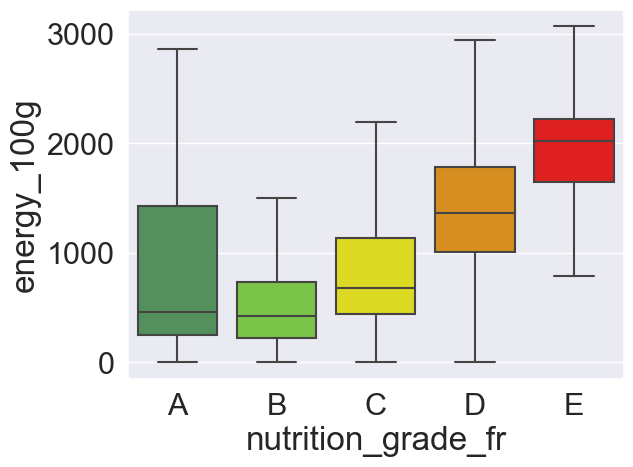

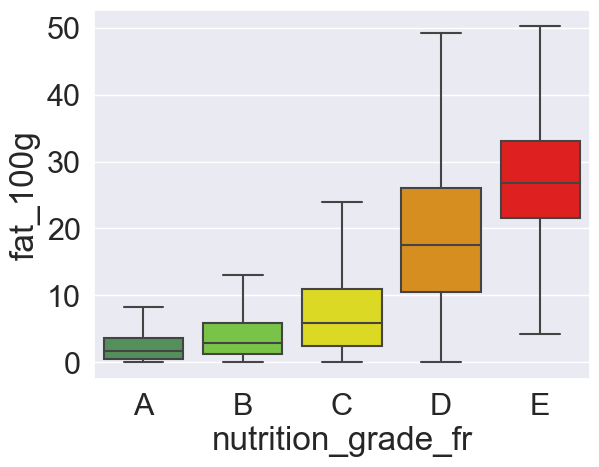

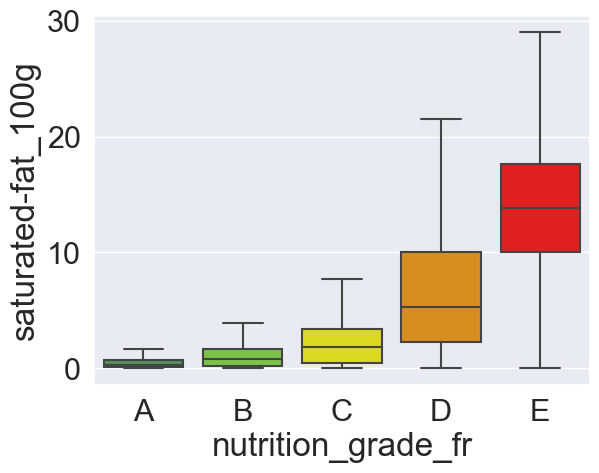

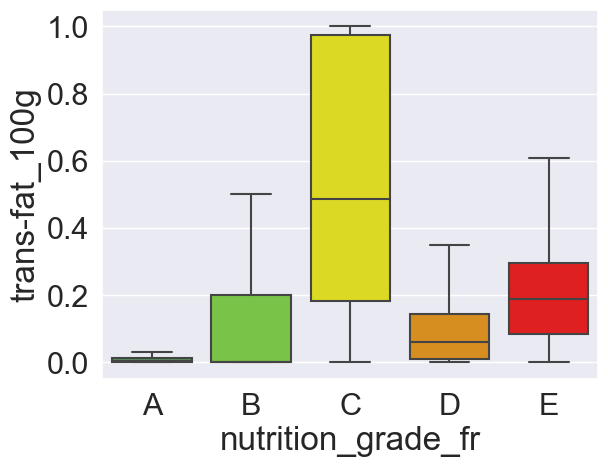

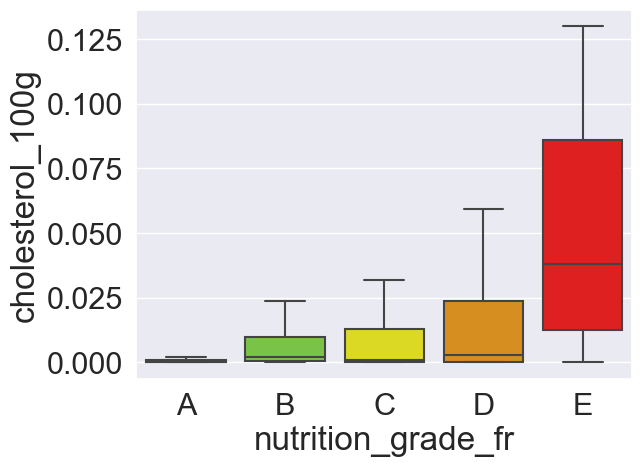

...

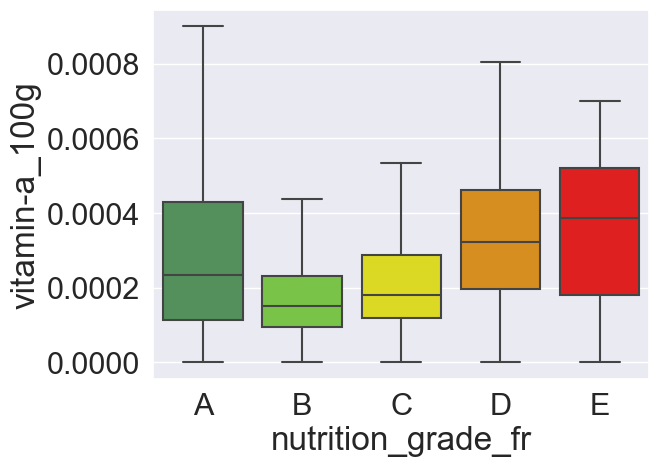

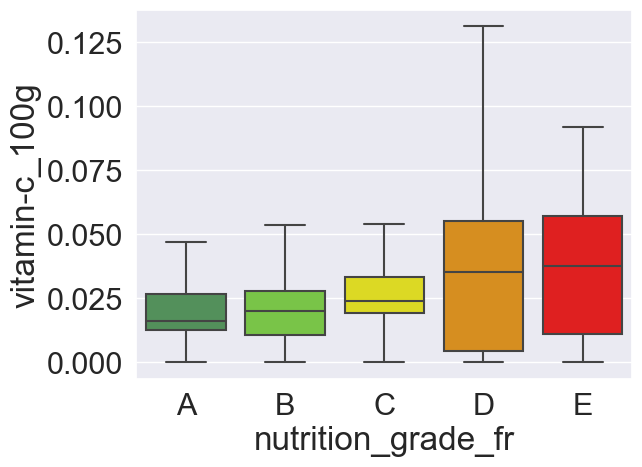

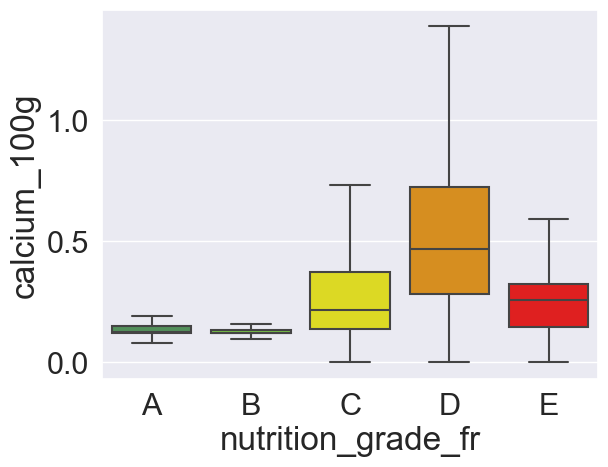

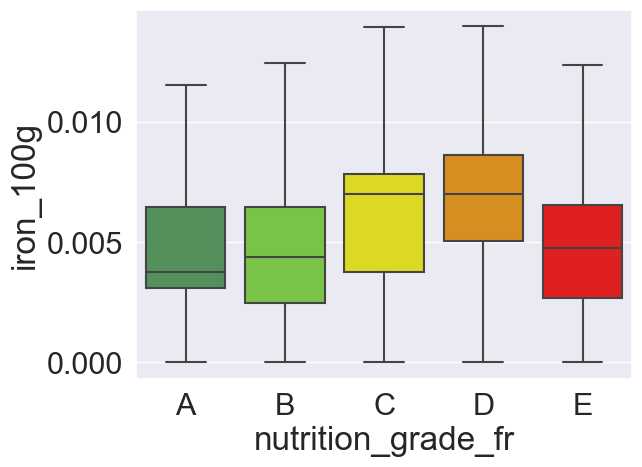

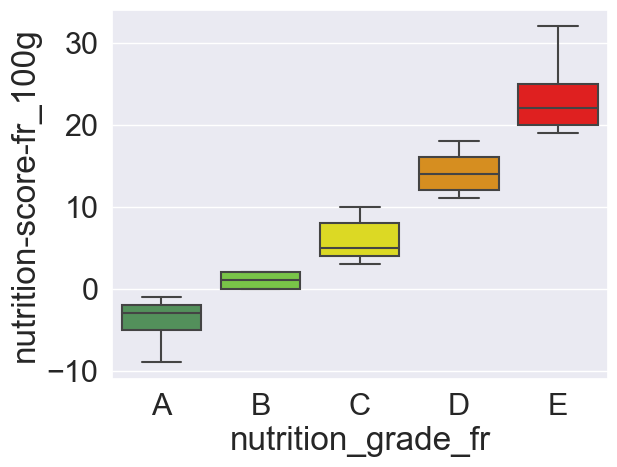

In [26]:
data_for_plot = df[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
                    'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                    'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g',
                    'vitamin-c_100g', 'calcium_100g', 'iron_100g','nutrition-score-fr_100g',
                    'nutrition_grade_fr']].dropna(subset=["nutrition_grade_fr"])
order = sorted(df["nutrition_grade_fr"].dropna().unique())
labels = ['A', 'B', 'C', 'D', 'E']
y_pos = np.arange(len(labels))
for macro_nutri in macro_nutriments_labels :
    sns.boxplot(data=data_for_plot, x='nutrition_grade_fr', y=macro_nutri, order=order, showfliers=False, palette={'a':"#499A53", 'b':"#74D834", 'c':"#FBF605", 'd':"#F49402", 'e':"#FF0000"})
    plt.xticks(y_pos, labels)
    plt.show()

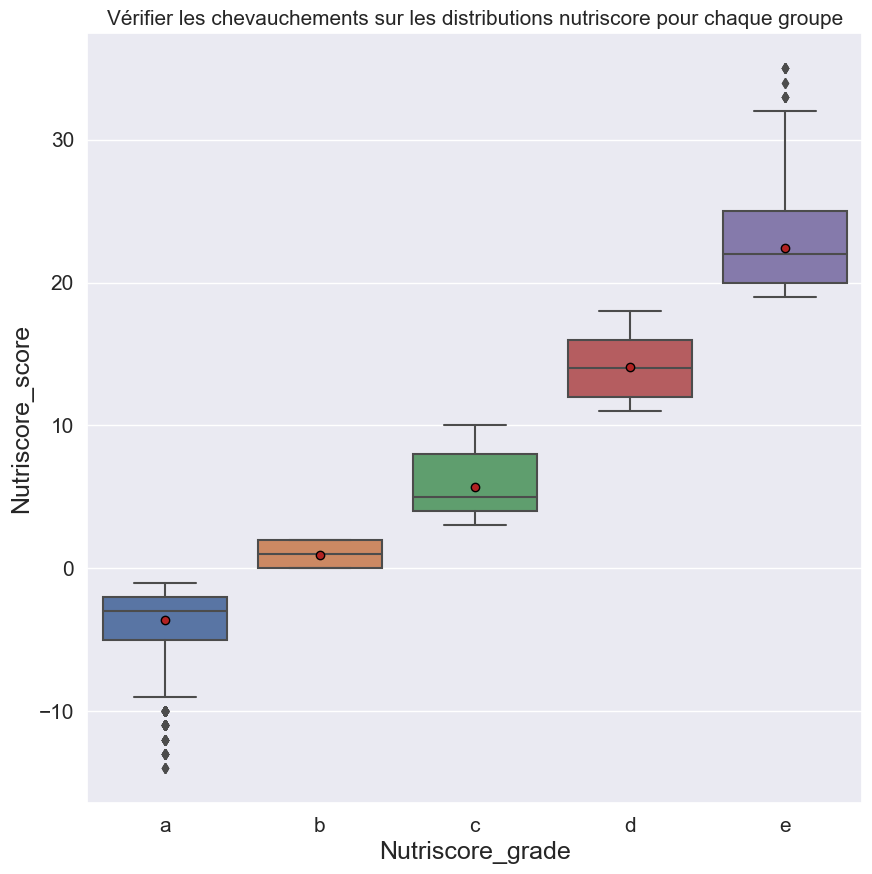

In [27]:
#Vérifier avec boxplotnutriscore en fonction de chaque groupe nutriscore_grade afin de voir les valeurs qui se chevauchent et les outliers 
meanprops = {'marker':'o', 'markeredgecolor':'black',
                'markerfacecolor':'firebrick'}

plt.figure(figsize=(10,10))
plt.title('Vérifier les chevauchements sur les distributions nutriscore pour chaque groupe', size=15)
sns.boxplot(x=df['nutrition_grade_fr'].sort_values(), y=df['nutrition-score-fr_100g'], showmeans=True, meanprops=meanprops,data=df)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Nutriscore_grade', fontsize=18)
plt.ylabel('Nutriscore_score', fontsize=18)
plt.show()

<a id='p3'></a>

## <div style='background-color: #aac1cb ; padding: 5px; border: 2px solid black;'> 2. Analyse bivariée des variables </div>  

[Haut de page](#sommaire)

In [28]:
numeric_columns = df.select_dtypes(['int64','float64'])
numeric_columns

,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
0,586.0,3.800000,1.4,NaN,NaN,16.200000,0.5,1.5,9.30,0.6000,0.236220,NaN,NaN,NaN,NaN,-3.0
1,1665.0,2.700000,0.6,NaN,NaN,12.766667,3.3,4.6,12.00,1.1100,0.437008,NaN,NaN,NaN,NaN,-2.0
2,452.0,1.600000,0.9,NaN,NaN,9.333333,1.3,0.8,4.30,0.4500,0.177165,NaN,NaN,NaN,NaN,-1.0
3,155.0,0.500000,0.1,NaN,NaN,5.900000,5.5,3.0,0.70,0.2500,0.098425,NaN,NaN,NaN,NaN,-2.0
4,586.0,0.366667,1.0,NaN,NaN,5.800000,6.0,3.0,5.00,0.0900,0.035433,NaN,NaN,NaN,NaN,-5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52252,2004.0,27.500000,11.1,0.0,0.06322,31.350000,65.7,0.0,4.80,0.0700,0.027559,0.0,0.026,0.614,0.00155,25.0
52253,2180.0,17.950000,10.0,0.0,0.06322,36.175000,10.0,0.0,15.72,2.0000,0.787402,0.0,0.026,0.614,0.00155,25.0
52254,1066.0,8.400000,2.1,0.0,0.06322,41.000000,31.0,0.0,3.20,4.6000,1.811024,0.0,0.026,0.614,0.00155,21.0
52255,1075.0,0.400000,0.0,0.0,0.06322,66.000000,61.0,0.0,0.50,1.8161,0.715000,0.0,0.026,0.614,0.00155,20.0


In [29]:
no_numeric_column= df.select_dtypes(exclude=['int64','float64'])

In [30]:
numeric_columns=df.select_dtypes(['int64','float64'])
numeric_columns.columns

Index(['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g',
       'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g'],
      dtype='object')

<a id='9'></a>

### Matrice de corrélation

[Haut de page](#sommaire)

In [31]:
df_corr= numeric_columns[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g',
       'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g']]

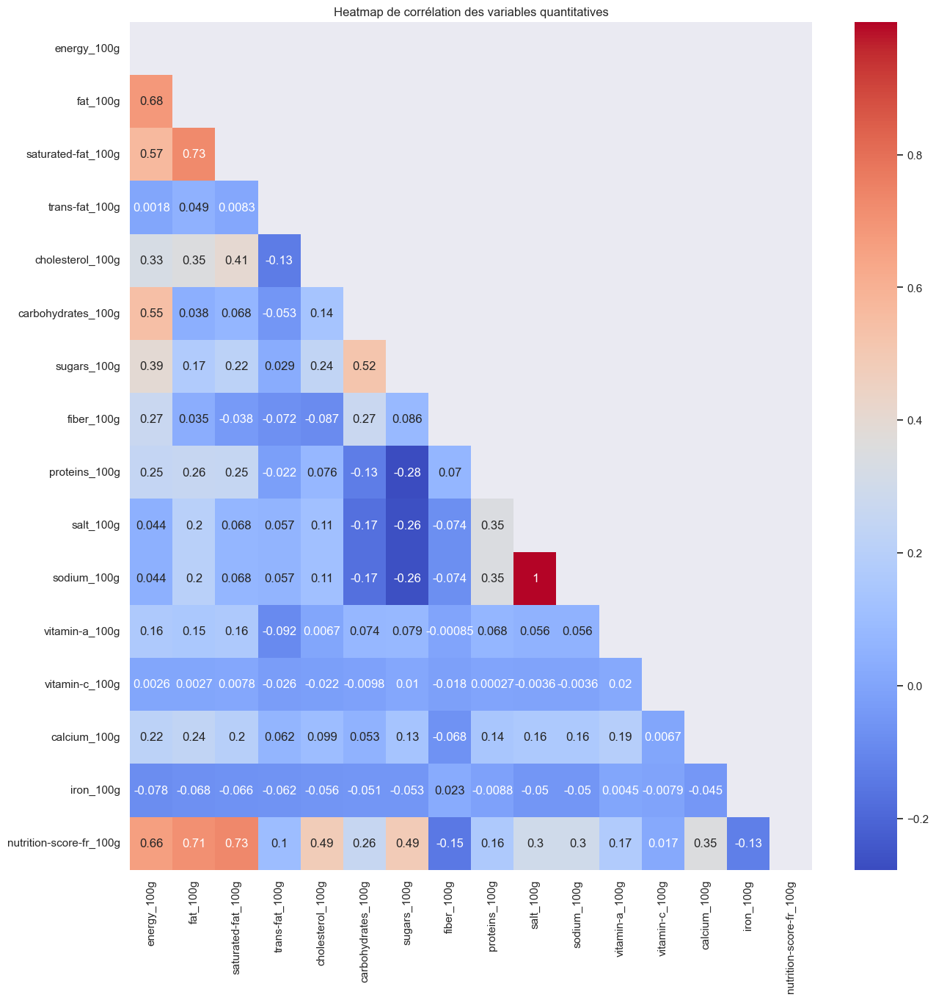

In [32]:
plt.figure(figsize=(15,15))
sns.set(font_scale=1)

corr = df_corr.corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True 

sns.heatmap(df_corr.corr(), mask=mask, annot=True, cmap='coolwarm')
plt.title('Heatmap de corrélation des variables quantitatives')
plt.show()

Analyse du tableau : 

* energy_100g : forte corrélation avec:
    * fat_100g
    * saturated-fat_100g
    * carbohydrates_100g
    * nutrition-score-fr_100g
* fat_100g et saturated-fat_100g fortement corrélés
* nutrition-score-fr_100g : forte corrélation avec:
    * saturated_fat_100g
    * energy_100g
    * fat_100g

* sugars_100g : forte corrélation avec carbohydrates_100g

* sodium_100g corrélation très forte avec salt_100g 

<a id='10'></a>

### Standardisation  des variables

[Haut de page](#sommaire)

In [33]:
df.select_dtypes(['category']).columns

Index(['additives_n', 'additives', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n'],
      dtype='object')

In [34]:
df.columns

Index(['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g',
       'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g', 'code', 'creator', 'created_t',
       'last_modified_t', 'product_name', 'brands', 'countries',
       'countries_fr', 'ingredients_text', 'serving_size', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr'],
      dtype='object')

In [35]:
from sklearn import preprocessing
numeric_columns= df.select_dtypes(['int64', 'float64'])

data_pairplot=  numeric_columns[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g', 'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g']]
X = data_pairplot.values

min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(X)
data_pairplot = pd.DataFrame(x_scaled ,  columns=['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g',
       'vitamin-c_100g', 'calcium_100g', 'iron_100g', 'nutrition-score-fr_100g'])
data_pairplot= pd.concat([data_pairplot , df['nutrition_grade_fr']] , axis= 1)

In [36]:
data_pairplot= data_pairplot[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g',
       'vitamin-c_100g', 'calcium_100g', 'iron_100g', 'nutrition-score-fr_100g' , 'nutrition_grade_fr']]

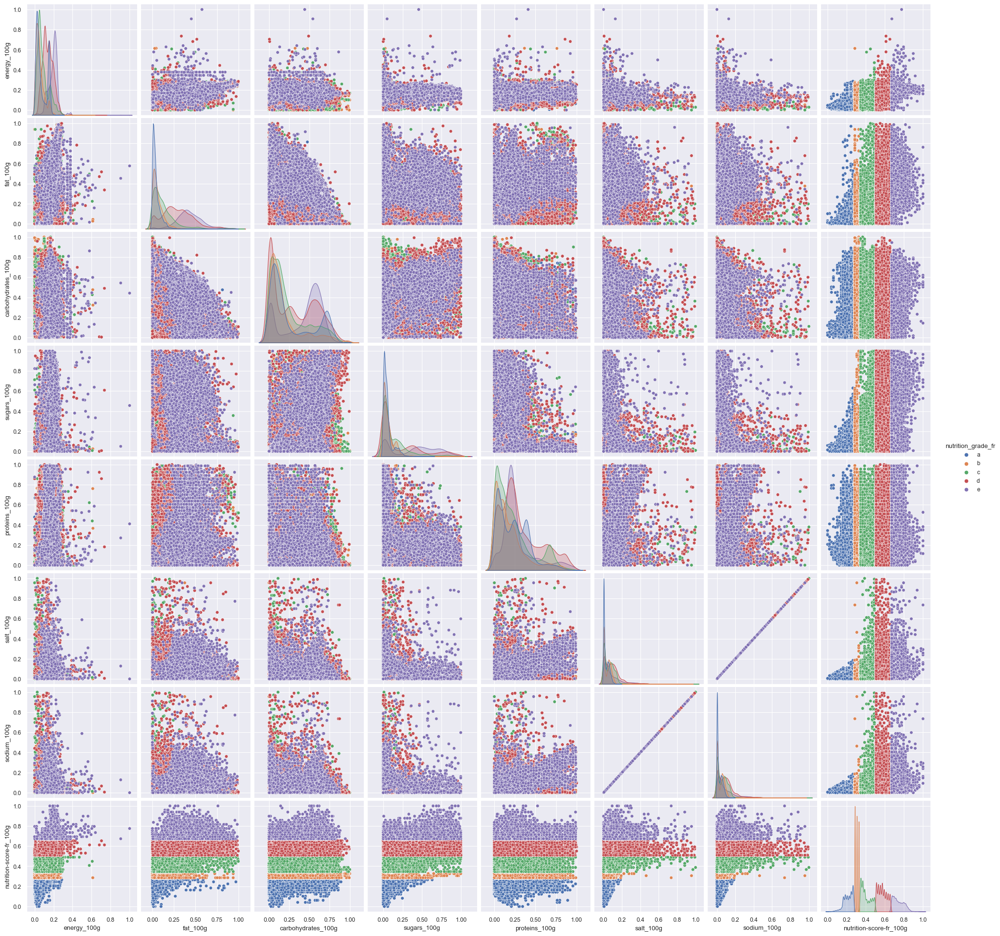

In [107]:
sns.pairplot(data_pairplot ,vars=data_pairplot[['energy_100g','fat_100g','carbohydrates_100g', 'sugars_100g',
                               'proteins_100g', 'salt_100g', 'sodium_100g' , 'nutrition-score-fr_100g']], hue='nutrition_grade_fr')

<a id='11'></a>

### Test de khi2 indépendance des variables

[Haut de page](#sommaire)

In [38]:
numeric_columns = df.select_dtypes(['int64', 'float64'])
numeric_columns= numeric_columns[numeric_columns.columns.difference(['nutriscore_score', 'nutrition-score-fr_100g'])]

def khi2(df,numeric_columns):
    alpha=0.05
    x= pd.cut(df['nutrition-score-fr_100g'], 20)
    for col in numeric_columns.columns:
        print('-'*20)
       
        print("test de khi2 entre 'nutrition-score'  et " , col)
        y= pd.cut(df[col], 20)
        tab_contingence= pd.crosstab(x.array, y.array)
        stat_chi2, p, dof, expected_table = chi2_contingency(tab_contingence.values)
        critical= chi2.ppf(1-alpha, dof)
        if p <= alpha: 
            print('Variables non indépendants (H0 Rejetée)')
        else : 
            print('H0 non rejetée')
        
khi2(df,numeric_columns)

--------------------
test de khi2 entre 'nutrition-score'  et  calcium_100g
Variables non indépendants (H0 Rejetée)
--------------------
test de khi2 entre 'nutrition-score'  et  carbohydrates_100g
Variables non indépendants (H0 Rejetée)
--------------------
test de khi2 entre 'nutrition-score'  et  cholesterol_100g
Variables non indépendants (H0 Rejetée)
--------------------
test de khi2 entre 'nutrition-score'  et  energy_100g
Variables non indépendants (H0 Rejetée)
--------------------
test de khi2 entre 'nutrition-score'  et  fat_100g
Variables non indépendants (H0 Rejetée)
--------------------
test de khi2 entre 'nutrition-score'  et  fiber_100g
Variables non indépendants (H0 Rejetée)
--------------------
test de khi2 entre 'nutrition-score'  et  iron_100g
Variables non indépendants (H0 Rejetée)
--------------------
test de khi2 entre 'nutrition-score'  et  proteins_100g
Variables non indépendants (H0 Rejetée)
--------------------
test de khi2 entre 'nutrition-score'  et  salt_100

<a id='12'></a>

### Test de normalité

[Haut de page](#sommaire)

**A : test de normalité d'Agostino & Pearson**

In [39]:
numeric_columns.columns

Index(['calcium_100g', 'carbohydrates_100g', 'cholesterol_100g', 'energy_100g',
       'fat_100g', 'fiber_100g', 'iron_100g', 'proteins_100g', 'salt_100g',
       'saturated-fat_100g', 'sodium_100g', 'sugars_100g', 'trans-fat_100g',
       'vitamin-a_100g', 'vitamin-c_100g'],
      dtype='object')

In [40]:
numeric_columns= df.select_dtypes(['int64', 'float64'])
#numeric_columns= numeric_columns.drop(columns=['additives_n','nutriscore_score','energy-kcal_100g'])
for col in numeric_columns.columns: 
    print('-'*60)
    print('Test de normalité de la colone: ', col)
    
    alpha= 0.05
    stats, p = normaltest(df[col])
    if p < alpha : 
        print("p < 0.05, l'hypothèse nulle est rejetée, La distribution n'est pas normale ")
    else : 
        print("p > 0.05, L'hypothèse nulle est maintenue , La distribution est normale ")

------------------------------------------------------------
Test de normalité de la colone:  energy_100g
p < 0.05, l'hypothèse nulle est rejetée, La distribution n'est pas normale 
------------------------------------------------------------
Test de normalité de la colone:  fat_100g
p < 0.05, l'hypothèse nulle est rejetée, La distribution n'est pas normale 
------------------------------------------------------------
Test de normalité de la colone:  saturated-fat_100g
p < 0.05, l'hypothèse nulle est rejetée, La distribution n'est pas normale 
------------------------------------------------------------
Test de normalité de la colone:  trans-fat_100g
p > 0.05, L'hypothèse nulle est maintenue , La distribution est normale 
------------------------------------------------------------
Test de normalité de la colone:  cholesterol_100g
p > 0.05, L'hypothèse nulle est maintenue , La distribution est normale 
------------------------------------------------------------
Test de normalité de la

**B. Test de normalité Kolmogorov Smirnov**

In [41]:
from scipy.stats import kstest

numeric_columns= df.select_dtypes(['float64'])
for column in numeric_columns:
    print('-'*60)
    print('Test de normalité de la colone: ', column)
    
    S, p = kstest(df[column].dropna(), 
                        'norm', 
                        args=(df[column].mean(), df[column].std()))
    alpha = 0.05
    if p < alpha: 
        print("l'hypothèse nulle est rejetée, La distribution n'est pas normale")
    else:
        print("L'hypothèse nulle est maintenue , La distribution est normale")
    
    

------------------------------------------------------------
Test de normalité de la colone:  energy_100g
l'hypothèse nulle est rejetée, La distribution n'est pas normale
------------------------------------------------------------
Test de normalité de la colone:  fat_100g
l'hypothèse nulle est rejetée, La distribution n'est pas normale
------------------------------------------------------------
Test de normalité de la colone:  saturated-fat_100g
l'hypothèse nulle est rejetée, La distribution n'est pas normale
------------------------------------------------------------
Test de normalité de la colone:  trans-fat_100g
l'hypothèse nulle est rejetée, La distribution n'est pas normale
------------------------------------------------------------
Test de normalité de la colone:  cholesterol_100g
l'hypothèse nulle est rejetée, La distribution n'est pas normale
------------------------------------------------------------
Test de normalité de la colone:  carbohydrates_100g
l'hypothèse nulle es

<a id='13'></a>

### Test ANOVA (Analyse de la variance) -  Indépendance des variables

[Haut de page](#sommaire)

In [42]:
df['nutrition_grade_fr'].dropna().unique().tolist()

['a', 'b', 'c', 'd', 'e']

In [43]:
data_a = df[df['nutrition_grade_fr'] == 'a'].select_dtypes(['int32','float64']).dropna(axis=0).dropna(axis=1)
data_b = df[df['nutrition_grade_fr'] == 'b'].select_dtypes(['int32','float64']).dropna(axis=0).dropna(axis=1)
data_c = df[df['nutrition_grade_fr'] == 'c'].select_dtypes(['int32','float64']).dropna(axis=0).dropna(axis=1)
data_d = df[df['nutrition_grade_fr'] == 'd'].select_dtypes(['int32','float64']).dropna(axis=0).dropna(axis=1)
data_e = df[df['nutrition_grade_fr'] == 'e'].select_dtypes(['int32','float64']).dropna(axis=0).dropna(axis=1)


f_statistic, p = f_oneway(data_a, data_b, data_c, data_d, data_e)

In [44]:
pd.DataFrame({'features': data_b.columns.tolist(),
              'p' : p,
              'bool_test' : p<alpha})                     
#si p<alpha : on rejette l'hypothèse d'indépendance H0 : les variables ne sont pas indépendantes

,features,p,bool_test
0,energy_100g,0.000000e+00,True
1,fat_100g,0.000000e+00,True
2,saturated-fat_100g,0.000000e+00,True
3,trans-fat_100g,0.000000e+00,True
4,cholesterol_100g,0.000000e+00,True
5,carbohydrates_100g,0.000000e+00,True
6,sugars_100g,0.000000e+00,True
7,fiber_100g,0.000000e+00,True
8,proteins_100g,0.000000e+00,True
9,salt_100g,0.000000e+00,True


En l'absence de validation de l'hypothèse de normalité, ce test n'est pas applicable mais si c'était le cas, on pourrait interpréter les résultats comme suit : Les variables suivantes ont une distribution qui change en fonction des valeurs de nutrition_grade_fr (groupes de nutrition) :
 - Toutes les variables

les données ne suivent pas une distribution normale, il est possible d'utiliser l'ANOVA sous certaines conditions. En effet, lorsque le nombre d'observations dans chaque groupe est suffisamment grand (généralement considéré comme supérieur à 30), les résultats de l'ANOVA peuvent être robustes à la violation de l'hypothèse de normalité.

<a id='p4'></a>

## <div style='background-color: #aac1cb ; padding: 5px; border: 2px solid black;'> 3. Analyse multivariée </div>  

[Haut de page](#sommaire)

In [45]:
df.columns

Index(['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g',
       'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g', 'code', 'creator', 'created_t',
       'last_modified_t', 'product_name', 'brands', 'countries',
       'countries_fr', 'ingredients_text', 'serving_size', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr'],
      dtype='object')

In [46]:
data_pca= df.select_dtypes(['int64','float64']).drop('nutrition-score-fr_100g' ,axis=1).dropna()
#data_pca.drop(columns= 'nutrition_grade_fr' , axis=1 , inplace=True)
colonnes_pca = data_pca.columns
data_pca

,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g
173,619.0,21.050,2.800,0.000000,0.000000,26.320,1.5,0.0,19.00,0.13462,0.053000,0.000158,0.06320,0.000000,0.000000
174,314.0,0.800,0.100,0.000005,0.000526,0.000,0.0,0.0,17.00,0.25400,0.100000,0.000158,0.06314,0.000983,0.000033
175,529.0,0.812,0.375,0.000009,0.001053,16.000,0.5,0.0,13.00,0.70000,0.276000,0.000158,0.06308,0.001966,0.000067
176,242.0,0.900,0.300,0.000014,0.001579,0.000,0.0,0.0,12.30,1.00000,0.393701,0.000158,0.06302,0.002948,0.000100
177,1553.0,3.200,1.200,0.000018,0.002105,70.000,2.5,2.9,13.00,0.05080,0.020000,0.000158,0.06296,0.003931,0.000133
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52252,2004.0,27.500,11.100,0.000000,0.063220,31.350,65.7,0.0,4.80,0.07000,0.027559,0.000000,0.02600,0.614000,0.001550
52253,2180.0,17.950,10.000,0.000000,0.063220,36.175,10.0,0.0,15.72,2.00000,0.787402,0.000000,0.02600,0.614000,0.001550
52254,1066.0,8.400,2.100,0.000000,0.063220,41.000,31.0,0.0,3.20,4.60000,1.811024,0.000000,0.02600,0.614000,0.001550
52255,1075.0,0.400,0.000,0.000000,0.063220,66.000,61.0,0.0,0.50,1.81610,0.715000,0.000000,0.02600,0.614000,0.001550


In [47]:
 ## Réduction et centrage des données: 
scaler= StandardScaler()
data_pca= scaler.fit_transform(data_pca)
data_pca

array([[-0.65892395,  0.67097796, -0.34619256, ...,  0.20607448,
        -1.21972532, -0.1404945 ],
       [-1.07611955, -0.93183429, -0.76877407, ...,  0.20565497,
        -1.21562252, -0.14025622],
       [-0.78203085, -0.93088447, -0.72573336, ...,  0.20523546,
        -1.21151973, -0.14001794],
       ...,
       [-0.04749303, -0.330285  , -0.45575073, ..., -0.053836  ,
         1.34358698, -0.12941466],
       [-0.03518234, -0.96349478, -0.78442524, ..., -0.053836  ,
         1.34358698, -0.12941466],
       [-0.47563146, -0.96349478, -0.03316921, ..., -0.053836  ,
         1.34358698, -0.12941466]])

In [48]:
pca= PCA(n_components=data_pca.shape[1])

In [49]:
## Entraînement des données :
pca.fit(data_pca)

PCA(n_components=15)

In [50]:
pca.explained_variance_ratio_

array([2.10076668e-01, 1.70992632e-01, 8.46243771e-02, 7.78100856e-02,
       7.31968477e-02, 7.05784928e-02, 6.65520429e-02, 6.22985723e-02,
       5.08993762e-02, 4.13440615e-02, 3.70499626e-02, 2.76072186e-02,
       1.86098963e-02, 8.35976506e-03, 9.71396074e-10])

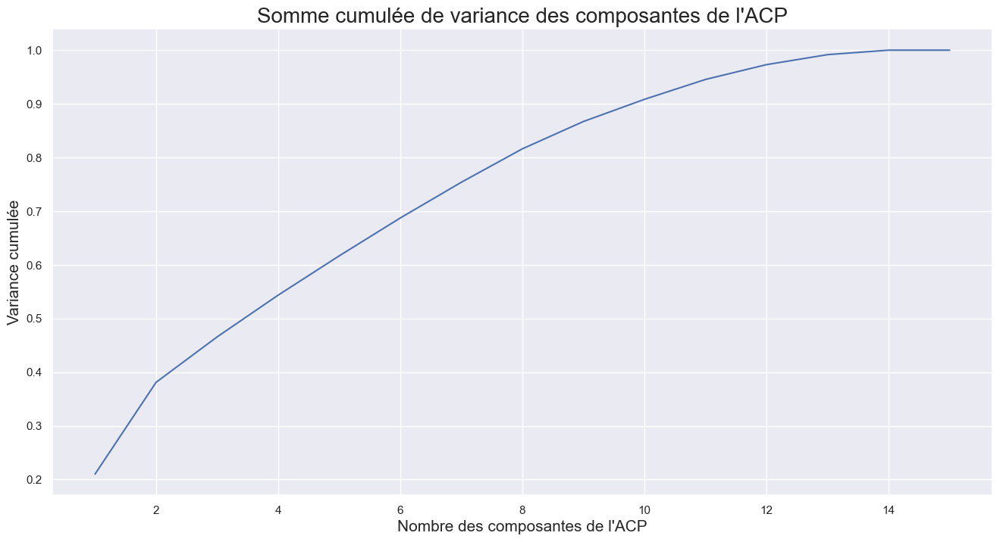

In [51]:
plt.figure(figsize=(16,8))
plt.plot(np.linspace(1,15,15), np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Nombre des composantes de l'ACP", fontsize=15)
plt.ylabel('Variance cumulée', fontsize=15)
plt.title("Somme cumulée de variance des composantes de l'ACP", fontsize=20)
plt.show()

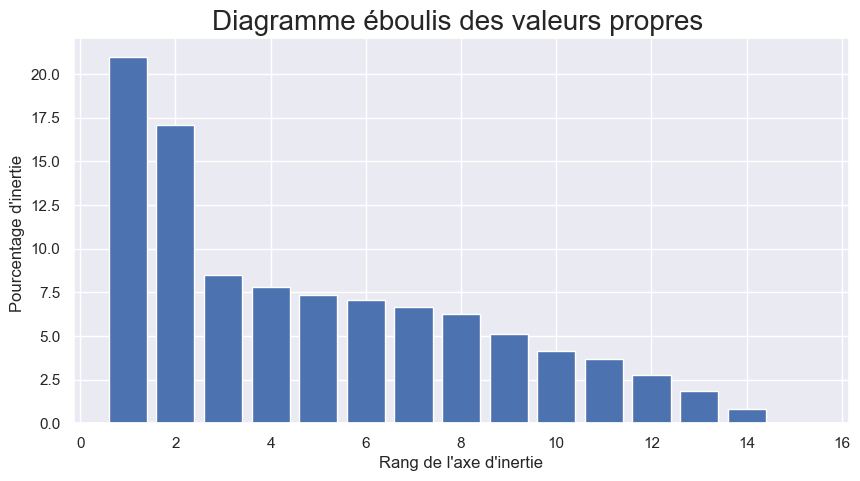

In [52]:
plt.figure(figsize=(10,5))
plt.bar(np.linspace(1,15,15), pca.explained_variance_ratio_*100)
plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie ")
#Parce que les inerties portées par chaque axe us sont égales aux valeurs propres λs de la matrice de covariance des données
plt.title("Diagramme éboulis des valeurs propres ", fontsize=20)
plt.show()

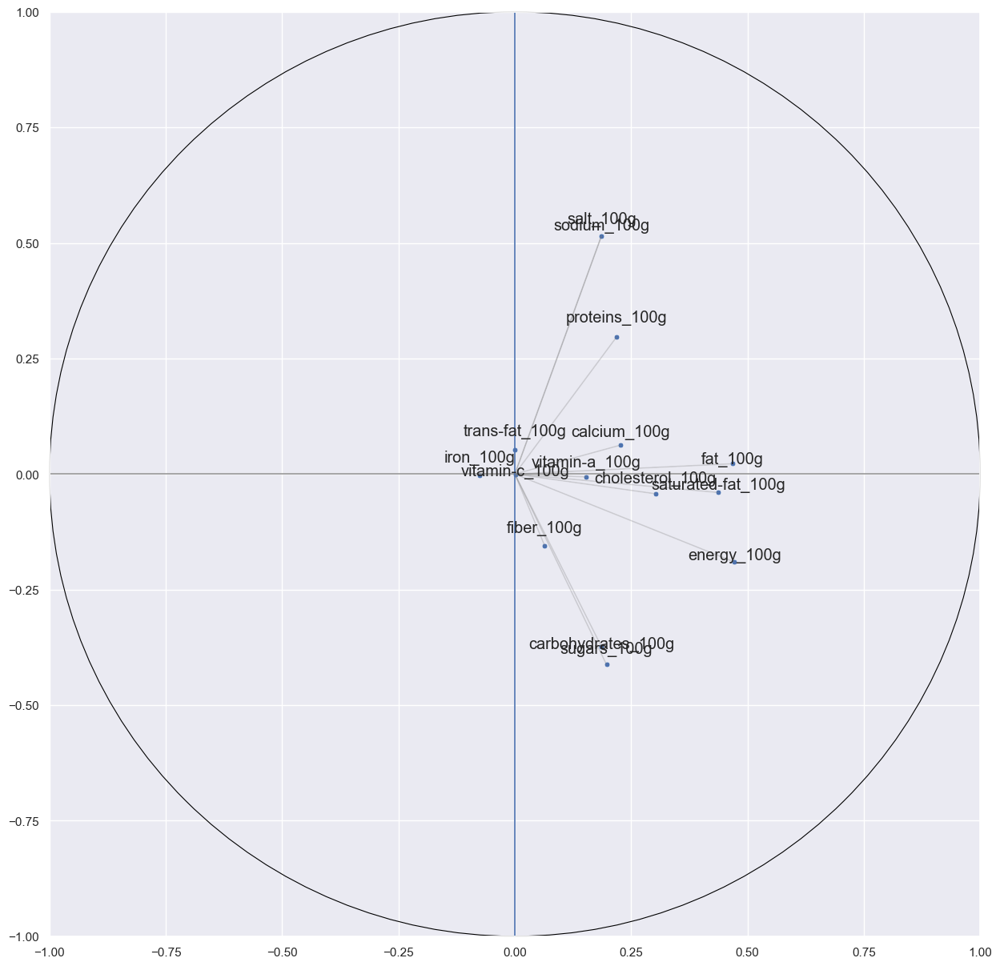

In [53]:
plt.figure(figsize=(15,15))
plt.grid(True)
sns.set_context("paper", font_scale=1.5) 
ax= plt.gca()

#Patch (matplotlib.patches.Patch), qui est la classe de base d'objets géométriques
ax.add_patch(Circle([0,0], radius=1 , color= 'black', fill=False , linestyle='-' , clip_on = False))
ax.set_xlim(-1,1)
ax.set_ylim(-1,1)
x_pca= pca.components_[0,:]
y_pca= pca.components_[1,:]

sns.scatterplot(x_pca, y_pca)
plt.plot([-1,1],[0,0] , color='grey' , alpha=0.8)
plt.plot([0,0], [-1,1])
 

i = 0
for x,y,colonne in zip(x_pca,y_pca, colonnes_pca):

    plt.annotate(colonne, 
                 (x,y), 
                 textcoords="offset points", 
                 xytext=(0,5+np.random.randint(-10,10)),
                 ha='center') 
    ax.arrow(0, 0, x, y, head_width=0, head_length=0, fc='grey', ec='grey',alpha=0.2)



#ax.add_patch(Circle([0,0], radius=1, color='black', fill=False, linestyle='-', clip_on=False))

* fat_100g et saturated-fat_100g expliquent bien la variance sur la composante 1 mais pas sur la composante 2
* sodium_100g et salt_100g sont quasi confondus : les variables sont corrélées positivement
* carbohydrates_100g et sugars_100g sont très proches et donc également corrélées positivement
* carbohydrates_100g, sugars_100g, sodium_100g et salt_100g expliquent bien la variance sur la composante 2, moins sur la composante 1.

In [54]:
X_projected= pca.fit_transform(data_pca)
pd.DataFrame(X_projected, columns=["F"+str(i+1) for i in range(15)])

,F1,F2,F3,F4,F5,F6,F7,F8,F9,F10,F11,F12,F13,F14,F15
0,-0.772377,0.277310,-0.393925,1.427328,-0.817049,-0.356768,0.621552,-0.602038,-0.110496,-1.360429,-0.700515,-0.311730,0.578753,-1.031192,0.000003
1,-2.131550,0.777443,-0.462172,1.271712,-0.558680,-0.036282,0.543755,-0.682935,-0.272651,-1.154109,-0.095220,-0.728033,0.293170,0.013594,0.000002
2,-1.828763,0.697284,-0.088674,0.788838,-0.496959,0.395004,0.496901,-0.450577,-0.014345,-1.038027,-0.394868,-0.294958,0.103736,0.062052,0.000634
3,-2.057399,1.253088,-0.316390,0.792453,-0.478958,0.472565,0.475703,-0.439330,0.068018,-0.623769,-0.296674,-0.577933,0.125015,0.068732,0.000001
4,-0.729274,-1.159891,1.435678,0.768328,-0.736376,0.116833,0.617277,-0.423252,-0.148640,-1.524920,-0.459013,0.672945,-0.088333,-0.012565,-0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52079,2.428180,-2.396115,-1.698155,-0.611301,-0.519321,1.396039,-0.173263,0.711727,-1.603111,0.458313,-0.386584,-1.459796,0.744231,0.294600,0.000001
52080,2.453819,1.044646,-0.347661,0.034417,-0.799912,1.236731,0.002980,0.325074,-1.858040,-0.627826,-0.084263,0.451171,0.046267,0.660913,-0.000002
52081,1.558759,2.542833,0.706086,-2.279162,-0.085849,3.514373,-0.345966,1.274093,-1.045341,0.612697,-0.276835,-0.391753,-0.078642,0.218740,-0.000005
52082,0.683059,-1.156518,0.158923,-2.300947,0.195106,3.211453,-0.417235,1.129689,-1.597228,-0.096340,0.069121,-1.052808,0.111243,0.082980,-0.000003


In [55]:
f1= pca.components_[0]
print(f1)

[ 4.71960669e-01  4.67928392e-01  4.37649244e-01 -4.23977954e-04
  3.01944889e-01  1.86009533e-01  1.96913086e-01  6.41938907e-02
  2.19091737e-01  1.86149000e-01  1.86149032e-01  1.53759789e-01
  1.09323787e-03  2.26606918e-01 -7.61259452e-02]


In [56]:
pca_analysis = pd.DataFrame(pca.components_)
pca_analysis.columns= colonnes_pca
pca_analysis

,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g
0,0.471961,0.467928,4.376492e-01,-0.000424,3.019449e-01,1.860095e-01,1.969131e-01,6.419389e-02,2.190917e-01,0.186149,0.186149,1.537598e-01,1.093238e-03,2.266069e-01,-7.612595e-02
1,-0.190443,0.022299,-3.994504e-02,0.052241,-4.264255e-02,-3.732984e-01,-4.123034e-01,-1.554675e-01,2.973115e-01,0.515376,0.515376,-6.261781e-03,-1.526024e-03,6.249959e-02,-2.916582e-03
2,0.179838,-0.187670,-3.100084e-01,-0.136740,-2.485843e-01,4.102841e-01,-7.092334e-03,6.644834e-01,1.586532e-01,0.228450,0.228451,2.398889e-02,-4.341310e-02,-9.992755e-02,6.264097e-02
3,0.022552,0.124411,1.908345e-01,-0.571238,7.824524e-02,-2.330169e-01,-3.069214e-01,1.663078e-01,3.093849e-01,-0.213229,-0.213231,1.082797e-01,6.051286e-02,-2.489289e-01,4.183297e-01
4,-0.086280,-0.126235,-1.132154e-01,-0.196073,-2.011481e-01,4.553650e-02,8.721373e-02,-1.467234e-01,-8.869552e-02,0.014979,0.014979,7.167292e-01,2.809600e-01,4.793953e-01,1.513779e-01
5,-0.109423,-0.180320,-1.327093e-01,-0.571526,5.205144e-01,1.855909e-01,1.923572e-01,-2.220348e-01,-2.791608e-01,0.228864,0.228864,-9.667846e-02,2.685758e-02,-1.540164e-01,-5.568338e-02
6,0.037999,0.028471,2.606835e-02,-0.004830,-4.027068e-02,-1.343985e-02,-4.359979e-02,7.007837e-02,6.226130e-02,-0.014834,-0.014834,-1.520039e-01,9.084634e-01,-1.549091e-01,-3.342214e-01
7,0.031002,0.028368,-1.389919e-02,0.285222,6.336148e-02,7.640695e-02,1.677731e-01,-6.402291e-02,-1.367606e-01,0.117330,0.117331,-2.588973e-01,2.922159e-01,1.927038e-02,8.219272e-01
8,0.024603,0.133590,1.122188e-01,0.222188,-7.345799e-02,-1.028420e-02,3.010630e-02,-4.006491e-02,-2.792420e-01,0.121932,0.121933,5.214585e-01,-1.230868e-02,-7.289374e-01,2.105342e-02
9,-0.129723,0.267377,1.016866e-01,-0.110123,-2.789421e-03,-4.202202e-01,9.616317e-03,5.273646e-01,-6.100015e-01,0.073312,0.073310,-6.578209e-02,3.678499e-03,2.143923e-01,-3.548999e-02


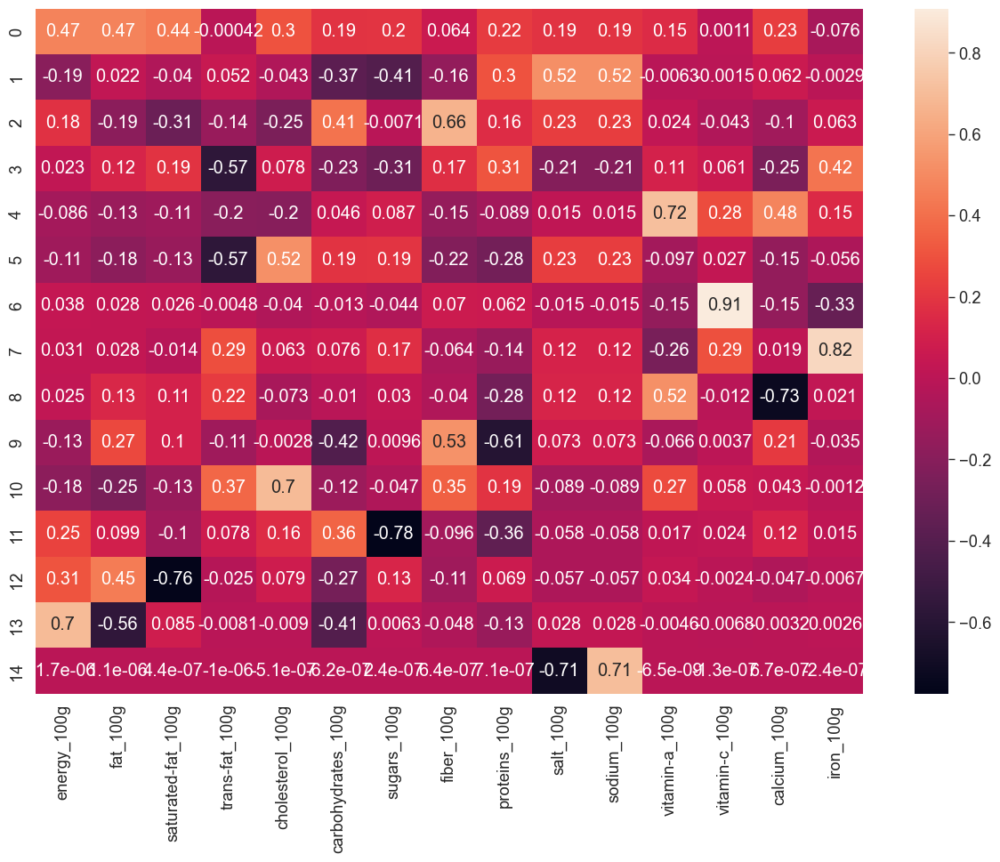

In [57]:
plt.figure(figsize=(15,10))
sns.heatmap(pca_analysis , annot=True)
plt.show()

La matrice de corrélation de l’ACP nous donne une information sur la structure de chaque axe d’inertie
Par exemple la première composante est composée principalement par  :
* nergy_100g;
* carbohydrates_100g;
* sugars_100g.


In [58]:
#df.columns

In [59]:
df['nutrition_grade_fr']= df['nutrition_grade_fr'].astype('category')


nutriscore_index= df.select_dtypes(['float64','int32']).drop(['nutrition-score-fr_100g'], axis=1).dropna().index
nutriscore_grade = df['nutrition_grade_fr'].loc[nutriscore_index]
nutriscore_grade = nutriscore_grade.cat.add_categories("Inconnue").fillna("Inconnue")
unknown_index = nutriscore_grade[nutriscore_grade =='Inconnue'].index


data_pca= df.select_dtypes(['float64','int32']).drop(['nutrition-score-fr_100g'], axis=1).dropna()
pca_X = pca.transform(data_pca.drop(unknown_index).dropna())[:,0]

pca_Y = pca.transform(data_pca.drop(unknown_index).dropna())[:,1]

hue_pca = nutriscore_grade[nutriscore_grade != 'Inconnue']

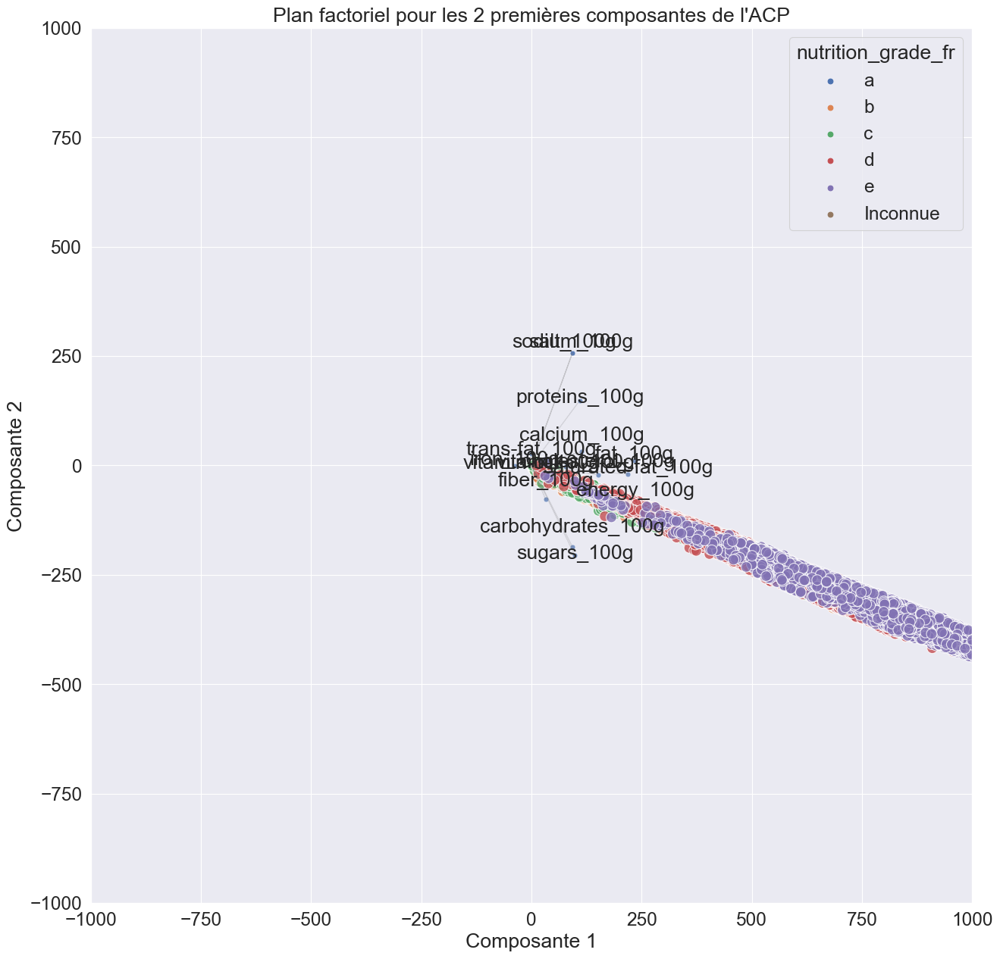

In [60]:
from matplotlib.patches import Circle
sns.set_context("paper", font_scale=2) 
plt.figure(figsize=(15,15))
chaine = "Plan factoriel pour les 2 premières composantes de l'ACP"
plt.title(chaine)
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')
ax = plt.gca()

ax.set_xlim(-1000,1000)
ax.set_ylim(-1000,1000)
x_pca = pca.components_[0,:]*500
y_pca = pca.components_[1,:]*500

sns.scatterplot(x = x_pca,
                y = y_pca,
               alpha = 0.7)
sns.scatterplot(x = pca_X,
                y = pca_Y,
                hue = hue_pca,
                alpha=0.8, s=100)
plt.plot([-1,1],[0,0], color='grey', alpha=0.8)
plt.plot([0,0],[-1,1], color='grey', alpha=0.8)

i = 0
for x,y,colonne in zip(x_pca,y_pca, colonnes_pca):

    plt.annotate(colonne, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 xytext=(0,5+np.random.randint(-10,10)), # distance from text to points (x,y)
                 ha='center') # horizontal alignment can be left, right or center
    ax.arrow(0, 0, x, y, head_width=0, head_length=0, fc='grey', ec='grey',alpha=0.2)


sns.set_context("paper", font_scale=1)

<a id='p5'></a>

## <div style='background-color: #aac1cb ; padding: 5px; border: 2px solid black;'> 4. Idée d'application </div>  

**Élaborer une idée d’application. Identifier des arguments justifiant la faisabilité (ou non) de l’application à partir des données Open Food Facts.**

Idées : 
* Identifier les caractéristiques nutritionnelles des produits mauvais nutriscores et étiqueter automatiquement les produits qui ont des caractéristiques similaires
* **Calcul automatique de nutriscore**


L'idée d'application vient à partir des analyses réalisées jusqu'à présent et qui montre : 
* La corrélation entre les variables ; 
* La non indépendce des variables ; 
* Le sens métier : le nutri score est forcement calculée à partir des composantes des produits alimentaires. 

In [61]:
numeric_data= df.select_dtypes(['int64', 'float64']).dropna()
# #numeric_data = numeric_data.drop(columns=['additives_n' , 'nutriscore_score','energy-kcal_100g'])
# colone= numeric_data.columns
# scaler = StandardScaler()
# X= numeric_data.values
# X_scaler = scaler.fit_transform(X)
# numeric_data= pd.DataFrame(X_scaler , columns=colone)
numeric_data

,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
173,619.0,21.050,2.800,0.000000,0.000000,26.320,1.5,0.0,19.00,0.13462,0.053000,0.000158,0.06320,0.000000,0.000000,-2.0
174,314.0,0.800,0.100,0.000005,0.000526,0.000,0.0,0.0,17.00,0.25400,0.100000,0.000158,0.06314,0.000983,0.000033,-4.0
175,529.0,0.812,0.375,0.000009,0.001053,16.000,0.5,0.0,13.00,0.70000,0.276000,0.000158,0.06308,0.001966,0.000067,-1.0
176,242.0,0.900,0.300,0.000014,0.001579,0.000,0.0,0.0,12.30,1.00000,0.393701,0.000158,0.06302,0.002948,0.000100,-1.0
177,1553.0,3.200,1.200,0.000018,0.002105,70.000,2.5,2.9,13.00,0.05080,0.020000,0.000158,0.06296,0.003931,0.000133,-4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52252,2004.0,27.500,11.100,0.000000,0.063220,31.350,65.7,0.0,4.80,0.07000,0.027559,0.000000,0.02600,0.614000,0.001550,25.0
52253,2180.0,17.950,10.000,0.000000,0.063220,36.175,10.0,0.0,15.72,2.00000,0.787402,0.000000,0.02600,0.614000,0.001550,25.0
52254,1066.0,8.400,2.100,0.000000,0.063220,41.000,31.0,0.0,3.20,4.60000,1.811024,0.000000,0.02600,0.614000,0.001550,21.0
52255,1075.0,0.400,0.000,0.000000,0.063220,66.000,61.0,0.0,0.50,1.81610,0.715000,0.000000,0.02600,0.614000,0.001550,20.0


In [62]:
numeric_data.describe()

,energy_100g,fat_100g,saturated-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,vitamin-a_100g,vitamin-c_100g,calcium_100g,iron_100g,nutrition-score-fr_100g
count,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000,52084.000000
mean,1100.720819,12.572835,5.011928,0.210535,0.015891,28.408236,12.177931,1.986911,7.965223,0.905729,0.356586,0.000284,0.033705,0.292165,0.019654,8.210679
std,731.078966,12.634165,6.389361,0.291604,0.026882,25.632477,16.613955,2.567451,6.884241,1.161374,0.457235,0.000210,0.143128,0.239536,0.139895,9.077125
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-14.000000
25%,460.000000,2.100000,0.400000,0.003266,0.000000,5.100000,1.000000,0.000000,2.800000,0.100000,0.039370,0.000124,0.012788,0.121600,0.003300,1.000000
50%,1023.000000,8.000000,2.100000,0.074170,0.002450,18.500000,3.700000,1.125000,6.300000,0.640080,0.252000,0.000236,0.023781,0.186838,0.005523,7.000000
75%,1633.000000,21.000000,7.400000,0.301361,0.017883,52.054167,17.000000,2.900000,11.000000,1.295400,0.510000,0.000414,0.041875,0.378753,0.007525,15.000000
max,9983.000000,63.900000,30.800000,1.000000,0.175000,100.000000,70.200000,16.100000,31.400000,13.600000,5.354331,0.001381,7.500000,1.534000,2.400000,35.000000


In [63]:
X = numeric_data.drop(columns='nutrition-score-fr_100g', axis=1)
y = numeric_data['nutrition-score-fr_100g']
print(X.shape , y.shape)

(52084, 15) (52084,)


In [64]:
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

<a id='4'></a>

###  Linéaire régression : 

[Haut de page](#sommaire)

In [66]:
model = LinearRegression()
X = numeric_data.drop(columns='nutrition-score-fr_100g', axis=1)
y = numeric_data['nutrition-score-fr_100g']
print(X.shape, y.shape)
scaler = StandardScaler()
X = scaler.fit_transform(X)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model.fit(X_train, y_train)
print("le coefficient de détrmination est :" ,r2_score(y_test, model.predict(X_test)))
print("L’erreur absolue moyenne est : ", metrics.mean_absolute_error(y_test, model.predict(X_test)))
print("Le carré moyen des erreurs",metrics.mean_squared_error(y_test, model.predict(X_test)))
print("L’erreur quadratique moyenne est : ", np.sqrt(metrics.mean_squared_error(y_test, model.predict(X_test))))

(52084, 15) (52084,)
le coefficient de détrmination est : 0.8654910280662053
L’erreur absolue moyenne est :  2.5545933199676516
Le carré moyen des erreurs 11.193649706268744
L’erreur quadratique moyenne est :  3.345691215021007


**Le coefficient de détermination est moyenne on doit le maximiser tout en minimisant le MSE ou le carré moyen des erreurs** 
* Pour augmenter la perfermance  de mon modèle je vais utiliser la cross validation et plus précisement le Shuffle split. 
* Cette technique consiste à mélanger puis découper le Dataset en deux parties : Une partie de Train, et une partie de Test. Une fois l'entrainement puis l'évaluation complétée, On rassemble nos données, on les remélange, puis on redécoupe le DataSet dans les même proportions que précédemment. On répète ainsi l'action pour autant d'itérations de Cross-Validation que l'on désire. On peut ainsi retrouver plusieurs fois les mêmes données dans le jeu de validation a travers les Itérations.

In [67]:
model = LinearRegression()
X = numeric_data.drop(columns='nutrition-score-fr_100g', axis=1)
y = numeric_data['nutrition-score-fr_100g']
scaler = StandardScaler()
X = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

cv= ShuffleSplit(30, test_size=0.2)
cross_val_score(model, X_train, y_train , cv=cv).mean()

0.8696295575764313

In [68]:
lr = LinearRegression().fit(X_train, y_train)
pertinence_variables = pd.DataFrame()
pertinence_variables['coefs'] = lr.coef_.T
pertinence_variables

,coefs
0,1.909406
1,1.328650
2,3.190645
3,0.509624
4,0.784477
5,0.164768
6,3.170727
7,-1.701083
8,-0.206235
9,43.776721


In [69]:
resultat = pd.DataFrame({'nutriscore_reel' : y_test, 'prediction' : lr.predict(X_test)}).reset_index()
resultat.head()

,index,nutriscore_reel,prediction
0,41493,12.0,10.911258
1,2181,-1.0,2.392395
2,36797,11.0,11.719383
3,48538,21.0,24.502803
4,5649,-3.0,-2.798212


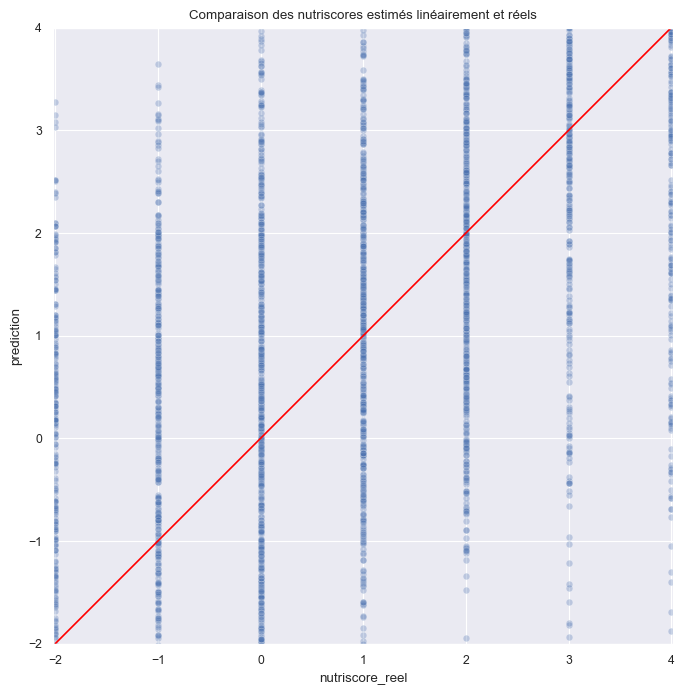

In [70]:
plt.figure(figsize=(8,8))
plt.axis('equal')
plt.title('Comparaison des nutriscores estimés linéairement et réels')
sns.scatterplot(x = resultat['nutriscore_reel'], y = resultat['prediction'], alpha=0.3)
sns.lineplot([-2 , 4], [-2, 4], color='red')
ax = plt.gca()
ax.set_xlim(-2,4)
ax.set_ylim(-2,4)
plt.show()

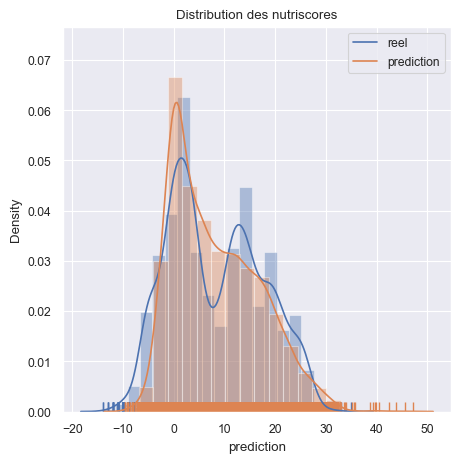

In [71]:
plt.figure(figsize=(5,5))
plt.title('Distribution des nutriscores')
sns.distplot(resultat['nutriscore_reel'], bins=20, rug=True)
sns.distplot(resultat['prediction'], bins = 20, rug=True)
plt.legend(['reel', 'prediction'])

[ 6666  9629 12592 15555 18518 21481 24444 27407 30370 33333]


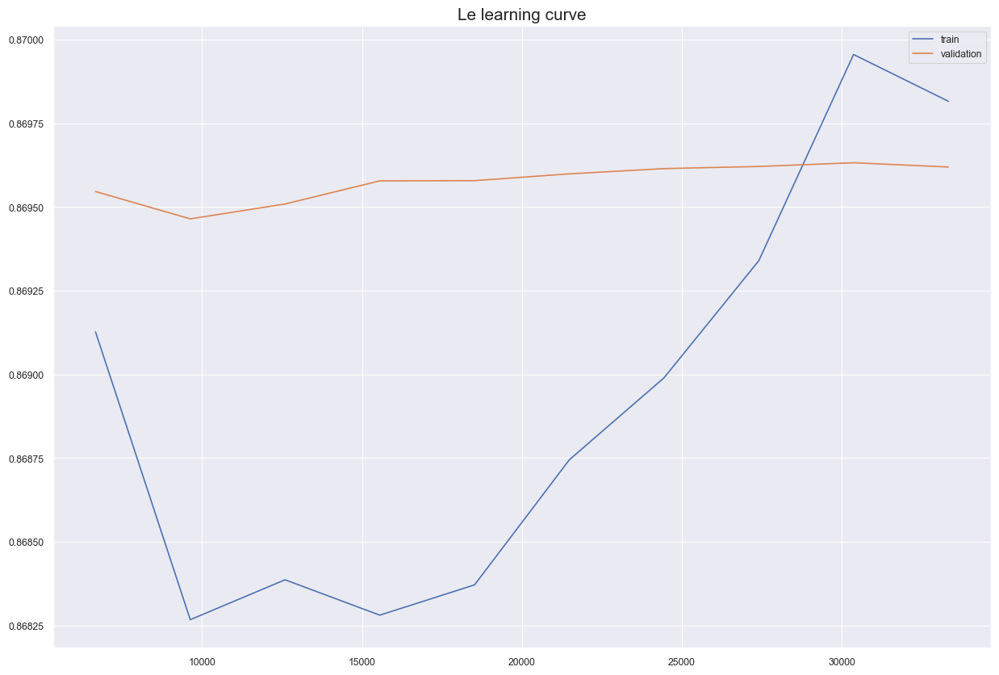

In [72]:
from sklearn.model_selection import learning_curve
N, train_score , val_score= learning_curve(model, X_train , y_train, train_sizes=np.linspace(0.2,1,10))
print(N)
plt.figure(figsize=(15,10))
plt.plot(N , train_score.mean(axis=1), label='train')
plt.plot(N , val_score.mean(axis=1), label='validation')
plt.title('Le learning curve' , fontsize= 15)
plt.legend()
plt.show()

Au début de la phase d'entrainement les données de l'entrainement et de validation ont été divergents c'est à dire les données de validation ne colle pas avec les données d'entrainement. au fur à mesure que les itérations augmentent les deux modèles commencent à converger . sans que cela ne reste longtemps . les données comment à diverger on peut expliquer ce phènomène par l'overfittig. 
Pour reméduer à ce problème je vais utiliser la régularisation L1 et L2

In [73]:
data_reg = numeric_data
pertinence_variables['colonnes']= data_reg.drop(['nutrition-score-fr_100g'], axis=1).columns.tolist()
pertinence_variables['coefs'] = abs(pertinence_variables['coefs'])
pertinence_variables.sort_values(by='coefs', inplace=True, ascending=False)

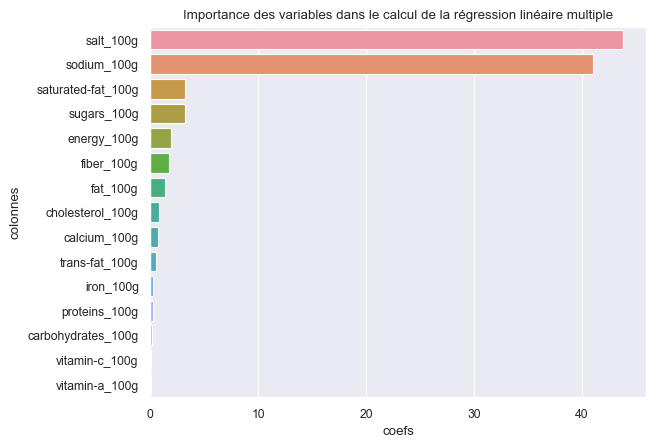

In [74]:
plt.title('Importance des variables dans le calcul de la régression linéaire multiple')
sns.barplot(x = pertinence_variables['coefs'], y =pertinence_variables['colonnes'])
plt.show()

<a id='5'></a>

###  Régularisation Lasso :  

[Haut de page](#sommaire)

le lasso permet de supprimer des variables en mettant leur poids à zéro. C'est le cas si deux variables sont corrélées. L'une sera sélectionnée par le Lasso, l'autre supprimée. C'est aussi son avantage par rapport à une régression ridge qui ne fera pas de sélection de variables.

In [75]:
X = numeric_data.drop(columns='nutrition-score-fr_100g', axis=1)
y = numeric_data['nutrition-score-fr_100g']
print(X.shape, y.shape)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

hyper_params= [0.005, 0.02, 0.03, 0.05, 0.06 ,1,2,3 , 0.001, 0.00005 ]
for params in hyper_params: 
    print('-'*20)
    print("l'hyper paramètre", params)
    model= Lasso(alpha=params)
    model.fit(X_train, y_train)
    print("le coefficient de détrmination est :" ,r2_score(y_test, model.predict(X_test)))
   
    print("MSE" , metrics.mean_squared_error(y_test, model.predict(X_test)))

(52084, 15) (52084,)
--------------------
l'hyper paramètre 0.005
le coefficient de détrmination est : 0.8654830492347413
MSE 11.19431369353434
--------------------
l'hyper paramètre 0.02
le coefficient de détrmination est : 0.8653938979723342
MSE 11.201732737691096
--------------------
l'hyper paramètre 0.03
le coefficient de détrmination est : 0.8653079968550256
MSE 11.20888130928975
--------------------
l'hyper paramètre 0.05
le coefficient de détrmination est : 0.8650801596740636
MSE 11.227841602845533
--------------------
l'hyper paramètre 0.06
le coefficient de détrmination est : 0.8649342328118406
MSE 11.23998543351331
--------------------
l'hyper paramètre 1
le coefficient de détrmination est : 0.8052081449871407
MSE 16.21030745608139
--------------------
l'hyper paramètre 2
le coefficient de détrmination est : 0.6592428921804099
MSE 28.35733293487028
--------------------
l'hyper paramètre 3
le coefficient de détrmination est : 0.5183629472031615
MSE 40.08116616355567
---------

<a id='6'></a>

### Régularisation Ridge : 

[Haut de page](#sommaire)

Le Ridge permet de réduire l'erreur totale du modèle à l'aide de l'ajout du biais qui quantifie la complexité ( ou l'ajout de pénalité)

In [76]:
X = numeric_data.drop(columns='nutrition-score-fr_100g', axis=1)
y = numeric_data['nutrition-score-fr_100g']
print(X.shape, y.shape)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


hyper_params= [1e-8, 1e-7, 0.000001, 0.001, 0.005, 0.01, 0.05, 0.5, 0.6 , 500 , 600, 700]
for params in hyper_params: 
    print('-'*20)
    print("l'hyper paramètre", params)
    model= Ridge(alpha= params)
    model.fit(X_train, y_train)
    print("le coefficient de détrmination est :" ,r2_score(y_test, model.predict(X_test)))

(52084, 15) (52084,)
--------------------
l'hyper paramètre 1e-08
le coefficient de détrmination est : 0.8654910282472518
--------------------
l'hyper paramètre 1e-07
le coefficient de détrmination est : 0.865491029875036
--------------------
l'hyper paramètre 1e-06
le coefficient de détrmination est : 0.865491046126677
--------------------
l'hyper paramètre 0.001
le coefficient de détrmination est : 0.8654979084698664
--------------------
l'hyper paramètre 0.005
le coefficient de détrmination est : 0.865500912888688
--------------------
l'hyper paramètre 0.01
le coefficient de détrmination est : 0.8655014828539812
--------------------
l'hyper paramètre 0.05
le coefficient de détrmination est : 0.865501985053318
--------------------
l'hyper paramètre 0.5
le coefficient de détrmination est : 0.8655020635848166
--------------------
l'hyper paramètre 0.6
le coefficient de détrmination est : 0.8655020564731256
--------------------
l'hyper paramètre 500
le coefficient de détrmination est : 

<a id='7'></a>

### Elastic Net :

[Haut de page](#sommaire)

Elastic Net et la combinaison du Ridge et du Lasso

In [77]:
X = numeric_data.drop(columns='nutrition-score-fr_100g', axis=1)
y = numeric_data['nutrition-score-fr_100g']
print(X.shape, y.shape)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

hyper_params= [1e-8, 1e-7, 0.000001, 0.001, 0.005, 0.01, 0.05, 0.5, 0.6 , 500 , 600, 700]
for params in hyper_params: 
    print('-'*20)
    print("l'hyper paramètre", params)
    model= ElasticNet(alpha= params)
    model.fit(X_train, y_train)
    print("le coefficient de détrmination est :" ,r2_score(y_test, model.predict(X_test)))

(52084, 15) (52084,)
--------------------
l'hyper paramètre 1e-08
le coefficient de détrmination est : 0.8655017843485079
--------------------
l'hyper paramètre 1e-07
le coefficient de détrmination est : 0.8655017839777537
--------------------
l'hyper paramètre 1e-06
le coefficient de détrmination est : 0.8655017806745977
--------------------
l'hyper paramètre 0.001
le coefficient de détrmination est : 0.8654981526871043
--------------------
l'hyper paramètre 0.005
le coefficient de détrmination est : 0.86548023956815
--------------------
l'hyper paramètre 0.01
le coefficient de détrmination est : 0.8654501849959761
--------------------
l'hyper paramètre 0.05
le coefficient de détrmination est : 0.8649348489657945
--------------------
l'hyper paramètre 0.5
le coefficient de détrmination est : 0.8401172443312993
--------------------
l'hyper paramètre 0.6
le coefficient de détrmination est : 0.8316338360025415
--------------------
l'hyper paramètre 500
le coefficient de détrmination est 

<a id='8'></a>

### Random Forest Regressor 

[Haut de page](#sommaire)

In [78]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

params = {
    'n_estimators': [200],
    'verbose' : [1]
}

rfr = GridSearchCV(RandomForestRegressor(), params, cv = 5)

In [79]:
X = numeric_data.drop(columns='nutrition-score-fr_100g', axis=1)
y = numeric_data['nutrition-score-fr_100g']
print(X.shape, y.shape)
scaler = StandardScaler()
X = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rfr.fit(X_train, y_train);

(52084, 15) (52084,)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

In [80]:
y_pred = rfr.predict(X_test);

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.3s finished


In [81]:
rfr.best_estimator_

RandomForestRegressor(n_estimators=200, verbose=1)

In [82]:

print('R² sur jeu d\'entraînement : ', rfr.best_estimator_.score(X_train,y_train))
print('R² sur jeu de test', rfr.best_estimator_.score(X_test,y_test))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


R² sur jeu d'entraînement :  0.9970745995137759
R² sur jeu de test 0.9789026824585871


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.4s finished


In [83]:
resultat = pd.DataFrame({'nutriscore_reel' : y_test, 'prediction' : rfr.predict(X_test)}).reset_index()
resultat

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.5s finished


,index,nutriscore_reel,prediction
0,41493,12.0,13.875
1,2181,-1.0,-1.195
2,36797,11.0,11.205
3,48538,21.0,21.375
4,5649,-3.0,-3.575
...,...,...,...
10412,45108,20.0,19.765
10413,20433,9.0,8.545
10414,46707,25.0,25.440
10415,271,-1.0,-1.445


In [84]:
resultat.describe()

,index,nutriscore_reel,prediction
count,10417.000000,10417.000000,10417.000000
mean,26263.568494,8.220121,8.202205
std,15079.562100,9.122861,8.971337
min,177.000000,-14.000000,-10.860000
25%,13159.000000,1.000000,0.895000
50%,26405.000000,7.000000,7.090000
75%,39492.000000,15.000000,15.005000
max,52247.000000,35.000000,33.990000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.4s finished


(-17.5, 37.5, -17.5, 37.5)

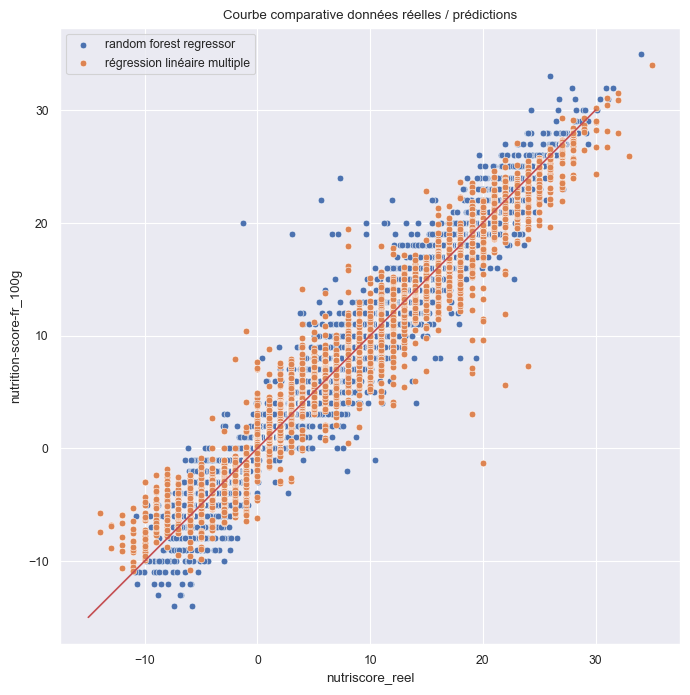

In [85]:
plt.figure(figsize=(8,8))
plt.title('Courbe comparative données réelles / prédictions')
sns.scatterplot(x = rfr.predict(X_test),y = y_test)
sns.scatterplot(x = resultat['nutriscore_reel'], y = resultat['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])
sns.lineplot([-15,30],[-15,30], color='r')
ax = plt.gca()
ax.set_xlim(-2,5)
ax.set_ylim(-2,3)
ax.axis('equal')

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.4s finished


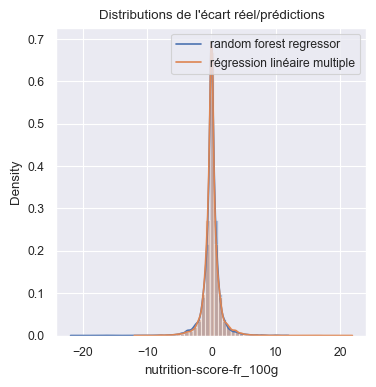

In [86]:
plt.figure(figsize=(4,4))
plt.title('Distributions de l\'écart réel/prédictions')
sns.distplot(rfr.predict(X_test) -  y_test)
sns.distplot(resultat['nutriscore_reel'] - resultat['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])

In [87]:
rfr.best_estimator_.feature_importances_

array([0.05413266, 0.00479199, 0.57433441, 0.04793556, 0.01195459,
       0.00379897, 0.07501584, 0.02219328, 0.00380017, 0.03000612,
       0.03548073, 0.00679435, 0.00514218, 0.12211115, 0.002508  ])

In [88]:
data_reg = df[df['nutrition-score-fr_100g'].isna() == False].select_dtypes(['int32','float64']).dropna()

In [89]:
random_forest_features = pd.DataFrame({'feature' : data_reg.drop(['nutrition-score-fr_100g'],axis=1).columns,
                                      'importance' : rfr.best_estimator_.feature_importances_})

random_forest_features

,feature,importance
0,energy_100g,0.054133
1,fat_100g,0.004792
2,saturated-fat_100g,0.574334
3,trans-fat_100g,0.047936
4,cholesterol_100g,0.011955
5,carbohydrates_100g,0.003799
6,sugars_100g,0.075016
7,fiber_100g,0.022193
8,proteins_100g,0.003800
9,salt_100g,0.030006


In [90]:
random_forest_features.sort_values(by='importance',ascending=False, inplace=True)

<AxesSubplot:title={'center':'Importance des variables dans le random forest'}, xlabel='importance', ylabel='feature'>

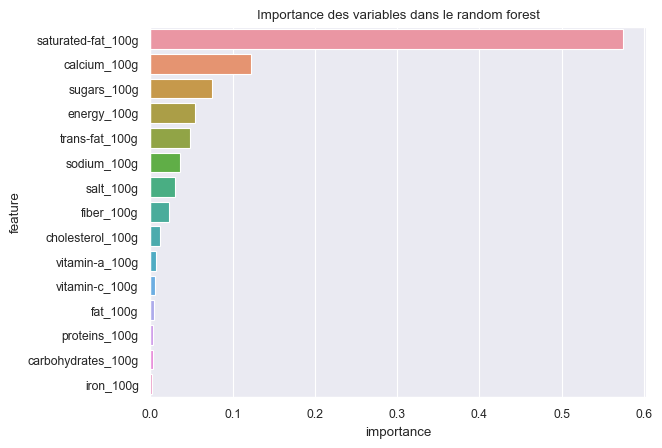

In [91]:
plt.title('Importance des variables dans le random forest')

sns.barplot(y = random_forest_features['feature'], x=random_forest_features['importance'])

<a id='p6'></a>

### Random Forest Regressor ( 5 variables)

In [92]:
params2 = {
    'n_estimators': [50, 100, 200],
    'verbose' : [1], 
#    'max_depth': [5, 10, 20],
#    'min_samples_split': [2, 5, 10]
}

rfr2 = GridSearchCV(RandomForestRegressor(), params2, cv = 5)

In [93]:
numeric_data.columns

Index(['energy_100g', 'fat_100g', 'saturated-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'vitamin-a_100g',
       'vitamin-c_100g', 'calcium_100g', 'iron_100g',
       'nutrition-score-fr_100g'],
      dtype='object')

In [94]:
X2 = numeric_data[['saturated-fat_100g', 'calcium_100g', 'energy_100g', 'sugars_100g', 'salt_100g']]
y2 = numeric_data['nutrition-score-fr_100g']
print(X2.shape, y2.shape)
scaler = StandardScaler()
X2 = scaler.fit_transform(X2)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=42)

rfr2.fit(X_train2, y_train2);

(52084, 5) (52084,)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    5.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    5.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

In [95]:
y_pred2 = rfr2.predict(X_test2);

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.5s finished


In [96]:
rfr2.best_estimator_

RandomForestRegressor(n_estimators=200, verbose=1)

In [97]:

print('R² sur jeu d\'entraînement : ', rfr2.best_estimator_.score(X_train2,y_train2))
print('R² sur jeu de test', rfr2.best_estimator_.score(X_test2,y_test2))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


R² sur jeu d'entraînement :  0.9930254048565726
R² sur jeu de test 0.9487831256289554


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.5s finished


In [98]:
resultat2 = pd.DataFrame({'nutriscore_reel' : y_test2, 'prediction' : rfr2.predict(X_test2)}).reset_index()
resultat2

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.4s finished


,index,nutriscore_reel,prediction
0,41493,12.0,14.290
1,2181,-1.0,-0.745
2,36797,11.0,10.765
3,48538,21.0,25.180
4,5649,-3.0,-1.215
...,...,...,...
10412,45108,20.0,18.900
10413,20433,9.0,9.725
10414,46707,25.0,21.940
10415,271,-1.0,0.495


In [99]:
resultat2.describe()

,index,nutriscore_reel,prediction
count,10417.000000,10417.000000,10417.000000
mean,26263.568494,8.220121,8.206762
std,15079.562100,9.122861,8.875684
min,177.000000,-14.000000,-9.915000
25%,13159.000000,1.000000,0.480000
50%,26405.000000,7.000000,7.300000
75%,39492.000000,15.000000,15.050000
max,52247.000000,35.000000,33.810000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.4s finished


(-17.5, 37.5, -17.5, 37.5)

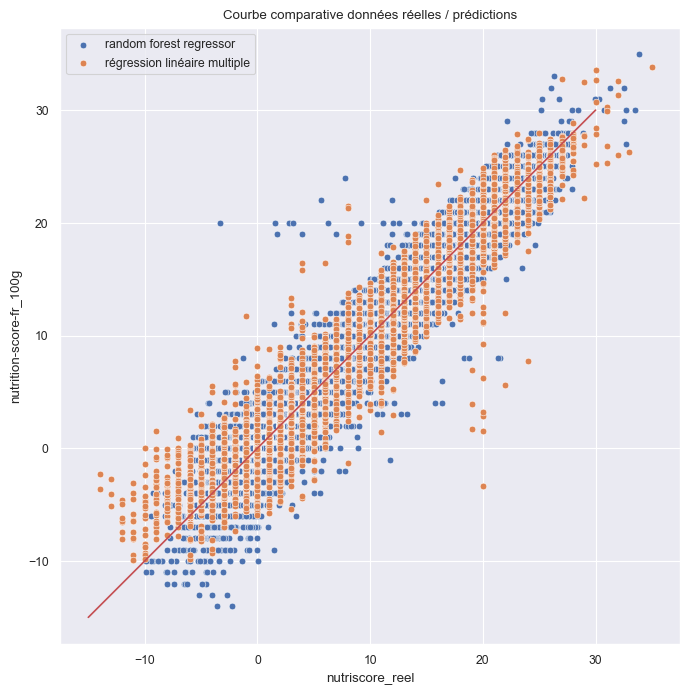

In [100]:
plt.figure(figsize=(8,8))
plt.title('Courbe comparative données réelles / prédictions')
sns.scatterplot(x = rfr2.predict(X_test2),y = y_test2)
sns.scatterplot(x = resultat2['nutriscore_reel'], y = resultat2['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])
sns.lineplot([-15,30],[-15,30], color='r')
ax = plt.gca()
ax.set_xlim(-2,5)
ax.set_ylim(-2,3)
ax.axis('equal')

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    0.5s finished


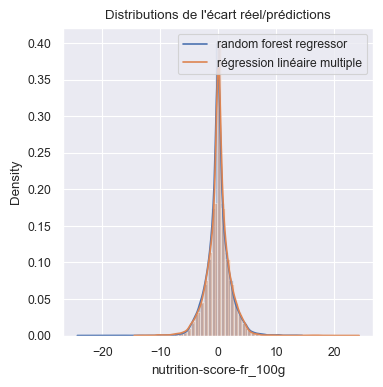

In [101]:
plt.figure(figsize=(4,4))
plt.title('Distributions de l\'écart réel/prédictions')
sns.distplot(rfr2.predict(X_test2) -  y_test2)
sns.distplot(resultat2['nutriscore_reel'] - resultat2['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])

In [102]:
data_reg2 = numeric_data[['saturated-fat_100g', 'calcium_100g', 'energy_100g', 'sugars_100g', 'salt_100g']]

In [103]:
random_forest_features2 = pd.DataFrame({'feature' : data_reg2.columns,
                                      'importance' : rfr2.best_estimator_.feature_importances_})
random_forest_features2

,feature,importance
0,saturated-fat_100g,0.597220
1,calcium_100g,0.135603
2,energy_100g,0.072051
3,sugars_100g,0.104001
4,salt_100g,0.091125


In [104]:
random_forest_features2.sort_values(by='importance',ascending=False, inplace=True)

<AxesSubplot:title={'center':'Importance des variables dans le random forest'}, xlabel='importance', ylabel='feature'>

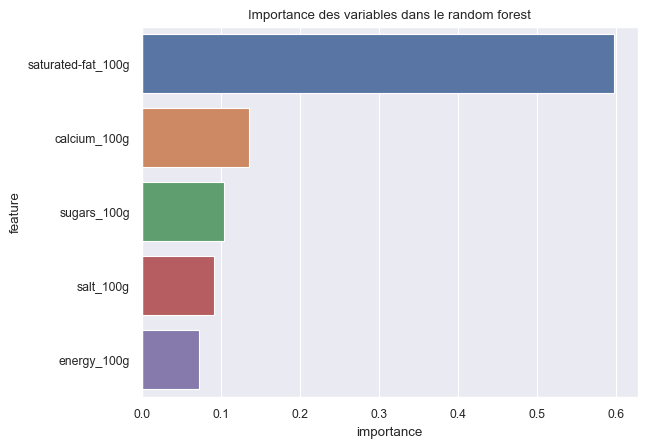

In [105]:
plt.title('Importance des variables dans le random forest')

sns.barplot(y = random_forest_features2['feature'], x=random_forest_features2['importance'])

##  <div style='background-color: #aac1cb ; padding: 5px; border: 2px solid black;'> 5. Sauvegarde le Model </div>  

[Haut de page](#sommaire)

In [106]:
from joblib import dump
dump(rfr, 'model.pkl')
dump(rfr2, 'model2.pkl')

['model2.pkl']